## Auxiliares

In [ ]:
import requests
from bs4 import BeautifulSoup
import zipfile
import io
import os

def baixar_shapefile_estado(estado):
    base_url = f'https://catalog.data.gov/dataset/tiger-line-shapefile-2021-state-{estado}-census-tracts'
    response = requests.get(base_url)
    if response.status_code != 200:
        return None
    soup = BeautifulSoup(response.text, 'html.parser')
    link_tag = soup.find('a', href=lambda href: href and href.endswith('.zip'))
    if not link_tag:
        return None
    download_url = link_tag['href']
    if not download_url.startswith('http'):
        download_url = 'https://catalog.data.gov' + download_url
    zip_response = requests.get(download_url)
    if zip_response.status_code != 200:
        return None
    with zipfile.ZipFile(io.BytesIO(zip_response.content)) as zip_ref:
        zip_ref.extractall('/content/')


In [ ]:
from google.colab import auth
auth.authenticate_user()

from googleapiclient.discovery import build
from googleapiclient.http import MediaIoBaseDownload
import io, os
drive_service = build("drive", "v3")

def download_from_folder_by_name(service, folder_id: str, filename: str, dest_path: str):
    q = f"'{folder_id}' in parents and name = '{filename}' and trashed = false"
    res = service.files().list(
        q=q,
        fields="files(id,name,size,mimeType)",
        supportsAllDrives=True,
        includeItemsFromAllDrives=True,
        pageSize=1,
    ).execute()
    files = res.get("files", [])
    if not files:
        raise FileNotFoundError(f"Arquivo não encontrado na pasta {folder_id}: {filename}")

    file_id = files[0]["id"]
    os.makedirs(os.path.dirname(dest_path), exist_ok=True)

    request = service.files().get_media(fileId=file_id, supportsAllDrives=True)
    with open(dest_path, "wb") as fh:
        downloader = MediaIoBaseDownload(fh, request)
        done = False
        while not done:
            status, done = downloader.next_chunk()
    return dest_path

# Georgia


Census: https://catalog.data.gov/dataset/tiger-line-shapefile-2021-state-alabama-census-tracts

In [ ]:
ESTADO = "Georgia"

In [ ]:
diretorio_principal = "/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main/"

In [ ]:
baixar_shapefile_estado("georgia")

<Axes: >

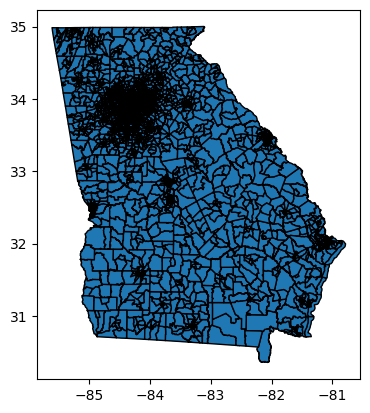

In [ ]:
import os
import geopandas as gpd

arquivos = [os.path.join("/content", f) for f in os.listdir("/content") if f.endswith(".shp")]
arquivo = max(arquivos, key=os.path.getmtime)
tl = gpd.read_file(arquivo).to_crs("EPSG:4326")
tl.plot(edgecolor="black")


In [ ]:
tl[["GEOID","geometry"]] ##TODO: Passar arquivo para HGI (CSV)

## BORO -> GEOID

,GEOID,geometry
0,13221960204,"POLYGON ((-83.27914 33.95465, -83.27861 33.954..."
1,13221960206,"POLYGON ((-83.16114 33.86625, -83.16112 33.866..."
2,13221960205,"POLYGON ((-83.19142 34.01254, -83.1909 34.0133..."
3,13221960203,"POLYGON ((-83.27581 33.84828, -83.27551 33.848..."
4,13153020900,"POLYGON ((-83.65171 32.61835, -83.64992 32.618..."
...,...,...
2791,13121011421,"POLYGON ((-84.34344 34.03709, -84.34324 34.038..."
2792,13179990000,"POLYGON ((-81.19493 31.56018, -81.19492 31.560..."
2793,13123080500,"POLYGON ((-84.52188 34.56451, -84.52173 34.565..."
2794,13123080200,"POLYGON ((-84.6571 34.7289, -84.65672 34.72959..."


In [ ]:
import geopandas as gpd
from shapely import wkt

boroughs = tl[["GEOID", "geometry"]].copy()
boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)

boroughs.to_csv(f"{diretorio_principal}/boroughs_area.csv", index=False)


/tmp/ipython-input-2001046065.py:5: UserWarning: Geometry column does not contain geometry.
  boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)


In [ ]:
boroughs

,GEOID,geometry
0,13221960204,"POLYGON ((-83.279145 33.95465, -83.27861 33.95..."
1,13221960206,"POLYGON ((-83.161143 33.866247, -83.161123 33...."
2,13221960205,"POLYGON ((-83.191416 34.012539, -83.190897 34...."
3,13221960203,"POLYGON ((-83.275809 33.848279, -83.275513 33...."
4,13153020900,"POLYGON ((-83.651713 32.618349, -83.649915 32...."
...,...,...
2791,13121011421,"POLYGON ((-84.343441 34.037092, -84.343243 34...."
2792,13179990000,"POLYGON ((-81.19493 31.560181, -81.194922 31.5..."
2793,13123080500,"POLYGON ((-84.521882 34.564512, -84.521729 34...."
2794,13123080200,"POLYGON ((-84.657098 34.728905, -84.656719 34...."


In [ ]:
!rm -rf /usr/local/lib/python3.12/dist-packages/~orch*
!pip cache purge


Files removed: 6 (250 kB)


In [ ]:
%pip -q install -U pip setuptools wheel
%pip -q uninstall -y torch torchvision torchaudio torch-geometric torch-scatter torch-sparse torch-cluster torch-spline-conv pyg-lib
%pip -q install --no-cache-dir geopandas shapely libpysal h3 h3ronpy pyarrow scipy scikit-learn


In [ ]:
%pip -q install --no-cache-dir torch==2.4.0 torchvision==0.19.0 torchaudio==2.4.0 --index-url https://download.pytorch.org/whl/cpu
%pip -q install --no-cache-dir pyg-lib torch-scatter torch-sparse torch-cluster torch-spline-conv torch-geometric -f https://data.pyg.org/whl/torch-2.4.0+cpu.html


In [ ]:
%cd {diretorio_principal}

/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main


## POI Embedding

In [ ]:
FOLDER_ID_CRUS = "1cV807NNGn4gSDX-7fkJ83rlr0nRo4y89"
FOLDER_ID_SEPARATED = "1XUWhd59YDe8dSrTb6eZlLvhVcLSGpZ7n"

filename = f"checkins_{ESTADO}.csv"

path_crus = f"estados/crus/{filename}"
path_sep  = f"estados/separated/{filename}"

print("Baixando (crus)...")
download_from_folder_by_name(drive_service,FOLDER_ID_CRUS, filename, path_crus)

print("Baixando (separated)...")
download_from_folder_by_name(drive_service,FOLDER_ID_SEPARATED, filename, path_sep)

print("Concluído:", path_crus, "e", path_sep)


Baixando (crus)...
Baixando (separated)...
Concluído: estados/crus/checkins_Georgia.csv e estados/separated/checkins_Georgia.csv


In [ ]:
import pandas as pd, numpy as np, ast
import geopandas as gpd
from shapely.geometry import Point


CHECKIN_NAO_CRU = f"estados/crus/checkins_{ESTADO}.csv"
CHECKIN_CRU     = f"estados/separated/checkins_{ESTADO}.csv"
OUT_POIS        = "pois_gowalla.csv"

df_labeled = pd.read_csv(CHECKIN_NAO_CRU)
df_raw     = pd.read_csv(CHECKIN_CRU)

lon_col_raw = "lng" if "lng" in df_raw.columns else "longitude"
lat_col_raw = "lat" if "lat" in df_raw.columns else "latitude"
lon_col_lab = "lng" if "lng" in df_labeled.columns else ("longitude" if "longitude" in df_labeled.columns else None)
lat_col_lab = "lat" if "lat" in df_labeled.columns else ("latitude" if "latitude" in df_labeled.columns else None)

def parse_names(cell):
    try:
        lst = ast.literal_eval(cell)
        if isinstance(lst, list):
            return [d.get("name") for d in lst if isinstance(d, dict) and "name" in d]
    except Exception:
        pass
    return []

df_raw["__cat_names"] = df_raw["spot_categories"].fillna("[]").apply(parse_names)

def first_or_none(lst):
    return lst[0] if (isinstance(lst, list) and len(lst) > 0) else None

df_raw["__fclass_name"] = df_raw["__cat_names"].apply(first_or_none)

fclass_by_place = (df_raw.dropna(subset=["__fclass_name"])
                          .groupby("placeid")["__fclass_name"]
                          .agg(lambda s: s.mode().iat[0] if not s.mode().empty else s.iloc[0]))

cat_by_place = (df_labeled.dropna(subset=["category"])
                          .groupby("placeid")["category"]
                          .agg(lambda s: s.mode().iat[0] if not s.mode().empty else s.iloc[0]))

coords_raw = (
    df_raw[[lat_col_raw, lon_col_raw, "placeid"]]
    .rename(columns={lat_col_raw: "latitude", lon_col_raw: "longitude"})
    .dropna(subset=["latitude", "longitude", "placeid"])
    .copy()
)


coords_raw = coords_raw.dropna()

pois = pd.DataFrame({"feature_id": coords_raw.index})
pois["feature_id"] = pois["feature_id"].astype(int)

pois["fclass_name"]   = fclass_by_place.reindex(pois["feature_id"]).values
pois["category_name"] = cat_by_place.reindex(pois["feature_id"]).values

pois = pois.dropna(subset=["fclass_name", "category_name"]).reset_index(drop=True)

gdf = gpd.GeoDataFrame(
    pois,
    geometry=gpd.points_from_xy(coords_raw.loc[pois["feature_id"], "longitude"].values,
                                coords_raw.loc[pois["feature_id"], "latitude"].values),
    crs="EPSG:4326"
)
gdf["geometry"] = gdf.geometry.apply(lambda p: p.wkt)

fclass_vocab = {n:i for i,n in enumerate(pd.Series(gdf["fclass_name"]).dropna().unique())}
cat_vocab    = {n:i for i,n in enumerate(pd.Series(gdf["category_name"]).dropna().unique())}

gdf["fclass"]   = gdf["fclass_name"].map(lambda n: fclass_vocab.get(n, -1)).astype(int)
gdf["category"] = gdf["category_name"].map(lambda n: cat_vocab.get(n, -1)).astype(int)

gdf = gdf[(gdf["fclass"]>=0) & (gdf["category"]>=0)].reset_index(drop=True)

pois_out = gdf[["feature_id", "category", "fclass", "geometry"]].copy()
pois_out.to_csv(OUT_POIS, index=False)



/tmp/ipython-input-1134740033.py:66: UserWarning: Geometry column does not contain geometry.
  gdf["geometry"] = gdf.geometry.apply(lambda p: p.wkt)


In [ ]:
# @title
import geopandas as gpd
from shapely.geometry import box

lat_min, lat_max = df["latitude"].min(), df["latitude"].max()
lon_min, lon_max = df["longitude"].min(), df["longitude"].max()
area = box(lon_min, lat_min, lon_max, lat_max).buffer(0.01)

boroughs = gpd.GeoDataFrame(geometry=[area], crs="EPSG:4326")

boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)
boroughs.to_csv("boroughs_area.csv", index=False)


In [ ]:
import sys
module_dir = f'{diretorio_principal}/region-embedding/baselines/poi-encoder'

sys.path.insert(0, module_dir)

In [ ]:
from POIEmbedding import PreProcess

PreProcess("pois_gowalla.csv", "boroughs_area.csv", h3=False).run() ##TODO H3 FALSO


boroughs cols: ['GEOID', 'geometry']
         GEOID                                           geometry
0  13221960204  POLYGON ((-83.27914 33.95465, -83.27861 33.954...
1  13221960206  POLYGON ((-83.16114 33.86625, -83.16112 33.866...
2  13221960205  POLYGON ((-83.19142 34.01254, -83.1909 34.0133...
3  13221960203  POLYGON ((-83.27581 33.84828, -83.27551 33.848...
4  13153020900  POLYGON ((-83.65171 32.61835, -83.64992 32.618...
            GEOID                                           geometry
0     13221960204  POLYGON ((-83.27914 33.95465, -83.27861 33.954...
1     13221960206  POLYGON ((-83.16114 33.86625, -83.16112 33.866...
2     13221960205  POLYGON ((-83.19142 34.01254, -83.1909 34.0133...
3     13221960203  POLYGON ((-83.27581 33.84828, -83.27551 33.848...
4     13153020900  POLYGON ((-83.65171 32.61835, -83.64992 32.618...
...           ...                                                ...
2791  13121011421  POLYGON ((-84.34344 34.03709, -84.34324 34.038...
2792  131799900

In [ ]:
from POIEmbedding import POI2Vec
p = POI2Vec()
p.train()
p.save_walks()


       source  target    weight
0           0       5  1.000000
1           0      17  1.000000
2           0      14  1.000000
3           0      23  1.000000
4           0      19  1.000000
...       ...     ...       ...
16877    5621    5623  1.000000
16878    5622    5624  0.504345
16879    5622    5623  1.000000
16880    5629    5630  0.237022
16881    5631    5632  0.498000

[16882 rows x 3 columns]


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
from POIEmbedding import POI2Vec
from model import POISet, EmbeddingModel
import torch, torch.utils.data as tud

poi2vec = POI2Vec()
poi2vec.read_walks()
poi2vec.get_global_second_class_walks()

second_class_hierarchy_pairs = list(set([tuple(x) for x in poi2vec.pois[["category","fclass"]].to_numpy()]))
dataset = POISet(
    poi2vec.second_class_number,
    poi2vec.second_class_walks,
    poi2vec.global_second_class_walks,
    k=5
)
model = EmbeddingModel(
    vocab_size=poi2vec.second_class_number,
    embed_size=64,
    second_class_hierarchy_pairs=second_class_hierarchy_pairs,
    le_lambda=1e-8
)

loader = tud.DataLoader(dataset, batch_size=2048, shuffle=True)
opt = torch.optim.Adam(model.parameters(), lr=5e-2)
for e in range(5):
    for i,(inp,pos,neg) in enumerate(loader):
        opt.zero_grad()
        loss,_ = model(inp.long(), pos.long(), neg.long())
        loss.backward()
        opt.step()

torch.save({"in_embed_georgia.weight": model.clone_input_embedding()}, "poi-encoder-gowalla-h3_georgia.tensor")


       source  target    weight
0           0       5  1.000000
1           0      17  1.000000
2           0      14  1.000000
3           0      23  1.000000
4           0      19  1.000000
...       ...     ...       ...
16877    5621    5623  1.000000
16878    5622    5624  0.504345
16879    5622    5623  1.000000
16880    5629    5630  0.237022
16881    5631    5632  0.498000

[16882 rows x 3 columns]


## HGI

In [ ]:
import sys
module_dir = f'{diretorio_principal}/region-embedding/baselines/HGI/preprocess'

sys.path.insert(0, module_dir)

In [ ]:
import torch, numpy as np, pandas as pd
from torch_geometric.data import Data
from main import Preprocess

POIS = "pois_gowalla.csv"
REGS = "boroughs_area.csv"

data_dict = Preprocess(POIS, REGS, emb_filename=None, h3=False).get_data_torch()

loc_pt_path = "/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main/poi_embeddings_location-georgia.pt"
blob = torch.load(loc_pt_path, map_location="cpu")
E = blob["embeddings"].detach().cpu().numpy()
placeids = [str(p) for p in blob["placeids"]]
placeid2idx = {pid: i for i, pid in enumerate(placeids)}
D = E.shape[1]

order = pd.read_csv("poi_index.csv")
order["feature_id"] = order["feature_id"].astype(str)

X = np.zeros((len(order), D), dtype=np.float32)
for i, pid in enumerate(order["feature_id"].tolist()):
    idx = placeid2idx.get(pid)
    if idx is None:
        raise KeyError(f"placeid {pid} não encontrado em {loc_pt_path}. Gere embeddings para todos os POIs.")
    X[i] = E[idx]

import numpy as np
ei = np.asarray(data_dict['edge_index'])

g = Data(
    x=torch.tensor(X, dtype=torch.float32),
    edge_index=torch.tensor(data_dict['edge_index'], dtype=torch.long),
    edge_weight=torch.tensor(data_dict['edge_weight'], dtype=torch.float32),
)
g.region_id  = torch.tensor(data_dict['region_id'], dtype=torch.long)
g.region_area = torch.tensor(data_dict['region_area'], dtype=torch.float32)
g.coarse_region_similarity = torch.tensor(data_dict['coarse_region_similarity'], dtype=torch.float32)
g.region_adjacency = torch.tensor(data_dict['region_adjacency'], dtype=torch.long)

torch.save(g, "gowalla.pt")


reading poi data
reading boroughs data


/usr/local/lib/python3.12/dist-packages/libpysal/weights/util.py:1618: UserWarning: The weights matrix is not fully connected: 
 There are 119 disconnected components.
 There are 60 islands with ids: 2, 40, 41, 46, 48, 61, 97, 154, 159, 161, 163, 276, 302, 304, 305, 417, 418, 422, 431, 434, 451, 514, 521, 526, 595, 598, 601, 604, 636, 666, 686, 750, 769, 796, 802, 813, 816, 817, 820, 841, 855, 877, 879, 883, 886, 888, 889, 890, 892, 903, 906, 942, 943, 951, 953, 963, 964, 971, 975, 976.
  return W(neighbors, **kwargs)


reading boroughs data
creating graph
get region ids
reading embedding
creating region adjacency
creating region similarity by cosine similarity of embeddings
finishing preprocessing


/usr/local/lib/python3.12/dist-packages/libpysal/weights/util.py:1618: UserWarning: The weights matrix is not fully connected: 
 There are 119 disconnected components.
 There are 60 islands with ids: 2, 40, 41, 46, 48, 61, 97, 154, 159, 161, 163, 276, 302, 304, 305, 417, 418, 422, 431, 434, 451, 514, 521, 526, 595, 598, 601, 604, 636, 666, 686, 750, 769, 796, 802, 813, 816, 817, 820, 841, 855, 877, 879, 883, 886, 888, 889, 890, 892, 903, 906, 942, 943, 951, 953, 963, 964, 971, 975, 976.
  return W(neighbors, **kwargs)
/tmp/ipython-input-1528723007.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This lim

In [ ]:
import os, pickle as pkl, torch
from torch_geometric.data import Data

os.makedirs("./data", exist_ok=True)

g = torch.load("./gowalla.pt", map_location="cpu")

data_dict = {
    "node_features": g.x.detach().cpu().numpy(),
    "edge_index": g.edge_index.detach().cpu().numpy(),
    "edge_weight": g.edge_weight.detach().cpu().numpy(),
    "region_id": g.region_id.detach().cpu().numpy(),
    "region_area": g.region_area.detach().cpu().numpy(),
    "coarse_region_similarity": g.coarse_region_similarity.detach().cpu().numpy(),
    "region_adjacency": g.region_adjacency.detach().cpu().numpy(),
}

with open("./data/gowalla_hgi_data.pkl", "wb") as f:
    pkl.dump(data_dict, f)



/tmp/ipython-input-1595378934.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  g = torch.load("./gowalla.pt", map_location="cpu")


In [ ]:
import numpy as np

R_from_id = int(np.max(data_dict["region_id"])) + 1
R_area    = len(data_dict["region_area"])
R_adj     = int(data_dict["region_adjacency"].max()) + 1
R_sim     = data_dict["coarse_region_similarity"].shape[0]

print("R from id :", R_from_id)
print("R area    :", R_area)
print("R adj     :", R_adj)
print("R sim     :", R_sim)

assert R_from_id == R_area == R_adj == R_sim, "Desalinhad"


R from id : 985
R area    : 985
R adj     : 985
R sim     : 985


In [ ]:
!python {diretorio_principal}/region-embedding/baselines/HGI/train.py --city gowalla --dim 64 --alpha 0.5 --attention_head 4 --epoch 300 --device cpu --save_name gowalla_h3


Start training region embeddings for the city of gowalla
  0% 0/300 [00:00<?, ?it/s]
Traceback (most recent call last):
  File "/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main//region-embedding/baselines/HGI/train.py", line 74, in <module>
    loss = train(epoch)
           ^^^^^^^^^^^^
  File "/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main//region-embedding/baselines/HGI/train.py", line 60, in train
    pos_poi_emb_list, neg_poi_emb_list, region_emb, neg_region_emb, city_emb = model(data)
                                                                               ^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/torch/nn/modules/module.py", line 1553, in _wrapped_call_impl
    return self._call_impl(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/torch/nn/modules/module.py", line 1562, in _call_impl
    return forward_call(*args, **kw

# Nebraska


Census: https://catalog.data.gov/dataset/tiger-line-shapefile-2021-state-nebraska-census-tracts

In [ ]:
ESTADO = "Nebraska"

In [ ]:
diretorio_principal = "/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main/"

In [ ]:
baixar_shapefile_estado("nebraska")

<Axes: >

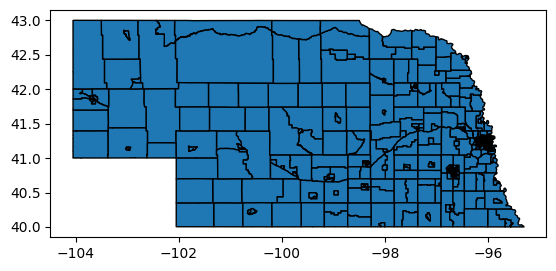

In [ ]:
import os
import geopandas as gpd

arquivos = [os.path.join("/content", f) for f in os.listdir("/content") if f.endswith(".shp")]
arquivo = max(arquivos, key=os.path.getmtime)
tl = gpd.read_file(arquivo).to_crs("EPSG:4326")
tl.plot(edgecolor="black")


In [ ]:
tl[["GEOID","geometry"]] ##TODO: Passar arquivo para HGI (CSV)

## BORO -> GEOID

,GEOID,geometry
0,31137967000,"POLYGON ((-99.42555 40.40799, -99.42522 40.408..."
1,31137967200,"POLYGON ((-99.64441 40.5163, -99.64441 40.5173..."
2,31137967100,"POLYGON ((-99.47431 40.496, -99.47384 40.496, ..."
3,31139979200,"POLYGON ((-97.83498 42.2488, -97.83498 42.2492..."
4,31139979100,"POLYGON ((-97.56289 42.17675, -97.56281 42.177..."
...,...,...
548,31029961900,"POLYGON ((-102.0518 40.36007, -102.05156 40.37..."
549,31153010503,"POLYGON ((-96.00926 41.1907, -96.00913 41.1907..."
550,31183973600,"POLYGON ((-98.76118 42.07117, -98.76116 42.072..."
551,31055007442,"POLYGON ((-96.15807 41.27397, -96.15807 41.274..."


In [ ]:
import geopandas as gpd
from shapely import wkt

boroughs = tl[["GEOID", "geometry"]].copy()
boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)

boroughs.to_csv(f"{diretorio_principal}/boroughs_area.csv", index=False)


/tmp/ipython-input-2001046065.py:5: UserWarning: Geometry column does not contain geometry.
  boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)


In [ ]:
boroughs

,GEOID,geometry
0,31137967000,"POLYGON ((-99.425549 40.407986, -99.42522 40.4..."
1,31137967200,"POLYGON ((-99.644407 40.516296, -99.644406 40...."
2,31137967100,"POLYGON ((-99.474313 40.496, -99.473837 40.495..."
3,31139979200,"POLYGON ((-97.834977 42.248801, -97.834983 42...."
4,31139979100,"POLYGON ((-97.56289 42.176754, -97.562806 42.1..."
...,...,...
548,31029961900,"POLYGON ((-102.051798 40.360069, -102.051555 4..."
549,31153010503,"POLYGON ((-96.009261 41.190702, -96.009134 41...."
550,31183973600,"POLYGON ((-98.761183 42.071172, -98.761164 42...."
551,31055007442,"POLYGON ((-96.158074 41.273971, -96.158074 41...."


In [ ]:
!rm -rf /usr/local/lib/python3.12/dist-packages/~orch*
!pip cache purge


Files removed: 6 (250 kB)


In [ ]:
%pip -q install -U pip setuptools wheel
%pip -q uninstall -y torch torchvision torchaudio torch-geometric torch-scatter torch-sparse torch-cluster torch-spline-conv pyg-lib
%pip -q install --no-cache-dir geopandas shapely libpysal h3 h3ronpy pyarrow scipy scikit-learn


In [ ]:
%pip -q install --no-cache-dir torch==2.4.0 torchvision==0.19.0 torchaudio==2.4.0 --index-url https://download.pytorch.org/whl/cpu
%pip -q install --no-cache-dir pyg-lib torch-scatter torch-sparse torch-cluster torch-spline-conv torch-geometric -f https://data.pyg.org/whl/torch-2.4.0+cpu.html


In [ ]:
%cd {diretorio_principal}

/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main


## POI Embedding

In [ ]:
FOLDER_ID_CRUS = "1cV807NNGn4gSDX-7fkJ83rlr0nRo4y89"
FOLDER_ID_SEPARATED = "1XUWhd59YDe8dSrTb6eZlLvhVcLSGpZ7n"

filename = f"checkins_{ESTADO}.csv"

path_crus = f"estados/crus/{filename}"
path_sep  = f"estados/separated/{filename}"

print("Baixando (crus)...")
download_from_folder_by_name(drive_service,FOLDER_ID_CRUS, filename, path_crus)

print("Baixando (separated)...")
download_from_folder_by_name(drive_service,FOLDER_ID_SEPARATED, filename, path_sep)

print("Concluído:", path_crus, "e", path_sep)


Baixando (crus)...
Baixando (separated)...
Concluído: estados/crus/checkins_Nebraska.csv e estados/separated/checkins_Nebraska.csv


In [ ]:
import pandas as pd, numpy as np, ast
import geopandas as gpd
from shapely.geometry import Point


CHECKIN_NAO_CRU = f"estados/crus/checkins_{ESTADO}.csv"
CHECKIN_CRU     = f"estados/separated/checkins_{ESTADO}.csv"
OUT_POIS        = "pois_gowalla.csv"

df_labeled = pd.read_csv(CHECKIN_NAO_CRU)
df_raw     = pd.read_csv(CHECKIN_CRU)

lon_col_raw = "lng" if "lng" in df_raw.columns else "longitude"
lat_col_raw = "lat" if "lat" in df_raw.columns else "latitude"
lon_col_lab = "lng" if "lng" in df_labeled.columns else ("longitude" if "longitude" in df_labeled.columns else None)
lat_col_lab = "lat" if "lat" in df_labeled.columns else ("latitude" if "latitude" in df_labeled.columns else None)

def parse_names(cell):
    try:
        lst = ast.literal_eval(cell)
        if isinstance(lst, list):
            return [d.get("name") for d in lst if isinstance(d, dict) and "name" in d]
    except Exception:
        pass
    return []

df_raw["__cat_names"] = df_raw["spot_categories"].fillna("[]").apply(parse_names)

def first_or_none(lst):
    return lst[0] if (isinstance(lst, list) and len(lst) > 0) else None

df_raw["__fclass_name"] = df_raw["__cat_names"].apply(first_or_none)

fclass_by_place = (df_raw.dropna(subset=["__fclass_name"])
                          .groupby("placeid")["__fclass_name"]
                          .agg(lambda s: s.mode().iat[0] if not s.mode().empty else s.iloc[0]))

cat_by_place = (df_labeled.dropna(subset=["category"])
                          .groupby("placeid")["category"]
                          .agg(lambda s: s.mode().iat[0] if not s.mode().empty else s.iloc[0]))

coords_raw = (df_raw.groupby("placeid")[[lat_col_raw, lon_col_raw]]
                    .mean()
                    .rename(columns={lat_col_raw: "latitude", lon_col_raw: "longitude"}))

if coords_raw.empty and lon_col_lab and lat_col_lab and (lon_col_lab in df_labeled.columns) and (lat_col_lab in df_labeled.columns):
    coords_raw = (df_labeled.groupby("placeid")[[lat_col_lab, lon_col_lab]]
                           .mean()
                           .rename(columns={lat_col_lab: "latitude", lon_col_lab: "longitude"}))

coords_raw = coords_raw.dropna()

pois = pd.DataFrame({"feature_id": coords_raw.index})
pois["feature_id"] = pois["feature_id"].astype(int)

pois["fclass_name"]   = fclass_by_place.reindex(pois["feature_id"]).values
pois["category_name"] = cat_by_place.reindex(pois["feature_id"]).values

pois = pois.dropna(subset=["fclass_name", "category_name"]).reset_index(drop=True)

gdf = gpd.GeoDataFrame(
    pois,
    geometry=gpd.points_from_xy(coords_raw.loc[pois["feature_id"], "longitude"].values,
                                coords_raw.loc[pois["feature_id"], "latitude"].values),
    crs="EPSG:4326"
)
gdf["geometry"] = gdf.geometry.apply(lambda p: p.wkt)

fclass_vocab = {n:i for i,n in enumerate(pd.Series(gdf["fclass_name"]).dropna().unique())}
cat_vocab    = {n:i for i,n in enumerate(pd.Series(gdf["category_name"]).dropna().unique())}

gdf["fclass"]   = gdf["fclass_name"].map(lambda n: fclass_vocab.get(n, -1)).astype(int)
gdf["category"] = gdf["category_name"].map(lambda n: cat_vocab.get(n, -1)).astype(int)

gdf = gdf[(gdf["fclass"]>=0) & (gdf["category"]>=0)].reset_index(drop=True)

pois_out = gdf[["feature_id", "category", "fclass", "geometry"]].copy()
pois_out.to_csv(OUT_POIS, index=False)



/tmp/ipython-input-2811998353.py:67: UserWarning: Geometry column does not contain geometry.
  gdf["geometry"] = gdf.geometry.apply(lambda p: p.wkt)


In [ ]:
# @title
import geopandas as gpd
from shapely.geometry import box

lat_min, lat_max = df["latitude"].min(), df["latitude"].max()
lon_min, lon_max = df["longitude"].min(), df["longitude"].max()
area = box(lon_min, lat_min, lon_max, lat_max).buffer(0.01)

boroughs = gpd.GeoDataFrame(geometry=[area], crs="EPSG:4326")

boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)
boroughs.to_csv("boroughs_area.csv", index=False)


In [ ]:
import sys
module_dir = f'{diretorio_principal}/region-embedding/baselines/poi-encoder'

sys.path.insert(0, module_dir)

In [ ]:
from POIEmbedding import PreProcess

PreProcess("pois_gowalla.csv", "boroughs_area.csv", h3=False).run() ##TODO H3 FALSO


boroughs cols: ['GEOID', 'geometry']
         GEOID                                           geometry
0  31137967000  POLYGON ((-99.42555 40.40799, -99.42522 40.408...
1  31137967200  POLYGON ((-99.64441 40.5163, -99.64441 40.5173...
2  31137967100  POLYGON ((-99.47431 40.496, -99.47384 40.496, ...
3  31139979200  POLYGON ((-97.83498 42.2488, -97.83498 42.2492...
4  31139979100  POLYGON ((-97.56289 42.17675, -97.56281 42.177...
           GEOID                                           geometry
0    31137967000  POLYGON ((-99.42555 40.40799, -99.42522 40.408...
1    31137967200  POLYGON ((-99.64441 40.5163, -99.64441 40.5173...
2    31137967100  POLYGON ((-99.47431 40.496, -99.47384 40.496, ...
3    31139979200  POLYGON ((-97.83498 42.2488, -97.83498 42.2492...
4    31139979100  POLYGON ((-97.56289 42.17675, -97.56281 42.177...
..           ...                                                ...
548  31029961900  POLYGON ((-102.0518 40.36007, -102.05156 40.37...
549  31153010503  POLYG

In [ ]:
import pandas as pd
import numpy as np
import torch
from shapely import wkt

def build_node_features_from_location_encoder(pois_csv_path: str,
                                              loc_embed_pt_path: str,
                                              placeid_col: str = "feature_id"):

    df_pois = pd.read_csv(pois_csv_path)
    if df_pois["geometry"].dtype == object:
        df_pois["geometry"] = df_pois["geometry"].apply(wkt.loads)

    blob = torch.load(loc_embed_pt_path, map_location="cpu")
    E = blob["embeddings"].detach().cpu().numpy()
    placeids = [str(p) for p in blob["placeids"]]
    placeid2idx = {pid: i for i, pid in enumerate(placeids)}

    ids = df_pois[placeid_col].astype(str).tolist()
    D = E.shape[1]
    X = np.zeros((len(ids), D), dtype=np.float32)

    for i, pid in enumerate(ids):
        idx = placeid2idx.get(pid)
        if idx is None:
            raise KeyError(f"placeid {pid} não encontrado em {loc_embed_pt_path}. "
                           f"")
        X[i] = E[idx]

    return X, df_pois


In [ ]:
# @title
from POIEmbedding import POI2Vec
p = POI2Vec()
p.train()
p.save_walks()


      source  target    weight
0          0    1340  0.498964
1          0     639  0.412093
2          0    2793  0.503600
3          0    2537  0.729299
4          1    2743  0.525857
...      ...     ...       ...
8448    2816    2817  0.629293
8449    2816    2818  0.652857
8450    2817    2819  0.501285
8451    2817    2818  0.747688
8452    2818    2819  0.507854

[8453 rows x 3 columns]


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
# @title
from POIEmbedding import POI2Vec
from model import POISet, EmbeddingModel
import torch, torch.utils.data as tud

poi2vec = POI2Vec()
poi2vec.read_walks()
poi2vec.get_global_second_class_walks()

second_class_hierarchy_pairs = list(set([tuple(x) for x in poi2vec.pois[["category","fclass"]].to_numpy()]))
dataset = POISet(
    poi2vec.second_class_number,
    poi2vec.second_class_walks,
    poi2vec.global_second_class_walks,
    k=5
)
model = EmbeddingModel(
    vocab_size=poi2vec.second_class_number,
    embed_size=64,
    second_class_hierarchy_pairs=second_class_hierarchy_pairs,
    le_lambda=1e-8
)

loader = tud.DataLoader(dataset, batch_size=2048, shuffle=True)
opt = torch.optim.Adam(model.parameters(), lr=5e-2)
for e in range(5):
    for i,(inp,pos,neg) in enumerate(loader):
        opt.zero_grad()
        loss,_ = model(inp.long(), pos.long(), neg.long())
        loss.backward()
        opt.step()

torch.save({"in_embed.weight": model.clone_input_embedding()}, "poi-encoder-gowalla-h3.tensor")


      source  target    weight
0          0    1340  0.498964
1          0     639  0.412093
2          0    2793  0.503600
3          0    2537  0.729299
4          1    2743  0.525857
...      ...     ...       ...
8448    2816    2817  0.629293
8449    2816    2818  0.652857
8450    2817    2819  0.501285
8451    2817    2818  0.747688
8452    2818    2819  0.507854

[8453 rows x 3 columns]


## HGI

In [ ]:
import sys
module_dir = f'{diretorio_principal}/region-embedding/baselines/HGI/preprocess'

sys.path.insert(0, module_dir)

In [ ]:
import torch, numpy as np, pandas as pd
from torch_geometric.data import Data
from main import Preprocess

POIS = "pois_gowalla.csv"
REGS = "boroughs_area.csv"

data_dict = Preprocess(POIS, REGS, emb_filename=None, h3=False).get_data_torch()

loc_pt_path = "/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main/poi_embeddings_location.pt"
blob = torch.load(loc_pt_path, map_location="cpu")
E = blob["embeddings"].detach().cpu().numpy()
placeids = [str(p) for p in blob["placeids"]]
placeid2idx = {pid: i for i, pid in enumerate(placeids)}
D = E.shape[1]

order = pd.read_csv("poi_index.csv")
order["feature_id"] = order["feature_id"].astype(str)

X = np.zeros((len(order), D), dtype=np.float32)
for i, pid in enumerate(order["feature_id"].tolist()):
    idx = placeid2idx.get(pid)
    if idx is None:
        raise KeyError(f"placeid {pid} não encontrado em {loc_pt_path}. Gere embeddings para todos os POIs.")
    X[i] = E[idx]

import numpy as np
ei = np.asarray(data_dict['edge_index'])
assert ei.max() < X.shape[0], "edge_index referencia nó >= len(X) — ordem quebrou"

g = Data(
    x=torch.tensor(X, dtype=torch.float32),
    edge_index=torch.tensor(data_dict['edge_index'], dtype=torch.long),
    edge_weight=torch.tensor(data_dict['edge_weight'], dtype=torch.float32),
)
g.region_id  = torch.tensor(data_dict['region_id'], dtype=torch.long)
g.region_area = torch.tensor(data_dict['region_area'], dtype=torch.float32)
g.coarse_region_similarity = torch.tensor(data_dict['coarse_region_similarity'], dtype=torch.float32)
g.region_adjacency = torch.tensor(data_dict['region_adjacency'], dtype=torch.long)

torch.save(g, "gowalla.pt")


reading poi data
reading boroughs data


/usr/local/lib/python3.12/dist-packages/libpysal/weights/util.py:1618: UserWarning: The weights matrix is not fully connected: 
 There are 19 disconnected components.
 There are 9 islands with ids: 10, 44, 47, 223, 339, 340, 404, 407, 410.
  return W(neighbors, **kwargs)
/usr/local/lib/python3.12/dist-packages/libpysal/weights/util.py:1618: UserWarning: The weights matrix is not fully connected: 
 There are 19 disconnected components.
 There are 9 islands with ids: 10, 44, 47, 223, 339, 340, 404, 407, 410.
  return W(neighbors, **kwargs)
/tmp/ipython-input-2460681102.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped

reading boroughs data
creating graph
get region ids
reading embedding
creating region adjacency
creating region similarity by cosine similarity of embeddings
finishing preprocessing


In [ ]:
import os, pickle as pkl, torch
from torch_geometric.data import Data

os.makedirs("./data", exist_ok=True)

g = torch.load("./gowalla.pt", map_location="cpu")

data_dict = {
    "node_features": g.x.detach().cpu().numpy(),
    "edge_index": g.edge_index.detach().cpu().numpy(),
    "edge_weight": g.edge_weight.detach().cpu().numpy(),
    "region_id": g.region_id.detach().cpu().numpy(),
    "region_area": g.region_area.detach().cpu().numpy(),
    "coarse_region_similarity": g.coarse_region_similarity.detach().cpu().numpy(),
    "region_adjacency": g.region_adjacency.detach().cpu().numpy(),
}

with open("./data/gowalla_hgi_data.pkl", "wb") as f:
    pkl.dump(data_dict, f)



/tmp/ipython-input-1595378934.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  g = torch.load("./gowalla.pt", map_location="cpu")


In [ ]:
import numpy as np

R_from_id = int(np.max(data_dict["region_id"])) + 1
R_area    = len(data_dict["region_area"])
R_adj     = int(data_dict["region_adjacency"].max()) + 1
R_sim     = data_dict["coarse_region_similarity"].shape[0]

print("R from id :", R_from_id)
print("R area    :", R_area)
print("R adj     :", R_adj)
print("R sim     :", R_sim)

assert R_from_id == R_area == R_adj == R_sim, "Desalinhad"


R from id : 415
R area    : 415
R adj     : 415
R sim     : 415


In [ ]:
!python {diretorio_principal}/region-embedding/baselines/HGI/train.py --city gowalla --dim 64 --alpha 0.5 --attention_head 4 --epoch 300 --device cpu --save_name gowalla_h3


Streaming output truncated to the last 5000 lines.
        [-0.1656,  0.0533, -0.0382,  ..., -0.0689, -0.0063, -0.0058]],
       requires_grad=True) Parameter containing:
tensor([[ 0.0789, -0.0211,  0.0419,  ..., -0.1202,  0.0974,  0.0237],
        [-0.0341, -0.0142,  0.0765,  ..., -0.1038, -0.0470, -0.0857],
        [-0.0915, -0.0380, -0.0681,  ...,  0.0509, -0.0794,  0.0784],
        ...,
        [ 0.0639, -0.0683,  0.0689,  ...,  0.1035,  0.1118,  0.0351],
        [-0.0801, -0.0512,  0.1104,  ..., -0.0361,  0.0791,  0.0926],
        [-0.0703,  0.0074,  0.0702,  ...,  0.0917,  0.0633, -0.0426]],
       requires_grad=True)
Parameter containing:
tensor([[-0.0478,  0.0514, -0.0833,  ...,  0.0202, -0.0096, -0.1220],
        [ 0.0646, -0.0282,  0.0291,  ..., -0.0354, -0.0370, -0.0099],
        [-0.0110,  0.1517,  0.0844,  ...,  0.1119,  0.0903, -0.0946],
        ...,
        [ 0.0107, -0.0427,  0.1069,  ...,  0.1078,  0.1346, -0.1231],
        [-0.0484,  0.0367, -0.0406,  ...,  0.0890, -0

# Texas


Census: https://catalog.data.gov/dataset/tiger-line-shapefile-2021-state-texas-census-tracts

In [ ]:
ESTADO = "Texas"

In [ ]:
diretorio_principal = "/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main/"

In [ ]:
baixar_shapefile_estado("texas")

<Axes: >

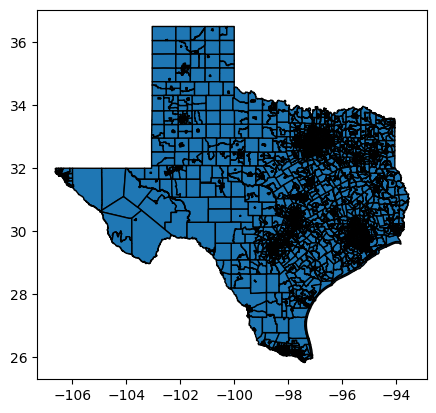

In [ ]:
import os
import geopandas as gpd

arquivos = [os.path.join("/content", f) for f in os.listdir("/content") if f.endswith(".shp")]
arquivo = max(arquivos, key=os.path.getmtime)
tl = gpd.read_file(arquivo).to_crs("EPSG:4326")
tl.plot(edgecolor="black")


In [ ]:
tl[["GEOID","geometry"]] ##TODO: Passar arquivo para HGI (CSV)

## BORO -> GEOID

,GEOID,geometry
0,48029181703,"POLYGON ((-98.66364 29.52305, -98.66362 29.523..."
1,48029181704,"POLYGON ((-98.64667 29.51503, -98.64662 29.515..."
2,48029181705,"POLYGON ((-98.62996 29.48352, -98.62941 29.483..."
3,48029181711,"POLYGON ((-98.6624 29.51902, -98.66032 29.5190..."
4,48029181712,"POLYGON ((-98.66609 29.48504, -98.66604 29.485..."
...,...,...
6891,48061012700,"POLYGON ((-97.43569 25.93883, -97.43284 25.940..."
6892,48061013203,"POLYGON ((-97.44636 25.93246, -97.44635 25.932..."
6893,48061012508,"POLYGON ((-97.61874 25.98202, -97.61838 25.982..."
6894,48061011903,"POLYGON ((-97.86217 26.06111, -97.86176 26.062..."


In [ ]:
import geopandas as gpd
from shapely import wkt

boroughs = tl[["GEOID", "geometry"]].copy()
boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)

boroughs.to_csv(f"{diretorio_principal}/boroughs_area.csv", index=False)


/tmp/ipython-input-2001046065.py:5: UserWarning: Geometry column does not contain geometry.
  boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)


In [ ]:
boroughs

,GEOID,geometry
0,48029181703,"POLYGON ((-98.663644 29.52305, -98.663619 29.5..."
1,48029181704,"POLYGON ((-98.646671 29.515029, -98.646621 29...."
2,48029181705,"POLYGON ((-98.629957 29.483524, -98.629414 29...."
3,48029181711,"POLYGON ((-98.662405 29.519019, -98.660315 29...."
4,48029181712,"POLYGON ((-98.666091 29.485038, -98.666041 29...."
...,...,...
6891,48061012700,"POLYGON ((-97.43569 25.93883, -97.432836 25.94..."
6892,48061013203,"POLYGON ((-97.446359 25.932457, -97.446354 25...."
6893,48061012508,"POLYGON ((-97.618735 25.982021, -97.618376 25...."
6894,48061011903,"POLYGON ((-97.862167 26.061112, -97.861765 26...."


In [ ]:
!rm -rf /usr/local/lib/python3.12/dist-packages/~orch*
!pip cache purge


Files removed: 6 (250 kB)


In [ ]:
%pip -q install -U pip setuptools wheel
%pip -q uninstall -y torch torchvision torchaudio torch-geometric torch-scatter torch-sparse torch-cluster torch-spline-conv pyg-lib
%pip -q install --no-cache-dir geopandas shapely libpysal h3 h3ronpy pyarrow scipy scikit-learn


In [ ]:
%pip -q install --no-cache-dir torch==2.4.0 torchvision==0.19.0 torchaudio==2.4.0 --index-url https://download.pytorch.org/whl/cpu
%pip -q install --no-cache-dir pyg-lib torch-scatter torch-sparse torch-cluster torch-spline-conv torch-geometric -f https://data.pyg.org/whl/torch-2.4.0+cpu.html


In [ ]:
%cd {diretorio_principal}

/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main


## POI Embedding

In [ ]:
FOLDER_ID_CRUS = "1cV807NNGn4gSDX-7fkJ83rlr0nRo4y89"
FOLDER_ID_SEPARATED = "1XUWhd59YDe8dSrTb6eZlLvhVcLSGpZ7n"

filename = f"checkins_{ESTADO}.csv"

path_crus = f"estados/crus/{filename}"
path_sep  = f"estados/separated/{filename}"

print("Baixando (crus)...")
download_from_folder_by_name(drive_service,FOLDER_ID_CRUS, filename, path_crus)

print("Baixando (separated)...")
download_from_folder_by_name(drive_service,FOLDER_ID_SEPARATED, filename, path_sep)

print("Concluído:", path_crus, "e", path_sep)


Baixando (crus)...
Baixando (separated)...
Concluído: estados/crus/checkins_Texas.csv e estados/separated/checkins_Texas.csv


In [ ]:
import pandas as pd, numpy as np, ast
import geopandas as gpd
from shapely.geometry import Point


CHECKIN_NAO_CRU = f"estados/crus/checkins_{ESTADO}.csv"
CHECKIN_CRU     = f"estados/separated/checkins_{ESTADO}.csv"
OUT_POIS        = "pois_gowalla.csv"

df_labeled = pd.read_csv(CHECKIN_NAO_CRU)
df_raw     = pd.read_csv(CHECKIN_CRU)

lon_col_raw = "lng" if "lng" in df_raw.columns else "longitude"
lat_col_raw = "lat" if "lat" in df_raw.columns else "latitude"
lon_col_lab = "lng" if "lng" in df_labeled.columns else ("longitude" if "longitude" in df_labeled.columns else None)
lat_col_lab = "lat" if "lat" in df_labeled.columns else ("latitude" if "latitude" in df_labeled.columns else None)

def parse_names(cell):
    try:
        lst = ast.literal_eval(cell)
        if isinstance(lst, list):
            return [d.get("name") for d in lst if isinstance(d, dict) and "name" in d]
    except Exception:
        pass
    return []

df_raw["__cat_names"] = df_raw["spot_categories"].fillna("[]").apply(parse_names)

def first_or_none(lst):
    return lst[0] if (isinstance(lst, list) and len(lst) > 0) else None

df_raw["__fclass_name"] = df_raw["__cat_names"].apply(first_or_none)

fclass_by_place = (df_raw.dropna(subset=["__fclass_name"])
                          .groupby("placeid")["__fclass_name"]
                          .agg(lambda s: s.mode().iat[0] if not s.mode().empty else s.iloc[0]))

cat_by_place = (df_labeled.dropna(subset=["category"])
                          .groupby("placeid")["category"]
                          .agg(lambda s: s.mode().iat[0] if not s.mode().empty else s.iloc[0]))

coords_raw = (
    df_raw[[lat_col_raw, lon_col_raw, "placeid"]]
    .rename(columns={lat_col_raw: "latitude", lon_col_raw: "longitude"})
    .dropna(subset=["latitude", "longitude", "placeid"])
    .copy()
)


coords_raw = coords_raw.dropna()

pois = pd.DataFrame({"feature_id": coords_raw.index})
pois["feature_id"] = pois["feature_id"].astype(int)

pois["fclass_name"]   = fclass_by_place.reindex(pois["feature_id"]).values
pois["category_name"] = cat_by_place.reindex(pois["feature_id"]).values

pois = pois.dropna(subset=["fclass_name", "category_name"]).reset_index(drop=True)

gdf = gpd.GeoDataFrame(
    pois,
    geometry=gpd.points_from_xy(coords_raw.loc[pois["feature_id"], "longitude"].values,
                                coords_raw.loc[pois["feature_id"], "latitude"].values),
    crs="EPSG:4326"
)
gdf["geometry"] = gdf.geometry.apply(lambda p: p.wkt)

fclass_vocab = {n:i for i,n in enumerate(pd.Series(gdf["fclass_name"]).dropna().unique())}
cat_vocab    = {n:i for i,n in enumerate(pd.Series(gdf["category_name"]).dropna().unique())}

gdf["fclass"]   = gdf["fclass_name"].map(lambda n: fclass_vocab.get(n, -1)).astype(int)
gdf["category"] = gdf["category_name"].map(lambda n: cat_vocab.get(n, -1)).astype(int)

gdf = gdf[(gdf["fclass"]>=0) & (gdf["category"]>=0)].reset_index(drop=True)

pois_out = gdf[["feature_id", "category", "fclass", "geometry"]].copy()
pois_out.to_csv(OUT_POIS, index=False)



/tmp/ipython-input-1134740033.py:66: UserWarning: Geometry column does not contain geometry.
  gdf["geometry"] = gdf.geometry.apply(lambda p: p.wkt)


In [ ]:
# @title
import geopandas as gpd
from shapely.geometry import box

lat_min, lat_max = df["latitude"].min(), df["latitude"].max()
lon_min, lon_max = df["longitude"].min(), df["longitude"].max()
area = box(lon_min, lat_min, lon_max, lat_max).buffer(0.01)

boroughs = gpd.GeoDataFrame(geometry=[area], crs="EPSG:4326")

boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)
boroughs.to_csv("boroughs_area.csv", index=False)


In [ ]:
import sys
module_dir = f'{diretorio_principal}/region-embedding/baselines/poi-encoder'

sys.path.insert(0, module_dir)

In [ ]:
from POIEmbedding import PreProcess

PreProcess("pois_gowalla.csv", "boroughs_area.csv", h3=False).run() ##TODO H3 FALSO


boroughs cols: ['GEOID', 'geometry']
         GEOID                                           geometry
0  48029181703  POLYGON ((-98.66364 29.52305, -98.66362 29.523...
1  48029181704  POLYGON ((-98.64667 29.51503, -98.64662 29.515...
2  48029181705  POLYGON ((-98.62996 29.48352, -98.62941 29.483...
3  48029181711  POLYGON ((-98.6624 29.51902, -98.66032 29.5190...
4  48029181712  POLYGON ((-98.66609 29.48504, -98.66604 29.485...
            GEOID                                           geometry
0     48029181703  POLYGON ((-98.66364 29.52305, -98.66362 29.523...
1     48029181704  POLYGON ((-98.64667 29.51503, -98.64662 29.515...
2     48029181705  POLYGON ((-98.62996 29.48352, -98.62941 29.483...
3     48029181711  POLYGON ((-98.6624 29.51902, -98.66032 29.5190...
4     48029181712  POLYGON ((-98.66609 29.48504, -98.66604 29.485...
...           ...                                                ...
6891  48061012700  POLYGON ((-97.43569 25.93883, -97.43284 25.940...
6892  480610132

In [ ]:
test = pd.read_csv("pois_gowalla.csv")
len(test)

95585

In [ ]:
import pandas as pd
import numpy as np
import torch
from shapely import wkt

def build_node_features_from_location_encoder(pois_csv_path: str,
                                              loc_embed_pt_path: str,
                                              placeid_col: str = "feature_id"):

    df_pois = pd.read_csv(pois_csv_path)
    if df_pois["geometry"].dtype == object:
        df_pois["geometry"] = df_pois["geometry"].apply(wkt.loads)

    blob = torch.load(loc_embed_pt_path, map_location="cpu")
    E = blob["embeddings"].detach().cpu().numpy()
    placeids = [str(p) for p in blob["placeids"]]
    placeid2idx = {pid: i for i, pid in enumerate(placeids)}

    ids = df_pois[placeid_col].astype(str).tolist()
    D = E.shape[1]
    X = np.zeros((len(ids), D), dtype=np.float32)

    for i, pid in enumerate(ids):
        idx = placeid2idx.get(pid)
        if idx is None:
            raise KeyError(f"placeid {pid} não encontrado em {loc_embed_pt_path}. "
                           f"")
        X[i] = E[idx]

    return X, df_pois


In [ ]:
# @title
from POIEmbedding import POI2Vec
p = POI2Vec()
p.train()
p.save_walks()


        source  target    weight
0            0     869  1.000000
1            0    2068  1.000000
2            0    1554  1.000000
3            0     456  1.000000
4            0    1195  1.000000
...        ...     ...       ...
286734   95531   95532  1.000000
286735   95537   95546  0.298959
286736   95539   95583  0.403122
286737   95563   95564  0.508304
286738   95573   95574  1.000000

[286739 rows x 3 columns]


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
# @title
from POIEmbedding import POI2Vec
from model import POISet, EmbeddingModel
import torch, torch.utils.data as tud

poi2vec = POI2Vec()
poi2vec.read_walks()
poi2vec.get_global_second_class_walks()

second_class_hierarchy_pairs = list(set([tuple(x) for x in poi2vec.pois[["category","fclass"]].to_numpy()]))
dataset = POISet(
    poi2vec.second_class_number,
    poi2vec.second_class_walks,
    poi2vec.global_second_class_walks,
    k=5
)
model = EmbeddingModel(
    vocab_size=poi2vec.second_class_number,
    embed_size=64,
    second_class_hierarchy_pairs=second_class_hierarchy_pairs,
    le_lambda=1e-8
)

loader = tud.DataLoader(dataset, batch_size=2048, shuffle=True)
opt = torch.optim.Adam(model.parameters(), lr=5e-2)
for e in range(5):
    for i,(inp,pos,neg) in enumerate(loader):
        opt.zero_grad()
        loss,_ = model(inp.long(), pos.long(), neg.long())
        loss.backward()
        opt.step()

torch.save({"in_embed_texas.weight": model.clone_input_embedding()}, "poi-encoder-gowalla-h3_texas.tensor")


        source  target    weight
0            0     869  1.000000
1            0    2068  1.000000
2            0    1554  1.000000
3            0     456  1.000000
4            0    1195  1.000000
...        ...     ...       ...
286734   95531   95532  1.000000
286735   95537   95546  0.298959
286736   95539   95583  0.403122
286737   95563   95564  0.508304
286738   95573   95574  1.000000

[286739 rows x 3 columns]


## HGI

In [ ]:
import sys
module_dir = f'{diretorio_principal}/region-embedding/baselines/HGI/preprocess'

sys.path.insert(0, module_dir)

In [ ]:
import torch, numpy as np, pandas as pd
from torch_geometric.data import Data
from main import Preprocess

POIS = "pois_gowalla.csv"
REGS = "boroughs_area.csv"

data_dict = Preprocess(POIS, REGS, emb_filename=None, h3=False).get_data_torch()

loc_pt_path = "/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main/poi_embeddings_location-texas.pt"
blob = torch.load(loc_pt_path, map_location="cpu")
E = blob["embeddings"].detach().cpu().numpy()
placeids = [str(p) for p in blob["placeids"]]
placeid2idx = {pid: i for i, pid in enumerate(placeids)}
D = E.shape[1]

order = pd.read_csv("poi_index.csv")
order["feature_id"] = order["feature_id"].astype(str)

X = np.zeros((len(order), D), dtype=np.float32)
for i, pid in enumerate(order["feature_id"].tolist()):
    idx = placeid2idx.get(pid)
    if idx is None:
        raise KeyError(f"placeid {pid} não encontrado em {loc_pt_path}. Gere embeddings para todos os POIs.")
    X[i] = E[idx]

import numpy as np
ei = np.asarray(data_dict['edge_index'])
assert ei.max() < X.shape[0], "edge_index referencia nó >= len(X) — ordem quebrou"

g = Data(
    x=torch.tensor(X, dtype=torch.float32),
    edge_index=torch.tensor(data_dict['edge_index'], dtype=torch.long),
    edge_weight=torch.tensor(data_dict['edge_weight'], dtype=torch.float32),
)
g.region_id  = torch.tensor(data_dict['region_id'], dtype=torch.long)
g.region_area = torch.tensor(data_dict['region_area'], dtype=torch.float32)
g.coarse_region_similarity = torch.tensor(data_dict['coarse_region_similarity'], dtype=torch.float32)
g.region_adjacency = torch.tensor(data_dict['region_adjacency'], dtype=torch.long)

torch.save(g, "gowalla.pt")


reading poi data
reading boroughs data


/usr/local/lib/python3.12/dist-packages/libpysal/weights/util.py:1618: UserWarning: The weights matrix is not fully connected: 
 There are 188 disconnected components.
 There are 111 islands with ids: 0, 1, 34, 124, 138, 263, 315, 316, 349, 350, 351, 352, 354, 403, 527, 594, 654, 657, 760, 767, 775, 781, 782, 880, 1065, 1066, 1073, 1086, 1087, 1088, 1090, 1091, 1092, 1098, 1100, 1103, 1139, 1174, 1198, 1199, 1242, 1243, 1248, 1250, 1265, 1273, 1293, 1335, 1488, 1492, 1928, 1935, 1936, 1946, 1949, 1950, 1959, 1961, 1966, 1980, 1981, 2000, 2006, 2021, 2022, 2068, 2077, 2078, 2110, 2111, 2112, 2113, 2123, 2175, 2176, 2183, 2186, 2222, 2228, 2229, 2230, 2239, 2254, 2267, 2268, 2269, 2277, 2279, 2300, 2301, 2303, 2324, 2328, 2426, 2590, 2853, 2854, 2856, 2858, 2859, 2882, 2891, 2892, 2893, 2902, 2903, 2916, 3002, 3017, 3021, 3022.
  return W(neighbors, **kwargs)


reading boroughs data
creating graph
get region ids
reading embedding
creating region adjacency


/usr/local/lib/python3.12/dist-packages/libpysal/weights/util.py:1618: UserWarning: The weights matrix is not fully connected: 
 There are 188 disconnected components.
 There are 111 islands with ids: 0, 1, 34, 124, 138, 263, 315, 316, 349, 350, 351, 352, 354, 403, 527, 594, 654, 657, 760, 767, 775, 781, 782, 880, 1065, 1066, 1073, 1086, 1087, 1088, 1090, 1091, 1092, 1098, 1100, 1103, 1139, 1174, 1198, 1199, 1242, 1243, 1248, 1250, 1265, 1273, 1293, 1335, 1488, 1492, 1928, 1935, 1936, 1946, 1949, 1950, 1959, 1961, 1966, 1980, 1981, 2000, 2006, 2021, 2022, 2068, 2077, 2078, 2110, 2111, 2112, 2113, 2123, 2175, 2176, 2183, 2186, 2222, 2228, 2229, 2230, 2239, 2254, 2267, 2268, 2269, 2277, 2279, 2300, 2301, 2303, 2324, 2328, 2426, 2590, 2853, 2854, 2856, 2858, 2859, 2882, 2891, 2892, 2893, 2902, 2903, 2916, 3002, 3017, 3021, 3022.
  return W(neighbors, **kwargs)
/tmp/ipython-input-1418749981.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default valu

creating region similarity by cosine similarity of embeddings
finishing preprocessing


In [ ]:
import os, pickle as pkl, torch
from torch_geometric.data import Data

os.makedirs("./data", exist_ok=True)

g = torch.load("./gowalla.pt", map_location="cpu")

data_dict = {
    "node_features": g.x.detach().cpu().numpy(),
    "edge_index": g.edge_index.detach().cpu().numpy(),
    "edge_weight": g.edge_weight.detach().cpu().numpy(),
    "region_id": g.region_id.detach().cpu().numpy(),
    "region_area": g.region_area.detach().cpu().numpy(),
    "coarse_region_similarity": g.coarse_region_similarity.detach().cpu().numpy(),
    "region_adjacency": g.region_adjacency.detach().cpu().numpy(),
}

with open("./data/gowalla_hgi_data.pkl", "wb") as f:
    pkl.dump(data_dict, f)



/tmp/ipython-input-1595378934.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  g = torch.load("./gowalla.pt", map_location="cpu")


In [ ]:
data_dict

{'node_features': array([[ 0.14748022,  0.08585215,  0.02432862, ...,  0.12234754,
         -0.10828642,  0.09320763],
        [ 0.13409483, -0.26579723, -0.00551214, ...,  0.09008732,
          0.04446677, -0.02204902],
        [-0.06560373, -0.08077351,  0.00439939, ..., -0.03089167,
          0.08785494, -0.05477322],
        ...,
        [ 0.30294105,  0.14464976, -0.15598631, ...,  0.07052083,
          0.01117716, -0.00553924],
        [ 0.22267397, -0.08356609, -0.07205891, ..., -0.1397383 ,
          0.05785814, -0.31618562],
        [-0.25463286, -0.02612283, -0.03590379, ...,  0.02940616,
          0.32334608, -0.22915237]], dtype=float32),
 'edge_index': array([[   0,    0,    0, ..., 3257, 3258, 3261],
        [ 656, 1515,  658, ..., 3258, 3259, 3262]]),
 'edge_weight': array([0.61425394, 0.5491791 , 0.61425394, ..., 0.31212324, 0.49566185,
        0.46597105], dtype=float32),
 'region_id': array([553, 152, 705, ..., 208, 121, 196]),
 'region_area': array([6.92356634e+00, 9

In [ ]:
import numpy as np

R_from_id = int(np.max(data_dict["region_id"])) + 1
R_area    = len(data_dict["region_area"])
R_adj     = int(data_dict["region_adjacency"].max()) + 1
R_sim     = data_dict["coarse_region_similarity"].shape[0]

print("R from id :", R_from_id)
print("R area    :", R_area)
print("R adj     :", R_adj)
print("R sim     :", R_sim)

assert R_from_id == R_area == R_adj == R_sim, "Desalinhad"


R from id : 3023
R area    : 3023
R adj     : 3021
R sim     : 3023


AssertionError: Desalinhad

In [ ]:
!python {diretorio_principal}/region-embedding/baselines/HGI/train.py --city gowalla --dim 64 --alpha 0.5 --attention_head 4 --epoch 300 --device cpu --save_name gowalla_h3


Streaming output truncated to the last 5000 lines.
Parameter containing:
tensor([[ 0.0392,  0.0866, -0.1987,  ...,  0.1719, -0.1052, -0.2430],
        [ 0.0220,  0.1119, -0.2461,  ...,  0.1118, -0.2328, -0.1864],
        [-0.1054, -0.0330, -0.3109,  ...,  0.2321, -0.3062, -0.1473],
        ...,
        [-0.0790, -0.0036, -0.1727,  ...,  0.2308, -0.2402, -0.2505],
        [-0.1425,  0.0355, -0.2345,  ...,  0.2326, -0.1041, -0.0892],
        [-0.0130,  0.1076, -0.2604,  ...,  0.0271, -0.2390, -0.0206]],
       requires_grad=True) Parameter containing:
tensor([[-0.0402, -0.0014,  0.0803,  ...,  0.0256,  0.0796, -0.1207],
        [ 0.0071, -0.0965,  0.1167,  ...,  0.0642,  0.0126,  0.0034],
        [ 0.1182,  0.0935,  0.0617,  ...,  0.0608, -0.0424,  0.0576],
        ...,
        [-0.0346, -0.1160, -0.0618,  ...,  0.0474, -0.1622, -0.0492],
        [ 0.0936,  0.0066,  0.1076,  ..., -0.0606, -0.0780, -0.0909],
        [-0.0635,  0.0990, -0.0672,  ..., -0.0074, -0.0536, -0.0429]],
       req

# California


Census: https://catalog.data.gov/dataset/tiger-line-shapefile-2021-state-texas-census-tracts

In [ ]:
ESTADO = "California"

In [ ]:
diretorio_principal = "/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main/"

In [ ]:
baixar_shapefile_estado("california")

<Axes: >

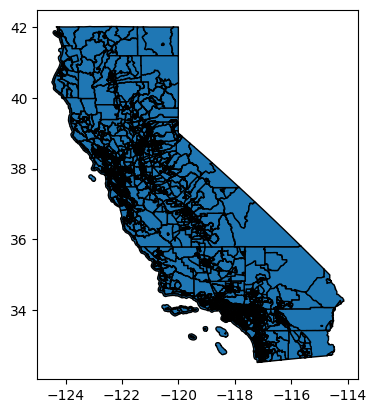

In [ ]:
import os
import geopandas as gpd

arquivos = [os.path.join("/content", f) for f in os.listdir("/content") if f.endswith(".shp")]
arquivo = max(arquivos, key=os.path.getmtime)
tl = gpd.read_file(arquivo).to_crs("EPSG:4326")
tl.plot(edgecolor="black")


In [ ]:
tl[["GEOID","geometry"]] ##TODO: Passar arquivo para HGI (CSV)

## BORO -> GEOID

,GEOID,geometry
0,06085504321,"POLYGON ((-121.87556 37.39924, -121.87535 37.3..."
1,06085504410,"POLYGON ((-121.88886 37.40758, -121.88576 37.4..."
2,06085507003,"POLYGON ((-122.02489 37.21683, -122.02458 37.2..."
3,06085507004,"POLYGON ((-121.99304 37.22562, -121.99249 37.2..."
4,06085502204,"POLYGON ((-121.93167 37.29803, -121.92801 37.3..."
...,...,...
9124,06059001303,"POLYGON ((-117.95917 33.92458, -117.95888 33.9..."
9125,06059001304,"POLYGON ((-117.95918 33.9282, -117.95831 33.92..."
9126,06059001401,"POLYGON ((-117.95056 33.94503, -117.95056 33.9..."
9127,06013367200,"POLYGON ((-122.34551 37.96355, -122.3455 37.96..."


In [ ]:
import geopandas as gpd
from shapely import wkt

boroughs = tl[["GEOID", "geometry"]].copy()
boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)

boroughs.to_csv(f"{diretorio_principal}/boroughs_area.csv", index=False)


/tmp/ipykernel_904/2001046065.py:5: UserWarning: Geometry column does not contain geometry.
  boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)


In [ ]:
boroughs

,GEOID,geometry
0,06085504321,"POLYGON ((-121.875559 37.39924, -121.875352 37..."
1,06085504410,"POLYGON ((-121.888863 37.407575, -121.885763 3..."
2,06085507003,"POLYGON ((-122.024891 37.216828, -122.024585 3..."
3,06085507004,"POLYGON ((-121.99304 37.22562, -121.99249 37.2..."
4,06085502204,"POLYGON ((-121.931674 37.29803, -121.928011 37..."
...,...,...
9124,06059001303,"POLYGON ((-117.959174 33.92458, -117.958881 33..."
9125,06059001304,"POLYGON ((-117.959178 33.928202, -117.958306 3..."
9126,06059001401,"POLYGON ((-117.950559 33.945034, -117.950555 3..."
9127,06013367200,"POLYGON ((-122.345508 37.963547, -122.3455 37...."


In [ ]:
!rm -rf /usr/local/lib/python3.12/dist-packages/~orch*
!pip cache purge


Files removed: 0


In [ ]:
%pip -q install -U pip setuptools wheel
%pip -q uninstall -y torch torchvision torchaudio torch-geometric torch-scatter torch-sparse torch-cluster torch-spline-conv pyg-lib
%pip -q install --no-cache-dir geopandas shapely libpysal h3 h3ronpy pyarrow scipy scikit-learn


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 72.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 75.4 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ipython 7.34.0 requires jedi>=0.16, which is not installed.


In [ ]:
%pip -q install --no-cache-dir torch==2.4.0 torchvision==0.19.0 torchaudio==2.4.0 --index-url https://download.pytorch.org/whl/cpu
%pip -q install --no-cache-dir pyg-lib torch-scatter torch-sparse torch-cluster torch-spline-conv torch-geometric -f https://data.pyg.org/whl/torch-2.4.0+cpu.html


In [ ]:
%cd {diretorio_principal}

/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main


## POI Embedding

In [ ]:
FOLDER_ID_CRUS = "1cV807NNGn4gSDX-7fkJ83rlr0nRo4y89"
FOLDER_ID_SEPARATED = "1XUWhd59YDe8dSrTb6eZlLvhVcLSGpZ7n"

filename = f"checkins_{ESTADO}.csv"

path_crus = f"estados/crus/{filename}"
path_sep  = f"estados/separated/{filename}"

print("Baixando (crus)...")
download_from_folder_by_name(drive_service,FOLDER_ID_CRUS, filename, path_crus)

print("Baixando (separated)...")
download_from_folder_by_name(drive_service,FOLDER_ID_SEPARATED, filename, path_sep)

print("Concluído:", path_crus, "e", path_sep)


Baixando (crus)...


Baixando (separated)...
Concluído: estados/crus/checkins_California.csv e estados/separated/checkins_California.csv


In [ ]:
import pandas as pd, numpy as np, ast
import geopandas as gpd
from shapely.geometry import Point


CHECKIN_NAO_CRU = f"estados/crus/checkins_{ESTADO}.csv"
CHECKIN_CRU     = f"estados/separated/checkins_{ESTADO}.csv"
OUT_POIS        = "pois_gowalla.csv"

df_labeled = pd.read_csv(CHECKIN_NAO_CRU)
df_raw     = pd.read_csv(CHECKIN_CRU)

lon_col_raw = "lng" if "lng" in df_raw.columns else "longitude"
lat_col_raw = "lat" if "lat" in df_raw.columns else "latitude"
lon_col_lab = "lng" if "lng" in df_labeled.columns else ("longitude" if "longitude" in df_labeled.columns else None)
lat_col_lab = "lat" if "lat" in df_labeled.columns else ("latitude" if "latitude" in df_labeled.columns else None)

def parse_names(cell):
    try:
        lst = ast.literal_eval(cell)
        if isinstance(lst, list):
            return [d.get("name") for d in lst if isinstance(d, dict) and "name" in d]
    except Exception:
        pass
    return []

df_raw["__cat_names"] = df_raw["spot_categories"].fillna("[]").apply(parse_names)

def first_or_none(lst):
    return lst[0] if (isinstance(lst, list) and len(lst) > 0) else None

df_raw["__fclass_name"] = df_raw["__cat_names"].apply(first_or_none)

fclass_by_place = (df_raw.dropna(subset=["__fclass_name"])
                          .groupby("placeid")["__fclass_name"]
                          .agg(lambda s: s.mode().iat[0] if not s.mode().empty else s.iloc[0]))

cat_by_place = (df_labeled.dropna(subset=["category"])
                          .groupby("placeid")["category"]
                          .agg(lambda s: s.mode().iat[0] if not s.mode().empty else s.iloc[0]))

coords_raw = (
    df_raw[[lat_col_raw, lon_col_raw, "placeid"]]
    .rename(columns={lat_col_raw: "latitude", lon_col_raw: "longitude"})
    .dropna(subset=["latitude", "longitude", "placeid"])
    .copy()
)


coords_raw = coords_raw.dropna()

pois = pd.DataFrame({"feature_id": coords_raw.index})
pois["feature_id"] = pois["feature_id"].astype(int)

pois["fclass_name"]   = fclass_by_place.reindex(pois["feature_id"]).values
pois["category_name"] = cat_by_place.reindex(pois["feature_id"]).values

pois = pois.dropna(subset=["fclass_name", "category_name"]).reset_index(drop=True)

gdf = gpd.GeoDataFrame(
    pois,
    geometry=gpd.points_from_xy(coords_raw.loc[pois["feature_id"], "longitude"].values,
                                coords_raw.loc[pois["feature_id"], "latitude"].values),
    crs="EPSG:4326"
)
gdf["geometry"] = gdf.geometry.apply(lambda p: p.wkt)

fclass_vocab = {n:i for i,n in enumerate(pd.Series(gdf["fclass_name"]).dropna().unique())}
cat_vocab    = {n:i for i,n in enumerate(pd.Series(gdf["category_name"]).dropna().unique())}

gdf["fclass"]   = gdf["fclass_name"].map(lambda n: fclass_vocab.get(n, -1)).astype(int)
gdf["category"] = gdf["category_name"].map(lambda n: cat_vocab.get(n, -1)).astype(int)

gdf = gdf[(gdf["fclass"]>=0) & (gdf["category"]>=0)].reset_index(drop=True)

pois_out = gdf[["feature_id", "category", "fclass", "geometry"]].copy()
pois_out.to_csv(OUT_POIS, index=False)



/tmp/ipykernel_904/1134740033.py:66: UserWarning: Geometry column does not contain geometry.
  gdf["geometry"] = gdf.geometry.apply(lambda p: p.wkt)


In [ ]:
# @title
import geopandas as gpd
from shapely.geometry import box

lat_min, lat_max = df["latitude"].min(), df["latitude"].max()
lon_min, lon_max = df["longitude"].min(), df["longitude"].max()
area = box(lon_min, lat_min, lon_max, lat_max).buffer(0.01)

boroughs = gpd.GeoDataFrame(geometry=[area], crs="EPSG:4326")

boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)
boroughs.to_csv("boroughs_area.csv", index=False)


In [ ]:
import sys
module_dir = f'{diretorio_principal}/region-embedding/baselines/poi-encoder'

sys.path.insert(0, module_dir)

In [ ]:
from POIEmbedding import PreProcess

PreProcess("pois_gowalla.csv", "boroughs_area.csv", h3=False).run() ##TODO H3 FALSO


boroughs cols: ['GEOID', 'geometry']
        GEOID                                           geometry
0  6085504321  POLYGON ((-121.87556 37.39924, -121.87535 37.3...
1  6085504410  POLYGON ((-121.88886 37.40758, -121.88576 37.4...
2  6085507003  POLYGON ((-122.02489 37.21683, -122.02458 37.2...
3  6085507004  POLYGON ((-121.99304 37.22562, -121.99249 37.2...
4  6085502204  POLYGON ((-121.93167 37.29803, -121.92801 37.3...
           GEOID                                           geometry
0     6085504321  POLYGON ((-121.87556 37.39924, -121.87535 37.3...
1     6085504410  POLYGON ((-121.88886 37.40758, -121.88576 37.4...
2     6085507003  POLYGON ((-122.02489 37.21683, -122.02458 37.2...
3     6085507004  POLYGON ((-121.99304 37.22562, -121.99249 37.2...
4     6085502204  POLYGON ((-121.93167 37.29803, -121.92801 37.3...
...          ...                                                ...
9124  6059001303  POLYGON ((-117.95917 33.92458, -117.95888 33.9...
9125  6059001304  POLYGON ((-

In [ ]:
test = pd.read_csv("pois_gowalla.csv")
len(test)

109508

In [ ]:
import pandas as pd
import numpy as np
import torch
from shapely import wkt

def build_node_features_from_location_encoder(pois_csv_path: str,
                                              loc_embed_pt_path: str,
                                              placeid_col: str = "feature_id"):

    df_pois = pd.read_csv(pois_csv_path)
    if df_pois["geometry"].dtype == object:
        df_pois["geometry"] = df_pois["geometry"].apply(wkt.loads)

    blob = torch.load(loc_embed_pt_path, map_location="cpu")
    E = blob["embeddings"].detach().cpu().numpy()
    placeids = [str(p) for p in blob["placeids"]]
    placeid2idx = {pid: i for i, pid in enumerate(placeids)}

    ids = df_pois[placeid_col].astype(str).tolist()
    D = E.shape[1]
    X = np.zeros((len(ids), D), dtype=np.float32)

    for i, pid in enumerate(ids):
        idx = placeid2idx.get(pid)
        if idx is None:
            raise KeyError(f"placeid {pid} não encontrado em {loc_embed_pt_path}. "
                           f"")
        X[i] = E[idx]

    return X, df_pois


In [ ]:
# @title
from POIEmbedding import POI2Vec
p = POI2Vec()
p.train()
p.save_walks()


        source  target    weight
0            0   41096  0.557826
1            0   55607  0.557190
2            0   52576  0.601163
3            0   77896  0.570164
4            0   39446  0.594437
...        ...     ...       ...
328492  109415  109473  0.433823
328493  109421  109474  0.447585
328494  109452  109471  0.535077
328495  109455  109487  0.461405
328496  109500  109504  0.502809

[328497 rows x 3 columns]


KeyboardInterrupt: 

In [ ]:
# @title
from POIEmbedding import POI2Vec
from model import POISet, EmbeddingModel
import torch, torch.utils.data as tud

poi2vec = POI2Vec()
poi2vec.read_walks()
poi2vec.get_global_second_class_walks()

second_class_hierarchy_pairs = list(set([tuple(x) for x in poi2vec.pois[["category","fclass"]].to_numpy()]))
dataset = POISet(
    poi2vec.second_class_number,
    poi2vec.second_class_walks,
    poi2vec.global_second_class_walks,
    k=5
)
model = EmbeddingModel(
    vocab_size=poi2vec.second_class_number,
    embed_size=64,
    second_class_hierarchy_pairs=second_class_hierarchy_pairs,
    le_lambda=1e-8
)

loader = tud.DataLoader(dataset, batch_size=2048, shuffle=True)
opt = torch.optim.Adam(model.parameters(), lr=5e-2)
for e in range(5):
    for i,(inp,pos,neg) in enumerate(loader):
        opt.zero_grad()
        loss,_ = model(inp.long(), pos.long(), neg.long())
        loss.backward()
        opt.step()

torch.save({"in_embed_california.weight": model.clone_input_embedding()}, "poi-encoder-gowalla-h3_california.tensor")


## HGI

In [ ]:
import sys
module_dir = f'{diretorio_principal}/region-embedding/baselines/HGI/preprocess'

sys.path.insert(0, module_dir)

In [ ]:
import torch, numpy as np, pandas as pd
from torch_geometric.data import Data
from main import Preprocess

POIS = "pois_gowalla.csv"
REGS = "boroughs_area.csv"

data_dict = Preprocess(POIS, REGS, emb_filename=None, h3=False).get_data_torch()

loc_pt_path = "/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main/poi_embeddings_location-california.pt"
blob = torch.load(loc_pt_path, map_location="cpu")
E = blob["embeddings"].detach().cpu().numpy()
placeids = [str(p) for p in blob["placeids"]]
placeid2idx = {pid: i for i, pid in enumerate(placeids)}
D = E.shape[1]

order = pd.read_csv("poi_index.csv")
order["feature_id"] = order["feature_id"].astype(str)

X = np.zeros((len(order), D), dtype=np.float32)
for i, pid in enumerate(order["feature_id"].tolist()):
    idx = placeid2idx.get(pid)
    if idx is None:
        raise KeyError(f"placeid {pid} não encontrado em {loc_pt_path}. Gere embeddings para todos os POIs.")
    X[i] = E[idx]

import numpy as np
ei = np.asarray(data_dict['edge_index'])
assert ei.max() < X.shape[0], "edge_index referencia nó >= len(X) — ordem quebrou"

g = Data(
    x=torch.tensor(X, dtype=torch.float32),
    edge_index=torch.tensor(data_dict['edge_index'], dtype=torch.long),
    edge_weight=torch.tensor(data_dict['edge_weight'], dtype=torch.float32),
)
g.region_id  = torch.tensor(data_dict['region_id'], dtype=torch.long)
g.region_area = torch.tensor(data_dict['region_area'], dtype=torch.float32)
g.coarse_region_similarity = torch.tensor(data_dict['coarse_region_similarity'], dtype=torch.float32)
g.region_adjacency = torch.tensor(data_dict['region_adjacency'], dtype=torch.long)

torch.save(g, "gowalla.pt")


In [ ]:
import os, pickle as pkl, torch
from torch_geometric.data import Data

os.makedirs("./data", exist_ok=True)

g = torch.load("./gowalla.pt", map_location="cpu")

data_dict = {
    "node_features": g.x.detach().cpu().numpy(),
    "edge_index": g.edge_index.detach().cpu().numpy(),
    "edge_weight": g.edge_weight.detach().cpu().numpy(),
    "region_id": g.region_id.detach().cpu().numpy(),
    "region_area": g.region_area.detach().cpu().numpy(),
    "coarse_region_similarity": g.coarse_region_similarity.detach().cpu().numpy(),
    "region_adjacency": g.region_adjacency.detach().cpu().numpy(),
}

with open("./data/gowalla_hgi_data.pkl", "wb") as f:
    pkl.dump(data_dict, f)



In [ ]:
data_dict

{'node_features': array([[ 0.14748022,  0.08585215,  0.02432862, ...,  0.12234754,
         -0.10828642,  0.09320763],
        [ 0.13409483, -0.26579723, -0.00551214, ...,  0.09008732,
          0.04446677, -0.02204902],
        [-0.06560373, -0.08077351,  0.00439939, ..., -0.03089167,
          0.08785494, -0.05477322],
        ...,
        [ 0.30294105,  0.14464976, -0.15598631, ...,  0.07052083,
          0.01117716, -0.00553924],
        [ 0.22267397, -0.08356609, -0.07205891, ..., -0.1397383 ,
          0.05785814, -0.31618562],
        [-0.25463286, -0.02612283, -0.03590379, ...,  0.02940616,
          0.32334608, -0.22915237]], dtype=float32),
 'edge_index': array([[   0,    0,    0, ..., 3257, 3258, 3261],
        [ 656, 1515,  658, ..., 3258, 3259, 3262]]),
 'edge_weight': array([0.61425394, 0.5491791 , 0.61425394, ..., 0.31212324, 0.49566185,
        0.46597105], dtype=float32),
 'region_id': array([553, 152, 705, ..., 208, 121, 196]),
 'region_area': array([6.92356634e+00, 9

In [ ]:
import numpy as np

R_from_id = int(np.max(data_dict["region_id"])) + 1
R_area    = len(data_dict["region_area"])
R_adj     = int(data_dict["region_adjacency"].max()) + 1
R_sim     = data_dict["coarse_region_similarity"].shape[0]

print("R from id :", R_from_id)
print("R area    :", R_area)
print("R adj     :", R_adj)
print("R sim     :", R_sim)

assert R_from_id == R_area == R_adj == R_sim, "Desalinhad"


In [ ]:
!python {diretorio_principal}/region-embedding/baselines/HGI/train.py --city gowalla --dim 64 --alpha 0.5 --attention_head 4 --epoch 300 --device cpu --save_name gowalla_h3


In [ ]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

# Florida


Census: https://catalog.data.gov/dataset/tiger-line-shapefile-2021-state-florida-census-tracts

In [ ]:
ESTADO = "Florida"

In [ ]:
diretorio_principal = "/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main/"

In [ ]:
baixar_shapefile_estado("florida")

In [ ]:
import os
import geopandas as gpd

arquivos = [os.path.join("/content", f) for f in os.listdir("/content") if f.endswith(".shp")]
arquivo = max(arquivos, key=os.path.getmtime)
tl = gpd.read_file(arquivo).to_crs("EPSG:4326")
tl.plot(edgecolor="black")


ValueError: max() iterable argument is empty

In [ ]:
tl[["GEOID","geometry"]] ##TODO: Passar arquivo para HGI (CSV)

## BORO -> GEOID

In [ ]:
import geopandas as gpd
from shapely import wkt

boroughs = tl[["GEOID", "geometry"]].copy()
boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)

boroughs.to_csv(f"{diretorio_principal}/boroughs_area.csv", index=False)


In [ ]:
boroughs

In [ ]:
!rm -rf /usr/local/lib/python3.12/dist-packages/~orch*
!pip cache purge


In [ ]:
%pip -q install -U pip setuptools wheel
%pip -q uninstall -y torch torchvision torchaudio torch-geometric torch-scatter torch-sparse torch-cluster torch-spline-conv pyg-lib
%pip -q install --no-cache-dir geopandas shapely libpysal h3 h3ronpy pyarrow scipy scikit-learn


In [ ]:
# @title
%pip -q install --no-cache-dir torch==2.4.0 torchvision==0.19.0 torchaudio==2.4.0 --index-url https://download.pytorch.org/whl/cpu
%pip install --no-cache-dir pyg-lib torch-scatter torch-sparse torch-cluster torch-spline-conv torch-geometric \
  -f https://data.pyg.org/whl/torch-2.4.0+cu121.html


Looking in links: https://data.pyg.org/whl/torch-2.4.0+cu121.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 11.3 MB/s  0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 98.2 MB/s  0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 54.7 MB/s  0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 77.8 MB/s  0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 989.6/989.6 kB 626.1 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 40.9 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6/6 [torch-geometric]


In [ ]:
%pip -q install --no-cache-dir torch==2.4.0 torchvision==0.19.0 torchaudio==2.4.0 --index-url https://download.pytorch.org/whl/cpu
%pip -q install --no-cache-dir pyg-lib torch-scatter torch-sparse torch-cluster torch-spline-conv torch-geometric -f https://data.pyg.org/whl/torch-2.4.0+cpu.html


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 195.0/195.0 MB 377.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 387.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 402.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 34.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 542.9/542.9 kB 398.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 50.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 792.6/792.6 kB 332.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 237.5/237.5 kB 369.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.7/63.7 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 55.9 MB/s eta 0:00:00


In [ ]:
%cd {diretorio_principal}

/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main


## POI Embedding

In [ ]:
FOLDER_ID_CRUS = "1cV807NNGn4gSDX-7fkJ83rlr0nRo4y89"
FOLDER_ID_SEPARATED = "1XUWhd59YDe8dSrTb6eZlLvhVcLSGpZ7n"

filename = f"checkins_{ESTADO}.csv"

path_crus = f"estados/crus/{filename}"
path_sep  = f"estados/separated/{filename}"

print("Baixando (crus)...")
download_from_folder_by_name(drive_service,FOLDER_ID_CRUS, filename, path_crus)

print("Baixando (separated)...")
download_from_folder_by_name(drive_service,FOLDER_ID_SEPARATED, filename, path_sep)

print("Concluído:", path_crus, "e", path_sep)


Baixando (crus)...
Baixando (separated)...
Concluído: estados/crus/checkins_Florida.csv e estados/separated/checkins_Florida.csv


In [ ]:
import pandas as pd, numpy as np, ast
import geopandas as gpd
from shapely.geometry import Point


CHECKIN_NAO_CRU = f"estados/crus/checkins_{ESTADO}.csv"
CHECKIN_CRU     = f"estados/separated/checkins_{ESTADO}.csv"
OUT_POIS        = "pois_gowalla.csv"

df_labeled = pd.read_csv(CHECKIN_NAO_CRU)
df_raw     = pd.read_csv(CHECKIN_CRU)

lon_col_raw = "lng" if "lng" in df_raw.columns else "longitude"
lat_col_raw = "lat" if "lat" in df_raw.columns else "latitude"
lon_col_lab = "lng" if "lng" in df_labeled.columns else ("longitude" if "longitude" in df_labeled.columns else None)
lat_col_lab = "lat" if "lat" in df_labeled.columns else ("latitude" if "latitude" in df_labeled.columns else None)

def parse_names(cell):
    try:
        lst = ast.literal_eval(cell)
        if isinstance(lst, list):
            return [d.get("name") for d in lst if isinstance(d, dict) and "name" in d]
    except Exception:
        pass
    return []

df_raw["__cat_names"] = df_raw["spot_categories"].fillna("[]").apply(parse_names)

def first_or_none(lst):
    return lst[0] if (isinstance(lst, list) and len(lst) > 0) else None

df_raw["__fclass_name"] = df_raw["__cat_names"].apply(first_or_none)

fclass_by_place = (df_raw.dropna(subset=["__fclass_name"])
                          .groupby("placeid")["__fclass_name"]
                          .agg(lambda s: s.mode().iat[0] if not s.mode().empty else s.iloc[0]))

cat_by_place = (df_labeled.dropna(subset=["category"])
                          .groupby("placeid")["category"]
                          .agg(lambda s: s.mode().iat[0] if not s.mode().empty else s.iloc[0]))
coords_raw = (
    df_raw[[lat_col_raw, lon_col_raw, "placeid"]]
    .rename(columns={lat_col_raw: "latitude", lon_col_raw: "longitude"})
    .dropna(subset=["latitude", "longitude", "placeid"])
    .copy()
)

coords_raw = (
    coords_raw
    .groupby("placeid", as_index=True)[["latitude", "longitude"]]
    .mean()
)

pois = pd.DataFrame({"feature_id": coords_raw.index})
pois["feature_id"] = pois["feature_id"].astype(int)

pois["fclass_name"]   = fclass_by_place.reindex(pois["feature_id"]).values
pois["category_name"] = cat_by_place.reindex(pois["feature_id"]).values

pois = pois.dropna(subset=["fclass_name", "category_name"]).reset_index(drop=True)

gdf = gpd.GeoDataFrame(
    pois,
    geometry=gpd.points_from_xy(
        coords_raw.loc[pois["feature_id"], "longitude"].values,
        coords_raw.loc[pois["feature_id"], "latitude"].values
    ),
    crs="EPSG:4326"
)
gdf["geometry"] = gdf.geometry.apply(lambda p: p.wkt)

fclass_vocab = {n:i for i,n in enumerate(pd.Series(gdf["fclass_name"]).dropna().unique())}
cat_vocab    = {n:i for i,n in enumerate(pd.Series(gdf["category_name"]).dropna().unique())}

gdf["fclass"]   = gdf["fclass_name"].map(lambda n: fclass_vocab.get(n, -1)).astype(int)
gdf["category"] = gdf["category_name"].map(lambda n: cat_vocab.get(n, -1)).astype(int)

gdf = gdf[(gdf["fclass"]>=0) & (gdf["category"]>=0)].reset_index(drop=True)

pois_out = gdf[["feature_id", "category", "fclass", "geometry"]].copy()
pois_out.to_csv(OUT_POIS, index=False)


/tmp/ipython-input-4196016147.py:70: UserWarning: Geometry column does not contain geometry.
  gdf["geometry"] = gdf.geometry.apply(lambda p: p.wkt)


In [ ]:
pois_out.shape

(65009, 4)

In [ ]:
# @title
import geopandas as gpd
from shapely.geometry import box

lat_min, lat_max = df["latitude"].min(), df["latitude"].max()
lon_min, lon_max = df["longitude"].min(), df["longitude"].max()
area = box(lon_min, lat_min, lon_max, lat_max).buffer(0.01)

boroughs = gpd.GeoDataFrame(geometry=[area], crs="EPSG:4326")

boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)
boroughs.to_csv("boroughs_area.csv", index=False)


In [ ]:
import sys
module_dir = f'{diretorio_principal}/region-embedding/baselines/poi-encoder'

sys.path.insert(0, module_dir)

In [ ]:
from POIEmbedding import PreProcess

PreProcess("pois_gowalla.csv", "boroughs_area.csv", h3=False).run() ##TODO H3 FALSO


boroughs cols: ['GEOID', 'geometry']
         GEOID                                           geometry
0  12127080600  POLYGON ((-81.07344 29.29253, -81.07342 29.292...
1  12127082406  POLYGON ((-81.01981 29.15447, -81.01972 29.154...
2  12127081300  POLYGON ((-81.01538 29.21656, -81.0151 29.2170...
3  12127081500  POLYGON ((-81.03353 29.22556, -81.03318 29.225...
4  12127081600  POLYGON ((-81.0493 29.22346, -81.04926 29.2234...
            GEOID                                           geometry
0     12127080600  POLYGON ((-81.07344 29.29253, -81.07342 29.292...
1     12127082406  POLYGON ((-81.01981 29.15447, -81.01972 29.154...
2     12127081300  POLYGON ((-81.01538 29.21656, -81.0151 29.2170...
3     12127081500  POLYGON ((-81.03353 29.22556, -81.03318 29.225...
4     12127081600  POLYGON ((-81.0493 29.22346, -81.04926 29.2234...
...           ...                                                ...
5155  12103028103  POLYGON ((-82.7461 27.74625, -82.74606 27.7463...
5156  121030281

In [ ]:
test = pd.read_csv("pois_gowalla.csv")
len(test)

In [ ]:
import pandas as pd
import numpy as np
import torch
from shapely import wkt

def build_node_features_from_location_encoder(pois_csv_path: str,
                                              loc_embed_pt_path: str,
                                              placeid_col: str = "feature_id"):

    df_pois = pd.read_csv(pois_csv_path)
    if df_pois["geometry"].dtype == object:
        df_pois["geometry"] = df_pois["geometry"].apply(wkt.loads)

    blob = torch.load(loc_embed_pt_path, map_location="cpu")
    E = blob["embeddings"].detach().cpu().numpy()
    placeids = [str(p) for p in blob["placeids"]]
    placeid2idx = {pid: i for i, pid in enumerate(placeids)}

    ids = df_pois[placeid_col].astype(str).tolist()
    D = E.shape[1]
    X = np.zeros((len(ids), D), dtype=np.float32)

    for i, pid in enumerate(ids):
        idx = placeid2idx.get(pid)
        if idx is None:
            raise KeyError(f"placeid {pid} não encontrado em {loc_embed_pt_path}. "
                           f"")
        X[i] = E[idx]

    return X, df_pois


In [ ]:
# @title
from POIEmbedding import POI2Vec
p = POI2Vec()
p.train()
p.save_walks()


        source  target    weight
0            0   38571  0.649950
1            0    2338  0.529380
2            0   44579  0.486737
3            0   25893  0.527766
4            0   49512  0.544031
...        ...     ...       ...
194988   64984   65007  0.552218
194989   64984   64985  0.763767
194990   64995   64996  0.647432
194991   65001   65002  0.491106
194992   65001   65006  0.684880

[194993 rows x 3 columns]


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
# @title
from POIEmbedding import POI2Vec
from model import POISet, EmbeddingModel
import torch, torch.utils.data as tud

poi2vec = POI2Vec()
poi2vec.read_walks()
poi2vec.get_global_second_class_walks()

second_class_hierarchy_pairs = list(set([tuple(x) for x in poi2vec.pois[["category","fclass"]].to_numpy()]))
dataset = POISet(
    poi2vec.second_class_number,
    poi2vec.second_class_walks,
    poi2vec.global_second_class_walks,
    k=5
)
model = EmbeddingModel(
    vocab_size=poi2vec.second_class_number,
    embed_size=256,
    second_class_hierarchy_pairs=second_class_hierarchy_pairs,
    le_lambda=1e-8
)

loader = tud.DataLoader(dataset, batch_size=2048, shuffle=True)
opt = torch.optim.Adam(model.parameters(), lr=5e-2)
for e in range(5):
    for i,(inp,pos,neg) in enumerate(loader):
        opt.zero_grad()
        loss,_ = model(inp.long(), pos.long(), neg.long())
        loss.backward()
        opt.step()

torch.save({f"in_embed_{ESTADO.lower()}.weight": model.clone_input_embedding()}, f"poi-encoder-gowalla-h3_{ESTADO.lower()}.tensor")


        source  target    weight
0            0   38571  0.649950
1            0    2338  0.529380
2            0   44579  0.486737
3            0   25893  0.527766
4            0   49512  0.544031
...        ...     ...       ...
194988   64984   65007  0.552218
194989   64984   64985  0.763767
194990   64995   64996  0.647432
194991   65001   65002  0.491106
194992   65001   65006  0.684880

[194993 rows x 3 columns]


## HGI

In [ ]:
import sys
module_dir = f'{diretorio_principal}/region-embedding/baselines/HGI/preprocess'

sys.path.insert(0, module_dir)

In [ ]:
import torch, numpy as np, pandas as pd
from torch_geometric.data import Data
from main import Preprocess

POIS = "pois_gowalla.csv"
REGS = "boroughs_area.csv"

data_dict = Preprocess(POIS, REGS, emb_filename=None, h3=False).get_data_torch()

loc_pt_path = f"/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main/poi_embeddings_location-{ESTADO.lower()}.pt"
blob = torch.load(loc_pt_path, map_location="cpu")
E = blob["embeddings"].detach().cpu().numpy()
placeids = [str(p) for p in blob["placeids"]]
placeid2idx = {pid: i for i, pid in enumerate(placeids)}
D = E.shape[1]

order = pd.read_csv("poi_index.csv")
order["feature_id"] = order["feature_id"].astype(str)

X = np.zeros((len(order), D), dtype=np.float32)
for i, pid in enumerate(order["feature_id"].tolist()):
    idx = placeid2idx.get(pid)
    if idx is None:
        raise KeyError(f"placeid {pid} não encontrado em {loc_pt_path}. Gere embeddings para todos os POIs.")
    X[i] = E[idx]

import numpy as np
ei = np.asarray(data_dict['edge_index'])
assert ei.max() < X.shape[0], "edge_index referencia nó >= len(X) — ordem quebrou"

g = Data(
    x=torch.tensor(X, dtype=torch.float32),
    edge_index=torch.tensor(data_dict['edge_index'], dtype=torch.long),
    edge_weight=torch.tensor(data_dict['edge_weight'], dtype=torch.float32),
)
g.region_id  = torch.tensor(data_dict['region_id'], dtype=torch.long)
g.region_area = torch.tensor(data_dict['region_area'], dtype=torch.float32)
g.coarse_region_similarity = torch.tensor(data_dict['coarse_region_similarity'], dtype=torch.float32)
g.region_adjacency = torch.tensor(data_dict['region_adjacency'], dtype=torch.long)

torch.save(g, "gowalla.pt")


ModuleNotFoundError: No module named 'torch_geometric'

In [ ]:
import os, pickle as pkl, torch
from torch_geometric.data import Data

os.makedirs("./data", exist_ok=True)

g = torch.load("./gowalla.pt", map_location="cpu")

data_dict = {
    "node_features": g.x.detach().cpu().numpy(),
    "edge_index": g.edge_index.detach().cpu().numpy(),
    "edge_weight": g.edge_weight.detach().cpu().numpy(),
    "region_id": g.region_id.detach().cpu().numpy(),
    "region_area": g.region_area.detach().cpu().numpy(),
    "coarse_region_similarity": g.coarse_region_similarity.detach().cpu().numpy(),
    "region_adjacency": g.region_adjacency.detach().cpu().numpy(),
}

with open("./data/gowalla_hgi_data.pkl", "wb") as f:
    pkl.dump(data_dict, f)



/tmp/ipython-input-1595378934.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  g = torch.load("./gowalla.pt", map_location="cpu")


In [ ]:
import numpy as np

R_from_id = int(np.max(data_dict["region_id"])) + 1
R_area    = len(data_dict["region_area"])
R_adj     = int(data_dict["region_adjacency"].max()) + 1
R_sim     = data_dict["coarse_region_similarity"].shape[0]

print("R from id :", R_from_id)
print("R area    :", R_area)
print("R adj     :", R_adj)
print("R sim     :", R_sim)

assert R_from_id == R_area == R_adj == R_sim, "Desalinhad"


R from id : 4598
R area    : 4598
R adj     : 4598
R sim     : 4598


In [ ]:
%pip uninstall -y torch torchvision torchaudio torch-geometric torch-scatter torch-sparse torch-cluster torch-spline-conv pyg-lib

%pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121
%pip install --no-cache-dir pyg-lib torch-scatter torch-sparse torch-cluster torch-spline-conv torch-geometric \
  -f https://data.pyg.org/whl/torch-2.4.0+cu121.html


Found existing installation: torch 2.4.0+cpu
Uninstalling torch-2.4.0+cpu:
  Successfully uninstalled torch-2.4.0+cpu
Found existing installation: torchvision 0.19.0+cpu
Uninstalling torchvision-0.19.0+cpu:
  Successfully uninstalled torchvision-0.19.0+cpu
Found existing installation: torchaudio 2.4.0+cpu
Uninstalling torchaudio-2.4.0+cpu:
  Successfully uninstalled torchaudio-2.4.0+cpu
Found existing installation: torch-geometric 2.7.0
Uninstalling torch-geometric-2.7.0:
  Successfully uninstalled torch-geometric-2.7.0
Found existing installation: torch_scatter 2.1.2+pt24cpu
Uninstalling torch_scatter-2.1.2+pt24cpu:
  Successfully uninstalled torch_scatter-2.1.2+pt24cpu
Found existing installation: torch_sparse 0.6.18+pt24cpu
Uninstalling torch_sparse-0.6.18+pt24cpu:
  Successfully uninstalled torch_sparse-0.6.18+pt24cpu
Found existing installation: torch_cluster 1.6.3+pt24cpu
Uninstalling torch_cluster-1.6.3+pt24cpu:
  Successfully uninstalled torch_cluster-1.6.3+pt24cpu
Found existi

Looking in links: https://data.pyg.org/whl/torch-2.4.0+cu121.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 59.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 166.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 382.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 28.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 989.6/989.6 kB 396.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.7/63.7 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 49.3 MB/s eta 0:00:00


In [ ]:
!python {diretorio_principal}/region-embedding/baselines/HGI/train.py --city gowalla --dim 64 --alpha 0.5 --attention_head 4 --epoch 500 --device cuda --save_name gowalla_h3


Start training region embeddings for the city of gowalla
  0% 0/500 [00:02<?, ?it/s]
Traceback (most recent call last):
  File "/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main//region-embedding/baselines/HGI/train.py", line 74, in <module>
    loss = train(epoch)
           ^^^^^^^^^^^^
  File "/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main//region-embedding/baselines/HGI/train.py", line 60, in train
    pos_poi_emb_list, neg_poi_emb_list, region_emb, neg_region_emb, city_emb = model(data)
                                                                               ^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/torch/nn/modules/module.py", line 1736, in _wrapped_call_impl
    return self._call_impl(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/torch/nn/modules/module.py", line 1747, in _call_impl
    return forward_call(*args, **kw

In [ ]:
!python {diretorio_principal}/region-embedding/baselines/HGI/train.py --city gowalla --dim 128 --alpha 0.5 --attention_head 4 --epoch 400 --device cuda --save_name gowalla_h3


Streaming output truncated to the last 5000 lines.
Parameter containing:
tensor([[ 0.0065,  0.1081,  0.1284,  ..., -0.0597, -0.2366, -0.1567],
        [ 0.0139,  0.1121,  0.1455,  ...,  0.0088, -0.1378, -0.0436],
        [ 0.0611,  0.0759,  0.0970,  ..., -0.0205, -0.0668,  0.0245],
        ...,
        [ 0.1538,  0.0272,  0.0940,  ...,  0.0286, -0.2149, -0.0811],
        [ 0.0997,  0.0501,  0.1074,  ...,  0.0634, -0.2330, -0.0058],
        [-0.0243,  0.0626, -0.0796,  ...,  0.0349, -0.2257, -0.1516]],
       device='cuda:0', requires_grad=True) Parameter containing:
tensor([[ 0.0252, -0.0381, -0.0998,  ..., -0.0068, -0.0448, -0.0288],
        [-0.0818, -0.0047, -0.0371,  ...,  0.0575,  0.0601,  0.0785],
        [-0.0968,  0.0290, -0.0267,  ..., -0.0720, -0.1174,  0.0546],
        ...,
        [-0.0692, -0.0451,  0.0627,  ..., -0.0793, -0.0652, -0.0105],
        [ 0.0859,  0.0128, -0.0562,  ...,  0.0659, -0.0319,  0.0839],
        [ 0.0410, -0.0545,  0.0686,  ...,  0.0848,  0.0253,  0.0

In [ ]:
!python {diretorio_principal}/region-embedding/baselines/HGI/train.py --city gowalla --dim 32 --alpha 0.5 --attention_head 4 --epoch 300 --device cuda --save_name gowalla_h3


Streaming output truncated to the last 5000 lines.
        ...,
        [ 0.1147, -0.1161, -0.1318,  ..., -0.0834,  0.0878,  0.1054],
        [-0.0209,  0.0919, -0.1614,  ...,  0.0994, -0.1318,  0.1332],
        [ 0.0297,  0.0337, -0.0801,  ..., -0.0567, -0.1054, -0.0236]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.0466,  0.1631, -0.0445,  ...,  0.2545,  0.0689, -0.0257],
        [ 0.0738, -0.0371,  0.0877,  ...,  0.0828,  0.0775, -0.0542],
        [ 0.1650,  0.3392,  0.1109,  ...,  0.0612,  0.0611, -0.2510],
        ...,
        [ 0.1954,  0.2873,  0.0999,  ...,  0.0355,  0.2675, -0.3321],
        [ 0.1230,  0.0760,  0.2339,  ...,  0.1710,  0.0562, -0.2724],
        [ 0.0636,  0.0545,  0.0352,  ...,  0.1286,  0.1076, -0.2118]],
       device='cuda:0', requires_grad=True) Parameter containing:
tensor([[-0.1557, -0.1185,  0.1481,  ...,  0.0799, -0.0474,  0.0866],
        [ 0.1327,  0.1347, -0.1948,  ..., -0.1118,  0.0896, -0.1534],
        [-0.1254,  

# North Carolina


Census: https://catalog.data.gov/dataset/tiger-line-shapefile-2021-state-north carolina-census-tracts

In [ ]:
ESTADO = "North Carolina"

In [ ]:
diretorio_principal = "/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main/"

In [ ]:
baixar_shapefile_estado("north-carolina")

<Axes: >

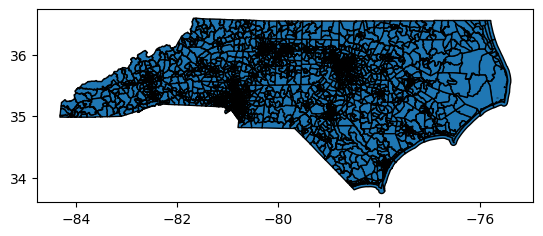

In [ ]:
import os
import geopandas as gpd

arquivos = [os.path.join("/content", f) for f in os.listdir("/content") if f.endswith(".shp")]
arquivo = max(arquivos, key=os.path.getmtime)
tl = gpd.read_file(arquivo).to_crs("EPSG:4326")
tl.plot(edgecolor="black")


In [ ]:
tl[["GEOID","geometry"]] ##TODO: Passar arquivo para HGI (CSV)

## BORO -> GEOID

,GEOID,geometry
0,37009970801,"POLYGON ((-81.43437 36.36623, -81.43436 36.366..."
1,37009970802,"POLYGON ((-81.4968 36.57366, -81.49674 36.5737..."
2,37009970502,"POLYGON ((-81.5225 36.45145, -81.52244 36.4516..."
3,37009970501,"POLYGON ((-81.48284 36.41024, -81.48265 36.410..."
4,37009970701,"POLYGON ((-81.64833 36.35459, -81.64823 36.355..."
...,...,...
2667,37063000900,"POLYGON ((-78.89438 35.99865, -78.89432 35.998..."
2668,37063001001,"POLYGON ((-78.88618 35.99051, -78.88615 35.990..."
2669,37063000600,"POLYGON ((-78.95831 35.99871, -78.95813 35.998..."
2670,37063000200,"POLYGON ((-78.90299 36.00574, -78.90253 36.006..."


In [ ]:
import geopandas as gpd
from shapely import wkt

boroughs = tl[["GEOID", "geometry"]].copy()
boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)

boroughs.to_csv(f"{diretorio_principal}/boroughs_area.csv", index=False)


/tmp/ipython-input-2001046065.py:5: UserWarning: Geometry column does not contain geometry.
  boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)


In [ ]:
boroughs

,GEOID,geometry
0,37009970801,"POLYGON ((-81.434372 36.366233, -81.434355 36...."
1,37009970802,"POLYGON ((-81.496796 36.573658, -81.496738 36...."
2,37009970502,"POLYGON ((-81.522496 36.451453, -81.522444 36...."
3,37009970501,"POLYGON ((-81.482839 36.410244, -81.482647 36...."
4,37009970701,"POLYGON ((-81.64833 36.354586, -81.648227 36.3..."
...,...,...
2667,37063000900,"POLYGON ((-78.894376 35.998652, -78.894317 35...."
2668,37063001001,"POLYGON ((-78.886179 35.990514, -78.886153 35...."
2669,37063000600,"POLYGON ((-78.958314 35.998711, -78.958127 35...."
2670,37063000200,"POLYGON ((-78.902994 36.005742, -78.902529 36...."


In [ ]:
!rm -rf /usr/local/lib/python3.12/dist-packages/~orch*
!pip cache purge


Files removed: 32


In [ ]:
%pip -q install -U pip setuptools wheel
%pip -q uninstall -y torch torchvision torchaudio torch-geometric torch-scatter torch-sparse torch-cluster torch-spline-conv pyg-lib
%pip -q install --no-cache-dir geopandas shapely libpysal h3 h3ronpy pyarrow scipy scikit-learn


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 37.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 79.2 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ipython 7.34.0 requires jedi>=0.16, which is not installed.


In [ ]:
# @title
%pip -q install --no-cache-dir torch==2.4.0 torchvision==0.19.0 torchaudio==2.4.0 --index-url https://download.pytorch.org/whl/cpu
%pip install --no-cache-dir pyg-lib torch-scatter torch-sparse torch-cluster torch-spline-conv torch-geometric \
  -f https://data.pyg.org/whl/torch-2.4.0+cu121.html


Looking in links: https://data.pyg.org/whl/torch-2.4.0+cu121.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 11.3 MB/s  0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 98.2 MB/s  0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 54.7 MB/s  0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 77.8 MB/s  0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 989.6/989.6 kB 626.1 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 40.9 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6/6 [torch-geometric]


In [ ]:
%pip -q install --no-cache-dir torch==2.4.0 torchvision==0.19.0 torchaudio==2.4.0 --index-url https://download.pytorch.org/whl/cpu
%pip -q install --no-cache-dir pyg-lib torch-scatter torch-sparse torch-cluster torch-spline-conv torch-geometric -f https://data.pyg.org/whl/torch-2.4.0+cpu.html


In [ ]:
%cd {diretorio_principal}

/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main


## POI Embedding

In [ ]:
FOLDER_ID_CRUS = "1cV807NNGn4gSDX-7fkJ83rlr0nRo4y89"
FOLDER_ID_SEPARATED = "1XUWhd59YDe8dSrTb6eZlLvhVcLSGpZ7n"

filename = f"checkins_{ESTADO}.csv"

path_crus = f"estados/crus/{filename}"
path_sep  = f"estados/separated/{filename}"

print("Baixando (crus)...")
download_from_folder_by_name(drive_service,FOLDER_ID_CRUS, filename, path_crus)

print("Baixando (separated)...")
download_from_folder_by_name(drive_service,FOLDER_ID_SEPARATED, filename, path_sep)

print("Concluído:", path_crus, "e", path_sep)


Baixando (crus)...
Baixando (separated)...
Concluído: estados/crus/checkins_North Carolina.csv e estados/separated/checkins_North Carolina.csv


In [ ]:
import pandas as pd, numpy as np, ast
import geopandas as gpd
from shapely.geometry import Point


CHECKIN_NAO_CRU = f"estados/crus/checkins_{ESTADO}.csv"
CHECKIN_CRU     = f"estados/separated/checkins_{ESTADO}.csv"
OUT_POIS        = "pois_gowalla.csv"

df_labeled = pd.read_csv(CHECKIN_NAO_CRU)
df_raw     = pd.read_csv(CHECKIN_CRU)

lon_col_raw = "lng" if "lng" in df_raw.columns else "longitude"
lat_col_raw = "lat" if "lat" in df_raw.columns else "latitude"
lon_col_lab = "lng" if "lng" in df_labeled.columns else ("longitude" if "longitude" in df_labeled.columns else None)
lat_col_lab = "lat" if "lat" in df_labeled.columns else ("latitude" if "latitude" in df_labeled.columns else None)

def parse_names(cell):
    try:
        lst = ast.literal_eval(cell)
        if isinstance(lst, list):
            return [d.get("name") for d in lst if isinstance(d, dict) and "name" in d]
    except Exception:
        pass
    return []

df_raw["__cat_names"] = df_raw["spot_categories"].fillna("[]").apply(parse_names)

def first_or_none(lst):
    return lst[0] if (isinstance(lst, list) and len(lst) > 0) else None

df_raw["__fclass_name"] = df_raw["__cat_names"].apply(first_or_none)

fclass_by_place = (df_raw.dropna(subset=["__fclass_name"])
                          .groupby("placeid")["__fclass_name"]
                          .agg(lambda s: s.mode().iat[0] if not s.mode().empty else s.iloc[0]))

cat_by_place = (df_labeled.dropna(subset=["category"])
                          .groupby("placeid")["category"]
                          .agg(lambda s: s.mode().iat[0] if not s.mode().empty else s.iloc[0]))
coords_raw = (
    df_raw[[lat_col_raw, lon_col_raw, "placeid"]]
    .rename(columns={lat_col_raw: "latitude", lon_col_raw: "longitude"})
    .dropna(subset=["latitude", "longitude", "placeid"])
    .copy()
)

coords_raw = (
    coords_raw
    .groupby("placeid", as_index=True)[["latitude", "longitude"]]
    .mean()
)

pois = pd.DataFrame({"feature_id": coords_raw.index})
pois["feature_id"] = pois["feature_id"].astype(int)

pois["fclass_name"]   = fclass_by_place.reindex(pois["feature_id"]).values
pois["category_name"] = cat_by_place.reindex(pois["feature_id"]).values

pois = pois.dropna(subset=["fclass_name", "category_name"]).reset_index(drop=True)

gdf = gpd.GeoDataFrame(
    pois,
    geometry=gpd.points_from_xy(
        coords_raw.loc[pois["feature_id"], "longitude"].values,
        coords_raw.loc[pois["feature_id"], "latitude"].values
    ),
    crs="EPSG:4326"
)
gdf["geometry"] = gdf.geometry.apply(lambda p: p.wkt)

fclass_vocab = {n:i for i,n in enumerate(pd.Series(gdf["fclass_name"]).dropna().unique())}
cat_vocab    = {n:i for i,n in enumerate(pd.Series(gdf["category_name"]).dropna().unique())}

gdf["fclass"]   = gdf["fclass_name"].map(lambda n: fclass_vocab.get(n, -1)).astype(int)
gdf["category"] = gdf["category_name"].map(lambda n: cat_vocab.get(n, -1)).astype(int)

gdf = gdf[(gdf["fclass"]>=0) & (gdf["category"]>=0)].reset_index(drop=True)

pois_out = gdf[["feature_id", "category", "fclass", "geometry"]].copy()
pois_out.to_csv(OUT_POIS, index=False)


/tmp/ipython-input-4196016147.py:70: UserWarning: Geometry column does not contain geometry.
  gdf["geometry"] = gdf.geometry.apply(lambda p: p.wkt)


In [ ]:
pois_out.shape

(65009, 4)

In [ ]:
# @title
import geopandas as gpd
from shapely.geometry import box

lat_min, lat_max = df["latitude"].min(), df["latitude"].max()
lon_min, lon_max = df["longitude"].min(), df["longitude"].max()
area = box(lon_min, lat_min, lon_max, lat_max).buffer(0.01)

boroughs = gpd.GeoDataFrame(geometry=[area], crs="EPSG:4326")

boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)
boroughs.to_csv("boroughs_area.csv", index=False)


In [ ]:
import sys
module_dir = f'{diretorio_principal}/region-embedding/baselines/poi-encoder'

sys.path.insert(0, module_dir)

In [ ]:
from POIEmbedding import PreProcess

PreProcess("pois_gowalla.csv", "boroughs_area.csv", h3=False).run() ##TODO H3 FALSO


boroughs cols: ['GEOID', 'geometry']
         GEOID                                           geometry
0  37009970801  POLYGON ((-81.43437 36.36623, -81.43436 36.366...
1  37009970802  POLYGON ((-81.4968 36.57366, -81.49674 36.5737...
2  37009970502  POLYGON ((-81.5225 36.45145, -81.52244 36.4516...
3  37009970501  POLYGON ((-81.48284 36.41024, -81.48265 36.410...
4  37009970701  POLYGON ((-81.64833 36.35459, -81.64823 36.355...
            GEOID                                           geometry
0     37009970801  POLYGON ((-81.43437 36.36623, -81.43436 36.366...
1     37009970802  POLYGON ((-81.4968 36.57366, -81.49674 36.5737...
2     37009970502  POLYGON ((-81.5225 36.45145, -81.52244 36.4516...
3     37009970501  POLYGON ((-81.48284 36.41024, -81.48265 36.410...
4     37009970701  POLYGON ((-81.64833 36.35459, -81.64823 36.355...
...           ...                                                ...
2667  37063000900  POLYGON ((-78.89438 35.99865, -78.89432 35.998...
2668  370630010

In [ ]:
test = pd.read_csv("pois_gowalla.csv")
len(test)

In [ ]:
import pandas as pd
import numpy as np
import torch
from shapely import wkt

def build_node_features_from_location_encoder(pois_csv_path: str,
                                              loc_embed_pt_path: str,
                                              placeid_col: str = "feature_id"):

    df_pois = pd.read_csv(pois_csv_path)
    if df_pois["geometry"].dtype == object:
        df_pois["geometry"] = df_pois["geometry"].apply(wkt.loads)

    blob = torch.load(loc_embed_pt_path, map_location="cpu")
    E = blob["embeddings"].detach().cpu().numpy()
    placeids = [str(p) for p in blob["placeids"]]
    placeid2idx = {pid: i for i, pid in enumerate(placeids)}

    ids = df_pois[placeid_col].astype(str).tolist()
    D = E.shape[1]
    X = np.zeros((len(ids), D), dtype=np.float32)

    for i, pid in enumerate(ids):
        idx = placeid2idx.get(pid)
        if idx is None:
            raise KeyError(f"placeid {pid} não encontrado em {loc_embed_pt_path}. "
                           f"")
        X[i] = E[idx]

    return X, df_pois


In [ ]:
# @title
from POIEmbedding import POI2Vec
p = POI2Vec()
p.train()
p.save_walks()


       source  target    weight
0           0   14294  0.690752
1           0   17830  0.663977
2           0    1330  0.657998
3           0    6370  0.769956
4           0   13550  0.612949
...       ...     ...       ...
70624   23506   23508  0.202392
70625   23506   23520  0.202656
70626   23508   23520  0.631207
70627   23528   23536  0.816453
70628   23529   23530  0.627095

[70629 rows x 3 columns]


In [ ]:
# @title
from POIEmbedding import POI2Vec
from model import POISet, EmbeddingModel
import torch, torch.utils.data as tud

poi2vec = POI2Vec()
poi2vec.read_walks()
poi2vec.get_global_second_class_walks()

second_class_hierarchy_pairs = list(set([tuple(x) for x in poi2vec.pois[["category","fclass"]].to_numpy()]))
dataset = POISet(
    poi2vec.second_class_number,
    poi2vec.second_class_walks,
    poi2vec.global_second_class_walks,
    k=5
)
model = EmbeddingModel(
    vocab_size=poi2vec.second_class_number,
    embed_size=256,
    second_class_hierarchy_pairs=second_class_hierarchy_pairs,
    le_lambda=1e-8
)

loader = tud.DataLoader(dataset, batch_size=2048, shuffle=True)
opt = torch.optim.Adam(model.parameters(), lr=5e-2)
for e in range(5):
    for i,(inp,pos,neg) in enumerate(loader):
        opt.zero_grad()
        loss,_ = model(inp.long(), pos.long(), neg.long())
        loss.backward()
        opt.step()

torch.save({f"in_embed_{ESTADO.lower()}.weight": model.clone_input_embedding()}, f"poi-encoder-gowalla-h3_{ESTADO.lower()}.tensor")


       source  target    weight
0           0   14294  0.690752
1           0   17830  0.663977
2           0    1330  0.657998
3           0    6370  0.769956
4           0   13550  0.612949
...       ...     ...       ...
70624   23506   23508  0.202392
70625   23506   23520  0.202656
70626   23508   23520  0.631207
70627   23528   23536  0.816453
70628   23529   23530  0.627095

[70629 rows x 3 columns]


## HGI

In [ ]:
import sys
module_dir = f'{diretorio_principal}/region-embedding/baselines/HGI/preprocess'

sys.path.insert(0, module_dir)

In [ ]:
import torch, numpy as np, pandas as pd
from torch_geometric.data import Data
from main import Preprocess

POIS = "pois_gowalla.csv"
REGS = "boroughs_area.csv"

data_dict = Preprocess(POIS, REGS, emb_filename=None, h3=False).get_data_torch()

loc_pt_path = f"/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main/poi_embeddings_location-{ESTADO.lower()}.pt"
blob = torch.load(loc_pt_path, map_location="cpu")
E = blob["embeddings"].detach().cpu().numpy()
placeids = [str(p) for p in blob["placeids"]]
placeid2idx = {pid: i for i, pid in enumerate(placeids)}
D = E.shape[1]

order = pd.read_csv("poi_index.csv")
order["feature_id"] = order["feature_id"].astype(str)

X = np.zeros((len(order), D), dtype=np.float32)
for i, pid in enumerate(order["feature_id"].tolist()):
    idx = placeid2idx.get(pid)
    if idx is None:
        raise KeyError(f"placeid {pid} não encontrado em {loc_pt_path}. Gere embeddings para todos os POIs.")
    X[i] = E[idx]

import numpy as np
ei = np.asarray(data_dict['edge_index'])
assert ei.max() < X.shape[0], "edge_index referencia nó >= len(X) — ordem quebrou"

g = Data(
    x=torch.tensor(X, dtype=torch.float32),
    edge_index=torch.tensor(data_dict['edge_index'], dtype=torch.long),
    edge_weight=torch.tensor(data_dict['edge_weight'], dtype=torch.float32),
)
g.region_id  = torch.tensor(data_dict['region_id'], dtype=torch.long)
g.region_area = torch.tensor(data_dict['region_area'], dtype=torch.float32)
g.coarse_region_similarity = torch.tensor(data_dict['coarse_region_similarity'], dtype=torch.float32)
g.region_adjacency = torch.tensor(data_dict['region_adjacency'], dtype=torch.long)

torch.save(g, "gowalla.pt")


reading poi data
reading boroughs data


/usr/local/lib/python3.12/dist-packages/libpysal/weights/util.py:1618: UserWarning: The weights matrix is not fully connected: 
 There are 7 disconnected components.
 There are 2 islands with ids: 317, 1095.
  return W(neighbors, **kwargs)


reading boroughs data
creating graph
       feature_id  category  fclass                    geometry  index_right  \
0            9890         0       0  POINT (-80.84195 35.22812)         1631   
1           10705         0       1  POINT (-80.62493 35.49844)         2554   
2           10972         0       2  POINT (-79.04504 35.91776)         1335   
3           10973         1       3   POINT (-79.0491 35.90847)         2136   
4           10976         1       3    POINT (-79.05129 35.912)          429   
...           ...       ...     ...                         ...          ...   
23546     7569655         5     206  POINT (-78.68843 35.78272)          211   
23547     7570598         4     106  POINT (-78.73775 35.88456)         1671   
23548     7571076         5     125  POINT (-78.40888 33.89438)         2454   
23549     7575490         1      11   POINT (-78.6689 35.65512)          305   
23550     7579887         5     123  POINT (-78.89791 35.84705)         1383   

  

/usr/local/lib/python3.12/dist-packages/libpysal/weights/util.py:1618: UserWarning: The weights matrix is not fully connected: 
 There are 7 disconnected components.
 There are 2 islands with ids: 317, 1095.
  return W(neighbors, **kwargs)
/tmp/ipython-input-224580104.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any 

creating region similarity by cosine similarity of embeddings
finishing preprocessing


In [ ]:
import os, pickle as pkl, torch
from torch_geometric.data import Data

os.makedirs("./data", exist_ok=True)

g = torch.load("./gowalla.pt", map_location="cpu")

data_dict = {
    "node_features": g.x.detach().cpu().numpy(),
    "edge_index": g.edge_index.detach().cpu().numpy(),
    "edge_weight": g.edge_weight.detach().cpu().numpy(),
    "region_id": g.region_id.detach().cpu().numpy(),
    "region_area": g.region_area.detach().cpu().numpy(),
    "coarse_region_similarity": g.coarse_region_similarity.detach().cpu().numpy(),
    "region_adjacency": g.region_adjacency.detach().cpu().numpy(),
}

with open("./data/gowalla_hgi_data.pkl", "wb") as f:
    pkl.dump(data_dict, f)



/tmp/ipython-input-1595378934.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  g = torch.load("./gowalla.pt", map_location="cpu")


In [ ]:
import numpy as np

R_from_id = int(np.max(data_dict["region_id"])) + 1
R_area    = len(data_dict["region_area"])
R_adj     = int(data_dict["region_adjacency"].max()) + 1
R_sim     = data_dict["coarse_region_similarity"].shape[0]

print("R from id :", R_from_id)
print("R area    :", R_area)
print("R adj     :", R_adj)
print("R sim     :", R_sim)

assert R_from_id == R_area == R_adj == R_sim, "Desalinhad"


R from id : 4598
R area    : 4598
R adj     : 4598
R sim     : 4598


In [ ]:
%pip uninstall -y torch torchvision torchaudio torch-geometric torch-scatter torch-sparse torch-cluster torch-spline-conv pyg-lib

%pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121
%pip install --no-cache-dir pyg-lib torch-scatter torch-sparse torch-cluster torch-spline-conv torch-geometric \
  -f https://data.pyg.org/whl/torch-2.4.0+cu121.html


Found existing installation: torch 2.4.0+cpu
Uninstalling torch-2.4.0+cpu:
  Successfully uninstalled torch-2.4.0+cpu
Found existing installation: torchvision 0.19.0+cpu
Uninstalling torchvision-0.19.0+cpu:
  Successfully uninstalled torchvision-0.19.0+cpu
Found existing installation: torchaudio 2.4.0+cpu
Uninstalling torchaudio-2.4.0+cpu:
  Successfully uninstalled torchaudio-2.4.0+cpu
Found existing installation: torch-geometric 2.7.0
Uninstalling torch-geometric-2.7.0:
  Successfully uninstalled torch-geometric-2.7.0
Found existing installation: torch_scatter 2.1.2+pt24cpu
Uninstalling torch_scatter-2.1.2+pt24cpu:
  Successfully uninstalled torch_scatter-2.1.2+pt24cpu
Found existing installation: torch_sparse 0.6.18+pt24cpu
Uninstalling torch_sparse-0.6.18+pt24cpu:
  Successfully uninstalled torch_sparse-0.6.18+pt24cpu
Found existing installation: torch_cluster 1.6.3+pt24cpu
Uninstalling torch_cluster-1.6.3+pt24cpu:
  Successfully uninstalled torch_cluster-1.6.3+pt24cpu
Found existi

In [ ]:
!python {diretorio_principal}/region-embedding/baselines/HGI/train.py --city gowalla --dim 64 --alpha 0.5 --attention_head 4 --epoch 500 --device cuda --save_name gowalla_h3


Start training region embeddings for the city of gowalla
  0% 0/500 [00:00<?, ?it/s]Parameter containing:
tensor([[ 0.0516,  0.0364,  0.0700,  ..., -0.1224,  0.0002,  0.1006],
        [-0.0227, -0.0736,  0.0979,  ...,  0.0699, -0.0847, -0.1081],
        [-0.0333, -0.1169, -0.0555,  ..., -0.0087, -0.1025, -0.0445],
        ...,
        [-0.0452,  0.0935, -0.0257,  ...,  0.0789,  0.0612,  0.1240],
        [-0.0907, -0.0407,  0.0310,  ...,  0.0199,  0.0931, -0.0985],
        [-0.1015, -0.0243, -0.0371,  ...,  0.0199, -0.1105,  0.0023]],
       device='cuda:0', requires_grad=True) Parameter containing:
tensor([[ 0.1119,  0.1133, -0.1187,  ..., -0.1022, -0.0937,  0.0504],
        [-0.1193,  0.0706,  0.0139,  ..., -0.1143,  0.0054, -0.0070],
        [ 0.0849, -0.0965, -0.0581,  ...,  0.0353, -0.0278,  0.1004],
        ...,
        [-0.0961, -0.0239, -0.1237,  ...,  0.0115, -0.0115,  0.0890],
        [-0.0715, -0.0723, -0.0475,  ...,  0.0704, -0.0369, -0.0844],
        [ 0.0305,  0.0283,  0.0

In [ ]:
!python {diretorio_principal}/region-embedding/baselines/HGI/train.py --city gowalla --dim 128 --alpha 0.5 --attention_head 4 --epoch 400 --device cuda --save_name gowalla_h3


Streaming output truncated to the last 5000 lines.
Parameter containing:
tensor([[ 0.0467, -0.2138, -0.0836,  ...,  0.0373, -0.0129, -0.0074],
        [ 0.0380, -0.2208, -0.0311,  ..., -0.0468, -0.0104, -0.1606],
        [ 0.0226, -0.1884, -0.0466,  ..., -0.0384, -0.0400, -0.1131],
        ...,
        [ 0.0266, -0.1779, -0.0836,  ...,  0.0584, -0.0499, -0.0041],
        [ 0.0814, -0.1088, -0.0541,  ...,  0.0524, -0.0351,  0.0841],
        [-0.0051, -0.1997, -0.0352,  ...,  0.0173, -0.0983, -0.1143]],
       device='cuda:0', requires_grad=True) Parameter containing:
tensor([[ 0.0639,  0.0140, -0.0819,  ..., -0.0926,  0.0004,  0.0361],
        [ 0.0277,  0.0461,  0.0201,  ...,  0.1020, -0.0155, -0.0081],
        [-0.0260, -0.0808,  0.0262,  ..., -0.0544, -0.0283, -0.0017],
        ...,
        [-0.0700, -0.0853,  0.0778,  ...,  0.0309, -0.0569, -0.0007],
        [-0.0031, -0.0207, -0.0037,  ..., -0.0603, -0.0089,  0.0536],
        [ 0.0527,  0.0704, -0.0086,  ...,  0.0270, -0.0792, -0.0

In [ ]:
!python {diretorio_principal}/region-embedding/baselines/HGI/train.py --city gowalla --dim 32 --alpha 0.5 --attention_head 4 --epoch 300 --device cuda --save_name gowalla_h3


Streaming output truncated to the last 5000 lines.
        ...,
        [ 0.1147, -0.1161, -0.1318,  ..., -0.0834,  0.0878,  0.1054],
        [-0.0209,  0.0919, -0.1614,  ...,  0.0994, -0.1318,  0.1332],
        [ 0.0297,  0.0337, -0.0801,  ..., -0.0567, -0.1054, -0.0236]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.0466,  0.1631, -0.0445,  ...,  0.2545,  0.0689, -0.0257],
        [ 0.0738, -0.0371,  0.0877,  ...,  0.0828,  0.0775, -0.0542],
        [ 0.1650,  0.3392,  0.1109,  ...,  0.0612,  0.0611, -0.2510],
        ...,
        [ 0.1954,  0.2873,  0.0999,  ...,  0.0355,  0.2675, -0.3321],
        [ 0.1230,  0.0760,  0.2339,  ...,  0.1710,  0.0562, -0.2724],
        [ 0.0636,  0.0545,  0.0352,  ...,  0.1286,  0.1076, -0.2118]],
       device='cuda:0', requires_grad=True) Parameter containing:
tensor([[-0.1557, -0.1185,  0.1481,  ...,  0.0799, -0.0474,  0.0866],
        [ 0.1327,  0.1347, -0.1948,  ..., -0.1118,  0.0896, -0.1534],
        [-0.1254,  

# Florida


Census: https://catalog.data.gov/dataset/tiger-line-shapefile-2021-state-north florida-census-tracts

In [ ]:
ESTADO = "Florida"

In [ ]:
diretorio_principal = "/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main/"

In [ ]:
baixar_shapefile_estado("florida")

<Axes: >

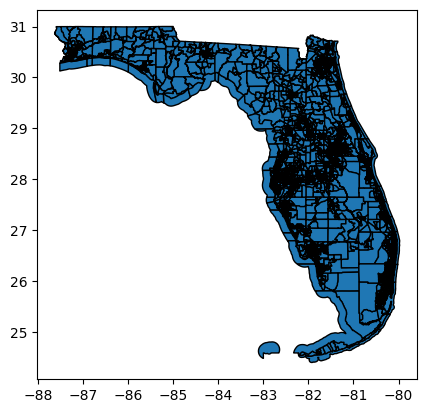

In [ ]:
import os
import geopandas as gpd

arquivos = [os.path.join("/content", f) for f in os.listdir("/content") if f.endswith(".shp")]
arquivo = max(arquivos, key=os.path.getmtime)
tl = gpd.read_file(arquivo).to_crs("EPSG:4326")
tl.plot(edgecolor="black")


In [ ]:
tl[["GEOID","geometry"]] ##TODO: Passar arquivo para HGI (CSV)

## BORO -> GEOID

,GEOID,geometry
0,12127080600,"POLYGON ((-81.07344 29.29253, -81.07342 29.292..."
1,12127082406,"POLYGON ((-81.01981 29.15447, -81.01972 29.154..."
2,12127081300,"POLYGON ((-81.01538 29.21656, -81.0151 29.2170..."
3,12127081500,"POLYGON ((-81.03353 29.22556, -81.03318 29.225..."
4,12127081600,"POLYGON ((-81.0493 29.22346, -81.04926 29.2234..."
...,...,...
5155,12103028103,"POLYGON ((-82.7461 27.74625, -82.74606 27.7463..."
5156,12103028104,"POLYGON ((-82.75336 27.75266, -82.75275 27.753..."
5157,12103024408,"POLYGON ((-82.63872 27.8428, -82.63812 27.8428..."
5158,12086000710,"POLYGON ((-80.31436 25.84797, -80.31305 25.847..."


In [ ]:
import geopandas as gpd
from shapely import wkt

boroughs = tl[["GEOID", "geometry"]].copy()
boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)

boroughs.to_csv(f"{diretorio_principal}/boroughs_area.csv", index=False)


/tmp/ipython-input-2001046065.py:5: UserWarning: Geometry column does not contain geometry.
  boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)


In [ ]:
boroughs

,GEOID,geometry
0,01079979201,"POLYGON ((-87.436107 34.727427, -87.436104 34...."
1,01079979202,"POLYGON ((-87.45696 34.613518, -87.456933 34.6..."
2,01079979502,"POLYGON ((-87.296137 34.543373, -87.296104 34...."
3,01079979501,"POLYGON ((-87.20741 34.557097, -87.2074 34.557..."
4,01009050103,"POLYGON ((-86.572293 33.820705, -86.572291 33...."
...,...,...
1432,01087232200,"POLYGON ((-86.023164 32.419268, -86.02312 32.4..."
1433,01087232000,"POLYGON ((-85.713356 32.446634, -85.713179 32...."
1434,01087231500,"POLYGON ((-85.886148 32.493053, -85.885746 32...."
1435,01087231400,"POLYGON ((-85.647973 32.444578, -85.64626 32.4..."


In [ ]:
!rm -rf /usr/local/lib/python3.12/dist-packages/~orch*
!pip cache purge


Files removed: 0


In [ ]:
%pip -q install -U pip setuptools wheel
%pip -q uninstall -y torch torchvision torchaudio torch-geometric torch-scatter torch-sparse torch-cluster torch-spline-conv pyg-lib
%pip -q install --no-cache-dir geopandas shapely libpysal h3 h3ronpy pyarrow scipy scikit-learn


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 13.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 69.5 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ipython 7.34.0 requires jedi>=0.16, which is not installed.


In [ ]:
# @title
%pip -q install --no-cache-dir torch==2.4.0 torchvision==0.19.0 torchaudio==2.4.0 --index-url https://download.pytorch.org/whl/cpu
%pip install --no-cache-dir pyg-lib torch-scatter torch-sparse torch-cluster torch-spline-conv torch-geometric \
  -f https://data.pyg.org/whl/torch-2.4.0+cu121.html


Looking in links: https://data.pyg.org/whl/torch-2.4.0+cu121.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 11.3 MB/s  0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 98.2 MB/s  0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 54.7 MB/s  0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 77.8 MB/s  0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 989.6/989.6 kB 626.1 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 40.9 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6/6 [torch-geometric]


In [ ]:
%pip -q install --no-cache-dir torch==2.4.0 torchvision==0.19.0 torchaudio==2.4.0 --index-url https://download.pytorch.org/whl/cpu
%pip -q install --no-cache-dir pyg-lib torch-scatter torch-sparse torch-cluster torch-spline-conv torch-geometric -f https://data.pyg.org/whl/torch-2.4.0+cpu.html


In [ ]:
%cd {diretorio_principal}

/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main


## POI Embedding

In [ ]:
FOLDER_ID_CRUS = "1cV807NNGn4gSDX-7fkJ83rlr0nRo4y89"
FOLDER_ID_SEPARATED = "1XUWhd59YDe8dSrTb6eZlLvhVcLSGpZ7n"

filename = f"checkins_{ESTADO}.csv"

path_crus = f"estados/crus/{filename}"
path_sep  = f"estados/separated/{filename}"

print("Baixando (crus)...")
download_from_folder_by_name(drive_service,FOLDER_ID_CRUS, filename, path_crus)

print("Baixando (separated)...")
download_from_folder_by_name(drive_service,FOLDER_ID_SEPARATED, filename, path_sep)

print("Concluído:", path_crus, "e", path_sep)


Baixando (crus)...
Baixando (separated)...
Concluído: estados/crus/checkins_Florida.csv e estados/separated/checkins_Florida.csv


In [ ]:
path_sep

'estados/separated/checkins_Alabama.csv'

In [ ]:
import pandas as pd, numpy as np, ast
import geopandas as gpd
from shapely.geometry import Point


CHECKIN_NAO_CRU = f"estados/crus/checkins_{ESTADO}.csv"
CHECKIN_CRU     = f"estados/separated/checkins_{ESTADO}.csv"
OUT_POIS        = "pois_gowalla.csv"

df_labeled = pd.read_csv(CHECKIN_NAO_CRU)
df_raw     = pd.read_csv(CHECKIN_CRU)

lon_col_raw = "lng" if "lng" in df_raw.columns else "longitude"
lat_col_raw = "lat" if "lat" in df_raw.columns else "latitude"
lon_col_lab = "lng" if "lng" in df_labeled.columns else ("longitude" if "longitude" in df_labeled.columns else None)
lat_col_lab = "lat" if "lat" in df_labeled.columns else ("latitude" if "latitude" in df_labeled.columns else None)

def parse_names(cell):
    try:
        lst = ast.literal_eval(cell)
        if isinstance(lst, list):
            return [d.get("name") for d in lst if isinstance(d, dict) and "name" in d]
    except Exception:
        pass
    return []

df_raw["__cat_names"] = df_raw["spot_categories"].fillna("[]").apply(parse_names)

def first_or_none(lst):
    return lst[0] if (isinstance(lst, list) and len(lst) > 0) else None

df_raw["__fclass_name"] = df_raw["__cat_names"].apply(first_or_none)

fclass_by_place = (df_raw.dropna(subset=["__fclass_name"])
                          .groupby("placeid")["__fclass_name"]
                          .agg(lambda s: s.mode().iat[0] if not s.mode().empty else s.iloc[0]))

cat_by_place = (df_labeled.dropna(subset=["category"])
                          .groupby("placeid")["category"]
                          .agg(lambda s: s.mode().iat[0] if not s.mode().empty else s.iloc[0]))

coords_raw = (df_raw.groupby("placeid")[[lat_col_raw, lon_col_raw]]
                    .mean()
                    .rename(columns={lat_col_raw: "latitude", lon_col_raw: "longitude"}))

if coords_raw.empty and lon_col_lab and lat_col_lab and (lon_col_lab in df_labeled.columns) and (lat_col_lab in df_labeled.columns):
    coords_raw = (df_labeled.groupby("placeid")[[lat_col_lab, lon_col_lab]]
                           .mean()
                           .rename(columns={lat_col_lab: "latitude", lon_col_lab: "longitude"}))

coords_raw = coords_raw.dropna()

pois = pd.DataFrame({"feature_id": coords_raw.index})
pois["feature_id"] = pois["feature_id"].astype(int)

pois["fclass_name"]   = fclass_by_place.reindex(pois["feature_id"]).values
pois["category_name"] = cat_by_place.reindex(pois["feature_id"]).values

pois = pois.dropna(subset=["fclass_name", "category_name"]).reset_index(drop=True)

gdf = gpd.GeoDataFrame(
    pois,
    geometry=gpd.points_from_xy(coords_raw.loc[pois["feature_id"], "longitude"].values,
                                coords_raw.loc[pois["feature_id"], "latitude"].values),
    crs="EPSG:4326"
)
gdf["geometry"] = gdf.geometry.apply(lambda p: p.wkt)

fclass_vocab = {n:i for i,n in enumerate(pd.Series(gdf["fclass_name"]).dropna().unique())}
cat_vocab    = {n:i for i,n in enumerate(pd.Series(gdf["category_name"]).dropna().unique())}

gdf["fclass"]   = gdf["fclass_name"].map(lambda n: fclass_vocab.get(n, -1)).astype(int)
gdf["category"] = gdf["category_name"].map(lambda n: cat_vocab.get(n, -1)).astype(int)

gdf = gdf[(gdf["fclass"]>=0) & (gdf["category"]>=0)].reset_index(drop=True)

pois_out = gdf[["feature_id", "category", "fclass", "geometry"]].copy()
pois_out.to_csv(OUT_POIS, index=False)



/tmp/ipython-input-2811998353.py:67: UserWarning: Geometry column does not contain geometry.
  gdf["geometry"] = gdf.geometry.apply(lambda p: p.wkt)


In [ ]:
pois_out.head()

,feature_id,category,fclass,geometry
0,9531,0,0,POINT (-86.8036222333 33.3815717667)
1,9532,1,1,POINT (-86.8052315667 33.3879232333)
2,9533,2,2,POINT (-86.7932581833 33.3868396167)
3,9593,3,3,POINT (-86.75109386440002 33.5611371083)
4,9693,4,4,POINT (-86.7792463303 33.4866859954)


In [ ]:
# @title
import geopandas as gpd
from shapely.geometry import box

lat_min, lat_max = df["latitude"].min(), df["latitude"].max()
lon_min, lon_max = df["longitude"].min(), df["longitude"].max()
area = box(lon_min, lat_min, lon_max, lat_max).buffer(0.01)

boroughs = gpd.GeoDataFrame(geometry=[area], crs="EPSG:4326")

boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)
boroughs.to_csv("boroughs_area.csv", index=False)


In [ ]:
import sys
module_dir = f'{diretorio_principal}/region-embedding/baselines/poi-encoder'

sys.path.insert(0, module_dir)

In [ ]:
from POIEmbedding import PreProcess

PreProcess("pois_gowalla.csv", "boroughs_area.csv", h3=False).run() ##TODO H3 FALSO


boroughs cols: ['GEOID', 'geometry']
         GEOID                                           geometry
0  12127080600  POLYGON ((-81.07344 29.29253, -81.07342 29.292...
1  12127082406  POLYGON ((-81.01981 29.15447, -81.01972 29.154...
2  12127081300  POLYGON ((-81.01538 29.21656, -81.0151 29.2170...
3  12127081500  POLYGON ((-81.03353 29.22556, -81.03318 29.225...
4  12127081600  POLYGON ((-81.0493 29.22346, -81.04926 29.2234...
            GEOID                                           geometry
0     12127080600  POLYGON ((-81.07344 29.29253, -81.07342 29.292...
1     12127082406  POLYGON ((-81.01981 29.15447, -81.01972 29.154...
2     12127081300  POLYGON ((-81.01538 29.21656, -81.0151 29.2170...
3     12127081500  POLYGON ((-81.03353 29.22556, -81.03318 29.225...
4     12127081600  POLYGON ((-81.0493 29.22346, -81.04926 29.2234...
...           ...                                                ...
5155  12103028103  POLYGON ((-82.7461 27.74625, -82.74606 27.7463...
5156  121030281

In [ ]:
test = pd.read_csv("pois_gowalla.csv")
len(test)

1224

In [ ]:
import pandas as pd
import numpy as np
import torch
from shapely import wkt

def build_node_features_from_location_encoder(pois_csv_path: str,
                                              loc_embed_pt_path: str,
                                              placeid_col: str = "feature_id"):

    df_pois = pd.read_csv(pois_csv_path)
    if df_pois["geometry"].dtype == object:
        df_pois["geometry"] = df_pois["geometry"].apply(wkt.loads)

    blob = torch.load(loc_embed_pt_path, map_location="cpu")
    E = blob["embeddings"].detach().cpu().numpy()
    placeids = [str(p) for p in blob["placeids"]]
    placeid2idx = {pid: i for i, pid in enumerate(placeids)}

    ids = df_pois[placeid_col].astype(str).tolist()
    D = E.shape[1]
    X = np.zeros((len(ids), D), dtype=np.float32)

    for i, pid in enumerate(ids):
        idx = placeid2idx.get(pid)
        if idx is None:
            raise KeyError(f"placeid {pid} não encontrado em {loc_embed_pt_path}. "
                           f"")
        X[i] = E[idx]

    return X, df_pois


In [ ]:
# @title
from POIEmbedding import POI2Vec
p = POI2Vec()
p.train()
p.save_walks()


        source  target    weight
0            0   38571  0.649950
1            0    2338  0.529380
2            0   44579  0.486737
3            0   25893  0.527766
4            0   49512  0.544031
...        ...     ...       ...
194988   64984   65007  0.552218
194989   64984   64985  0.763767
194990   64995   64996  0.647432
194991   65001   65002  0.491106
194992   65001   65006  0.684880

[194993 rows x 3 columns]


In [ ]:
# @title
from POIEmbedding import POI2Vec
from model import POISet, EmbeddingModel
import torch, torch.utils.data as tud

poi2vec = POI2Vec()
poi2vec.read_walks()
poi2vec.get_global_second_class_walks()

second_class_hierarchy_pairs = list(set([tuple(x) for x in poi2vec.pois[["category","fclass"]].to_numpy()]))
dataset = POISet(
    poi2vec.second_class_number,
    poi2vec.second_class_walks,
    poi2vec.global_second_class_walks,
    k=5
)
model = EmbeddingModel(
    vocab_size=poi2vec.second_class_number,
    embed_size=64,
    second_class_hierarchy_pairs=second_class_hierarchy_pairs,
    le_lambda=1e-8
)

loader = tud.DataLoader(dataset, batch_size=2048, shuffle=True)
opt = torch.optim.Adam(model.parameters(), lr=5e-2)
loss_history = []

for e in range(5):
    epoch_loss = 0
    batches = 0

    for i,(inp,pos,neg) in enumerate(loader):
        opt.zero_grad()
        loss,_ = model(inp.long(), pos.long(), neg.long())
        loss.backward()
        opt.step()

        epoch_loss += loss.item()
        batches += 1

    avg_loss = epoch_loss / batches
    loss_history.append(avg_loss)
    print(f"Época {e+1:02d} | Loss média: {avg_loss:.4f}")


torch.save({f"in_embed_{ESTADO.lower()}.weight": model.clone_input_embedding()}, f"poi-encoder-gowalla-h3_{ESTADO.lower()}.tensor")


        source  target    weight
0            0   38571  0.649950
1            0    2338  0.529380
2            0   44579  0.486737
3            0   25893  0.527766
4            0   49512  0.544031
...        ...     ...       ...
194988   64984   65007  0.552218
194989   64984   64985  0.763767
194990   64995   64996  0.647432
194991   65001   65002  0.491106
194992   65001   65006  0.684880

[194993 rows x 3 columns]
Época 01 | Loss média: 0.7303
Época 02 | Loss média: 0.0454
Época 03 | Loss média: 0.0382
Época 04 | Loss média: 0.0535
Época 05 | Loss média: 0.0546


In [ ]:
pd.read_csv("pois_gowalla.csv")

,feature_id,category,fclass,geometry
0,9531,0,0,POINT (-86.8036222333 33.3815717667)
1,9532,1,1,POINT (-86.8052315667 33.3879232333)
2,9533,2,2,POINT (-86.7932581833 33.3868396167)
3,9593,3,3,POINT (-86.75109386440002 33.5611371083)
4,9693,4,4,POINT (-86.7792463303 33.4866859954)
...,...,...,...,...
10264,7565433,6,79,POINT (-87.6704645 34.7691172)
10265,7568997,0,51,POINT (-85.0144314167 32.4956339167)
10266,7570992,3,49,POINT (-87.6857912 30.2655526)
10267,7574223,6,44,POINT (-86.8437373638 34.178465376)


## HGI

In [ ]:
import sys
module_dir = f'{diretorio_principal}/region-embedding/baselines/HGI/preprocess'

sys.path.insert(0, module_dir)

In [ ]:
import torch, numpy as np, pandas as pd
from torch_geometric.data import Data
from main import Preprocess

POIS = "pois_gowalla.csv"
REGS = "boroughs_area.csv"

data_dict = Preprocess(POIS, REGS, emb_filename=None, h3=False).get_data_torch()

loc_pt_path = f"/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main/poi_embeddings_location-{ESTADO.lower()}.pt"
blob = torch.load(loc_pt_path, map_location="cpu")
E = blob["embeddings"].detach().cpu().numpy()   # (1224, D)
placeids = [str(p) for p in blob["placeids"]]
placeid2idx = {pid: i for i, pid in enumerate(placeids)}
D = E.shape[1]

# edge_index -> número total de nós no grafo
ei = np.asarray(data_dict['edge_index'])
num_nodes_graph = ei.max() + 1
print("num_nodes_graph:", num_nodes_graph)

# poi_index.csv tem o mapeamento nó -> placeid
order = pd.read_csv("poi_index.csv")
order["feature_id"] = order["feature_id"].astype(str)

print("len(poi_index):", len(order))

# X agora tem UM embedding por nó do grafo
X = np.zeros((num_nodes_graph, D), dtype=np.float32)

# Preenche só os nós que são POIs, usando row_idx
missing = 0
for row in order.itertuples():
    node_idx = int(row.row_idx)          # índice do nó no grafo
    pid = row.feature_id                # placeid como string
    emb_idx = placeid2idx.get(str(pid))
    if emb_idx is None:
        missing += 1
        continue
    X[node_idx] = E[emb_idx]

print("Embeddings dos POIs:", E.shape)
print("Matriz X (node embeddings):", X.shape)
print("POIs sem embedding encontrado:", missing)

# sanity check
assert ei.max() < X.shape[0], "edge_index referencia nó >= len(X) — ordem quebrou"

g = Data(
    x=torch.tensor(X, dtype=torch.float32),
    edge_index=torch.tensor(data_dict['edge_index'], dtype=torch.long),
    edge_weight=torch.tensor(data_dict['edge_weight'], dtype=torch.float32),
)
g.region_id  = torch.tensor(data_dict['region_id'], dtype=torch.long)
g.region_area = torch.tensor(data_dict['region_area'], dtype=torch.float32)
g.coarse_region_similarity = torch.tensor(data_dict['coarse_region_similarity'], dtype=torch.float32)
g.region_adjacency = torch.tensor(data_dict['region_adjacency'], dtype=torch.long)

torch.save(g, "gowalla.pt")
print("✅ gowalla.pt salvo com x.shape =", g.x.shape)


reading poi data
reading boroughs data


/usr/local/lib/python3.12/dist-packages/libpysal/weights/util.py:1618: UserWarning: The weights matrix is not fully connected: 
 There are 14 disconnected components.
 There are 6 islands with ids: 31, 86, 109, 142, 178, 180.
  return W(neighbors, **kwargs)
/usr/local/lib/python3.12/dist-packages/libpysal/weights/util.py:1618: UserWarning: The weights matrix is not fully connected: 
 There are 14 disconnected components.
 There are 6 islands with ids: 31, 86, 109, 142, 178, 180.
  return W(neighbors, **kwargs)
/tmp/ipython-input-3191163683.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the 

reading boroughs data
creating graph
get region ids
reading embedding
creating region adjacency
creating region similarity by cosine similarity of embeddings
finishing preprocessing
num_nodes_graph: 6171
len(poi_index): 1224
Embeddings dos POIs: (1224, 64)
Matriz X (node embeddings): (6171, 64)
POIs sem embedding encontrado: 0
✅ gowalla.pt salvo com x.shape = torch.Size([6171, 64])


In [ ]:
import os, pickle as pkl, torch
from torch_geometric.data import Data

os.makedirs("./data", exist_ok=True)

g = torch.load("./gowalla.pt", map_location="cpu")

data_dict = {
    "node_features": g.x.detach().cpu().numpy(),
    "edge_index": g.edge_index.detach().cpu().numpy(),
    "edge_weight": g.edge_weight.detach().cpu().numpy(),
    "region_id": g.region_id.detach().cpu().numpy(),
    "region_area": g.region_area.detach().cpu().numpy(),
    "coarse_region_similarity": g.coarse_region_similarity.detach().cpu().numpy(),
    "region_adjacency": g.region_adjacency.detach().cpu().numpy(),
}

with open("./data/gowalla_hgi_data.pkl", "wb") as f:
    pkl.dump(data_dict, f)



/tmp/ipython-input-1595378934.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  g = torch.load("./gowalla.pt", map_location="cpu")


In [ ]:
import numpy as np

R_from_id = int(np.max(data_dict["region_id"])) + 1
R_area    = len(data_dict["region_area"])
R_adj     = int(data_dict["region_adjacency"].max()) + 1
R_sim     = data_dict["coarse_region_similarity"].shape[0]

print("R from id :", R_from_id)
print("R area    :", R_area)
print("R adj     :", R_adj)
print("R sim     :", R_sim)

assert R_from_id == R_area == R_adj == R_sim, "Desalinhad"


R from id : 208
R area    : 208
R adj     : 208
R sim     : 208


In [ ]:
%pip uninstall -y torch torchvision torchaudio torch-geometric torch-scatter torch-sparse torch-cluster torch-spline-conv pyg-lib

%pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121
%pip install --no-cache-dir pyg-lib torch-scatter torch-sparse torch-cluster torch-spline-conv torch-geometric \
  -f https://data.pyg.org/whl/torch-2.4.0+cu121.html


Found existing installation: torch 2.4.0+cpu
Uninstalling torch-2.4.0+cpu:
  Successfully uninstalled torch-2.4.0+cpu
Found existing installation: torchvision 0.19.0+cpu
Uninstalling torchvision-0.19.0+cpu:
  Successfully uninstalled torchvision-0.19.0+cpu
Found existing installation: torchaudio 2.4.0+cpu
Uninstalling torchaudio-2.4.0+cpu:
  Successfully uninstalled torchaudio-2.4.0+cpu
Found existing installation: torch-geometric 2.7.0
Uninstalling torch-geometric-2.7.0:
  Successfully uninstalled torch-geometric-2.7.0
Found existing installation: torch_scatter 2.1.2+pt24cpu
Uninstalling torch_scatter-2.1.2+pt24cpu:
  Successfully uninstalled torch_scatter-2.1.2+pt24cpu
Found existing installation: torch_sparse 0.6.18+pt24cpu
Uninstalling torch_sparse-0.6.18+pt24cpu:
  Successfully uninstalled torch_sparse-0.6.18+pt24cpu
Found existing installation: torch_cluster 1.6.3+pt24cpu
Uninstalling torch_cluster-1.6.3+pt24cpu:
  Successfully uninstalled torch_cluster-1.6.3+pt24cpu
Found existi

In [ ]:
!python {diretorio_principal}/region-embedding/baselines/HGI/train.py --city gowalla --dim 64 --alpha 0.5 --attention_head 4 --epoch 500 --device cuda --save_name gowalla_h3


Start training region embeddings for the city of gowalla
  0% 0/500 [00:00<?, ?it/s]Parameter containing:
tensor([[ 0.0516,  0.0364,  0.0700,  ..., -0.1224,  0.0002,  0.1006],
        [-0.0227, -0.0736,  0.0979,  ...,  0.0699, -0.0847, -0.1081],
        [-0.0333, -0.1169, -0.0555,  ..., -0.0087, -0.1025, -0.0445],
        ...,
        [-0.0452,  0.0935, -0.0257,  ...,  0.0789,  0.0612,  0.1240],
        [-0.0907, -0.0407,  0.0310,  ...,  0.0199,  0.0931, -0.0985],
        [-0.1015, -0.0243, -0.0371,  ...,  0.0199, -0.1105,  0.0023]],
       device='cuda:0', requires_grad=True) Parameter containing:
tensor([[ 0.1119,  0.1133, -0.1187,  ..., -0.1022, -0.0937,  0.0504],
        [-0.1193,  0.0706,  0.0139,  ..., -0.1143,  0.0054, -0.0070],
        [ 0.0849, -0.0965, -0.0581,  ...,  0.0353, -0.0278,  0.1004],
        ...,
        [-0.0961, -0.0239, -0.1237,  ...,  0.0115, -0.0115,  0.0890],
        [-0.0715, -0.0723, -0.0475,  ...,  0.0704, -0.0369, -0.0844],
        [ 0.0305,  0.0283,  0.0

In [ ]:
!python {diretorio_principal}/region-embedding/baselines/HGI/train.py --city gowalla --dim 128 --alpha 0.5 --attention_head 4 --epoch 400 --device cuda --save_name gowalla_h3


Streaming output truncated to the last 5000 lines.
        [ 0.0611,  0.0428,  0.0413,  ...,  0.0285,  0.0786, -0.0529]],
       device='cuda:0', requires_grad=True) Parameter containing:
tensor([[-0.0405,  0.0052, -0.0907,  ...,  0.0942,  0.0083, -0.0024],
        [ 0.0488,  0.0799, -0.0206,  ..., -0.0833,  0.0671, -0.0517],
        [-0.0132, -0.0697, -0.0729,  ..., -0.0404, -0.0194, -0.0095],
        ...,
        [-0.0968, -0.0512, -0.0105,  ...,  0.0017, -0.0062, -0.0738],
        [-0.0058, -0.0416, -0.0791,  ..., -0.0799, -0.0690,  0.0179],
        [ 0.0591,  0.0325,  0.0288,  ..., -0.0666, -0.0164,  0.0508]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.0392, -0.0180, -0.0799,  ...,  0.1080,  0.0228,  0.0286],
        [-0.0222, -0.1021, -0.1037,  ...,  0.0294, -0.0274, -0.0068],
        [ 0.0015,  0.0155, -0.0652,  ...,  0.0738,  0.0409,  0.0086],
        ...,
        [ 0.0009, -0.0611,  0.0718,  ..., -0.0739, -0.0865,  0.0421],
        [ 0.0811, -

In [ ]:
!python {diretorio_principal}/region-embedding/baselines/HGI/train.py --city gowalla --dim 32 --alpha 0.5 --attention_head 4 --epoch 300 --device cuda --save_name gowalla_h3


Streaming output truncated to the last 5000 lines.
        ...,
        [ 0.1147, -0.1161, -0.1318,  ..., -0.0834,  0.0878,  0.1054],
        [-0.0209,  0.0919, -0.1614,  ...,  0.0994, -0.1318,  0.1332],
        [ 0.0297,  0.0337, -0.0801,  ..., -0.0567, -0.1054, -0.0236]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.0466,  0.1631, -0.0445,  ...,  0.2545,  0.0689, -0.0257],
        [ 0.0738, -0.0371,  0.0877,  ...,  0.0828,  0.0775, -0.0542],
        [ 0.1650,  0.3392,  0.1109,  ...,  0.0612,  0.0611, -0.2510],
        ...,
        [ 0.1954,  0.2873,  0.0999,  ...,  0.0355,  0.2675, -0.3321],
        [ 0.1230,  0.0760,  0.2339,  ...,  0.1710,  0.0562, -0.2724],
        [ 0.0636,  0.0545,  0.0352,  ...,  0.1286,  0.1076, -0.2118]],
       device='cuda:0', requires_grad=True) Parameter containing:
tensor([[-0.1557, -0.1185,  0.1481,  ...,  0.0799, -0.0474,  0.0866],
        [ 0.1327,  0.1347, -0.1948,  ..., -0.1118,  0.0896, -0.1534],
        [-0.1254,  

# California


Census: https://catalog.data.gov/dataset/tiger-line-shapefile-2021-state-north florida-census-tracts

In [ ]:
ESTADO = "California"

In [ ]:
diretorio_principal = "/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main/"

In [ ]:
baixar_shapefile_estado("california")

<Axes: >

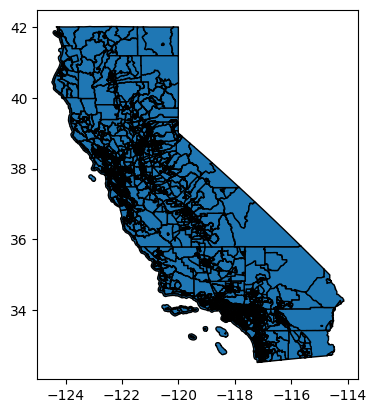

In [ ]:
import os
import geopandas as gpd

arquivos = [os.path.join("/content", f) for f in os.listdir("/content") if f.endswith(".shp")]
arquivo = max(arquivos, key=os.path.getmtime)
tl = gpd.read_file(arquivo).to_crs("EPSG:4326")
tl.plot(edgecolor="black")


In [ ]:
tl[["GEOID","geometry"]] ##TODO: Passar arquivo para HGI (CSV)

## BORO -> GEOID

,GEOID,geometry
0,06085504321,"POLYGON ((-121.87556 37.39924, -121.87535 37.3..."
1,06085504410,"POLYGON ((-121.88886 37.40758, -121.88576 37.4..."
2,06085507003,"POLYGON ((-122.02489 37.21683, -122.02458 37.2..."
3,06085507004,"POLYGON ((-121.99304 37.22562, -121.99249 37.2..."
4,06085502204,"POLYGON ((-121.93167 37.29803, -121.92801 37.3..."
...,...,...
9124,06059001303,"POLYGON ((-117.95917 33.92458, -117.95888 33.9..."
9125,06059001304,"POLYGON ((-117.95918 33.9282, -117.95831 33.92..."
9126,06059001401,"POLYGON ((-117.95056 33.94503, -117.95056 33.9..."
9127,06013367200,"POLYGON ((-122.34551 37.96355, -122.3455 37.96..."


In [ ]:
import geopandas as gpd
from shapely import wkt

boroughs = tl[["GEOID", "geometry"]].copy()
boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)

boroughs.to_csv(f"{diretorio_principal}/boroughs_area.csv", index=False)


/tmp/ipython-input-2001046065.py:5: UserWarning: Geometry column does not contain geometry.
  boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)


In [ ]:
boroughs

,GEOID,geometry
0,06085504321,"POLYGON ((-121.875559 37.39924, -121.875352 37..."
1,06085504410,"POLYGON ((-121.888863 37.407575, -121.885763 3..."
2,06085507003,"POLYGON ((-122.024891 37.216828, -122.024585 3..."
3,06085507004,"POLYGON ((-121.99304 37.22562, -121.99249 37.2..."
4,06085502204,"POLYGON ((-121.931674 37.29803, -121.928011 37..."
...,...,...
9124,06059001303,"POLYGON ((-117.959174 33.92458, -117.958881 33..."
9125,06059001304,"POLYGON ((-117.959178 33.928202, -117.958306 3..."
9126,06059001401,"POLYGON ((-117.950559 33.945034, -117.950555 3..."
9127,06013367200,"POLYGON ((-122.345508 37.963547, -122.3455 37...."


In [ ]:
!rm -rf /usr/local/lib/python3.12/dist-packages/~orch*
!pip cache purge


Files removed: 0


In [ ]:
%pip -q install -U pip setuptools wheel
%pip -q uninstall -y torch torchvision torchaudio torch-geometric torch-scatter torch-sparse torch-cluster torch-spline-conv pyg-lib
%pip -q install --no-cache-dir geopandas shapely libpysal h3 h3ronpy pyarrow scipy scikit-learn


In [ ]:
# @title
%pip -q install --no-cache-dir torch==2.4.0 torchvision==0.19.0 torchaudio==2.4.0 --index-url https://download.pytorch.org/whl/cpu
%pip install --no-cache-dir pyg-lib torch-scatter torch-sparse torch-cluster torch-spline-conv torch-geometric \
  -f https://data.pyg.org/whl/torch-2.4.0+cu121.html


Looking in links: https://data.pyg.org/whl/torch-2.4.0+cu121.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 11.3 MB/s  0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 98.2 MB/s  0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 54.7 MB/s  0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 77.8 MB/s  0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 989.6/989.6 kB 626.1 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 40.9 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6/6 [torch-geometric]


In [ ]:
%pip -q install --no-cache-dir torch==2.4.0 torchvision==0.19.0 torchaudio==2.4.0 --index-url https://download.pytorch.org/whl/cpu
%pip -q install --no-cache-dir pyg-lib torch-scatter torch-sparse torch-cluster torch-spline-conv torch-geometric -f https://data.pyg.org/whl/torch-2.4.0+cpu.html


In [ ]:
%cd {diretorio_principal}

/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main


## POI Embedding

In [ ]:
FOLDER_ID_CRUS = "1cV807NNGn4gSDX-7fkJ83rlr0nRo4y89"
FOLDER_ID_SEPARATED = "1XUWhd59YDe8dSrTb6eZlLvhVcLSGpZ7n"

filename = f"checkins_{ESTADO}.csv"

path_crus = f"estados/crus/{filename}"
path_sep  = f"estados/separated/{filename}"

print("Baixando (crus)...")
download_from_folder_by_name(drive_service,FOLDER_ID_CRUS, filename, path_crus)

print("Baixando (separated)...")
download_from_folder_by_name(drive_service,FOLDER_ID_SEPARATED, filename, path_sep)

print("Concluído:", path_crus, "e", path_sep)


Baixando (crus)...
Baixando (separated)...
Concluído: estados/crus/checkins_California.csv e estados/separated/checkins_California.csv


In [ ]:
path_sep

'estados/separated/checkins_Alabama.csv'

In [ ]:
import pandas as pd, numpy as np, ast
import geopandas as gpd
from shapely.geometry import Point


CHECKIN_NAO_CRU = f"estados/crus/checkins_{ESTADO}.csv"
CHECKIN_CRU     = f"estados/separated/checkins_{ESTADO}.csv"
OUT_POIS        = "pois_gowalla.csv"

df_labeled = pd.read_csv(CHECKIN_NAO_CRU)
df_raw     = pd.read_csv(CHECKIN_CRU)

lon_col_raw = "lng" if "lng" in df_raw.columns else "longitude"
lat_col_raw = "lat" if "lat" in df_raw.columns else "latitude"
lon_col_lab = "lng" if "lng" in df_labeled.columns else ("longitude" if "longitude" in df_labeled.columns else None)
lat_col_lab = "lat" if "lat" in df_labeled.columns else ("latitude" if "latitude" in df_labeled.columns else None)

def parse_names(cell):
    try:
        lst = ast.literal_eval(cell)
        if isinstance(lst, list):
            return [d.get("name") for d in lst if isinstance(d, dict) and "name" in d]
    except Exception:
        pass
    return []

df_raw["__cat_names"] = df_raw["spot_categories"].fillna("[]").apply(parse_names)

def first_or_none(lst):
    return lst[0] if (isinstance(lst, list) and len(lst) > 0) else None

df_raw["__fclass_name"] = df_raw["__cat_names"].apply(first_or_none)

fclass_by_place = (df_raw.dropna(subset=["__fclass_name"])
                          .groupby("placeid")["__fclass_name"]
                          .agg(lambda s: s.mode().iat[0] if not s.mode().empty else s.iloc[0]))

cat_by_place = (df_labeled.dropna(subset=["category"])
                          .groupby("placeid")["category"]
                          .agg(lambda s: s.mode().iat[0] if not s.mode().empty else s.iloc[0]))

coords_raw = (df_raw.groupby("placeid")[[lat_col_raw, lon_col_raw]]
                    .mean()
                    .rename(columns={lat_col_raw: "latitude", lon_col_raw: "longitude"}))

if coords_raw.empty and lon_col_lab and lat_col_lab and (lon_col_lab in df_labeled.columns) and (lat_col_lab in df_labeled.columns):
    coords_raw = (df_labeled.groupby("placeid")[[lat_col_lab, lon_col_lab]]
                           .mean()
                           .rename(columns={lat_col_lab: "latitude", lon_col_lab: "longitude"}))

coords_raw = coords_raw.dropna()

pois = pd.DataFrame({"feature_id": coords_raw.index})
pois["feature_id"] = pois["feature_id"].astype(int)

pois["fclass_name"]   = fclass_by_place.reindex(pois["feature_id"]).values
pois["category_name"] = cat_by_place.reindex(pois["feature_id"]).values

pois = pois.dropna(subset=["fclass_name", "category_name"]).reset_index(drop=True)

gdf = gpd.GeoDataFrame(
    pois,
    geometry=gpd.points_from_xy(coords_raw.loc[pois["feature_id"], "longitude"].values,
                                coords_raw.loc[pois["feature_id"], "latitude"].values),
    crs="EPSG:4326"
)
gdf["geometry"] = gdf.geometry.apply(lambda p: p.wkt)

fclass_vocab = {n:i for i,n in enumerate(pd.Series(gdf["fclass_name"]).dropna().unique())}
cat_vocab    = {n:i for i,n in enumerate(pd.Series(gdf["category_name"]).dropna().unique())}

gdf["fclass"]   = gdf["fclass_name"].map(lambda n: fclass_vocab.get(n, -1)).astype(int)
gdf["category"] = gdf["category_name"].map(lambda n: cat_vocab.get(n, -1)).astype(int)

gdf = gdf[(gdf["fclass"]>=0) & (gdf["category"]>=0)].reset_index(drop=True)

pois_out = gdf[["feature_id", "category", "fclass", "geometry"]].copy()
pois_out.to_csv(OUT_POIS, index=False)



/tmp/ipython-input-2811998353.py:67: UserWarning: Geometry column does not contain geometry.
  gdf["geometry"] = gdf.geometry.apply(lambda p: p.wkt)


In [ ]:
pois_out.head()

,feature_id,category,fclass,geometry
0,9531,0,0,POINT (-86.8036222333 33.3815717667)
1,9532,1,1,POINT (-86.8052315667 33.3879232333)
2,9533,2,2,POINT (-86.7932581833 33.3868396167)
3,9593,3,3,POINT (-86.75109386440002 33.5611371083)
4,9693,4,4,POINT (-86.7792463303 33.4866859954)


In [ ]:
# @title
import geopandas as gpd
from shapely.geometry import box

lat_min, lat_max = df["latitude"].min(), df["latitude"].max()
lon_min, lon_max = df["longitude"].min(), df["longitude"].max()
area = box(lon_min, lat_min, lon_max, lat_max).buffer(0.01)

boroughs = gpd.GeoDataFrame(geometry=[area], crs="EPSG:4326")

boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)
boroughs.to_csv("boroughs_area.csv", index=False)


In [ ]:
import sys
module_dir = f'{diretorio_principal}/region-embedding/baselines/poi-encoder'

sys.path.insert(0, module_dir)

In [ ]:
from POIEmbedding import PreProcess

PreProcess("pois_gowalla.csv", "boroughs_area.csv", h3=False).run() ##TODO H3 FALSO


boroughs cols: ['GEOID', 'geometry']
        GEOID                                           geometry
0  6085504321  POLYGON ((-121.87556 37.39924, -121.87535 37.3...
1  6085504410  POLYGON ((-121.88886 37.40758, -121.88576 37.4...
2  6085507003  POLYGON ((-122.02489 37.21683, -122.02458 37.2...
3  6085507004  POLYGON ((-121.99304 37.22562, -121.99249 37.2...
4  6085502204  POLYGON ((-121.93167 37.29803, -121.92801 37.3...
           GEOID                                           geometry
0     6085504321  POLYGON ((-121.87556 37.39924, -121.87535 37.3...
1     6085504410  POLYGON ((-121.88886 37.40758, -121.88576 37.4...
2     6085507003  POLYGON ((-122.02489 37.21683, -122.02458 37.2...
3     6085507004  POLYGON ((-121.99304 37.22562, -121.99249 37.2...
4     6085502204  POLYGON ((-121.93167 37.29803, -121.92801 37.3...
...          ...                                                ...
9124  6059001303  POLYGON ((-117.95917 33.92458, -117.95888 33.9...
9125  6059001304  POLYGON ((-

In [ ]:
test = pd.read_csv("pois_gowalla.csv")
len(test)

1224

In [ ]:
import pandas as pd
import numpy as np
import torch
from shapely import wkt

def build_node_features_from_location_encoder(pois_csv_path: str,
                                              loc_embed_pt_path: str,
                                              placeid_col: str = "feature_id"):

    df_pois = pd.read_csv(pois_csv_path)
    if df_pois["geometry"].dtype == object:
        df_pois["geometry"] = df_pois["geometry"].apply(wkt.loads)

    blob = torch.load(loc_embed_pt_path, map_location="cpu")
    E = blob["embeddings"].detach().cpu().numpy()
    placeids = [str(p) for p in blob["placeids"]]
    placeid2idx = {pid: i for i, pid in enumerate(placeids)}

    ids = df_pois[placeid_col].astype(str).tolist()
    D = E.shape[1]
    X = np.zeros((len(ids), D), dtype=np.float32)

    for i, pid in enumerate(ids):
        idx = placeid2idx.get(pid)
        if idx is None:
            raise KeyError(f"placeid {pid} não encontrado em {loc_embed_pt_path}. "
                           f"")
        X[i] = E[idx]

    return X, df_pois


In [ ]:
# @title
from POIEmbedding import POI2Vec
p = POI2Vec()
p.train()
p.save_walks()


        source  target    weight
0            0    5307  0.626057
1            0     164  0.651860
2            0    3344  0.585451
3            0  138918  0.612438
4            0  129987  0.620526
...        ...     ...       ...
444913  148253  148255  0.653744
444914  148308  148310  0.654397
444915  148308  148309  0.630476
444916  148309  148310  0.655578
444917  148311  148312  0.750888

[444918 rows x 3 columns]


In [ ]:
# @title
from POIEmbedding import POI2Vec
from model import POISet, EmbeddingModel
import torch, torch.utils.data as tud

poi2vec = POI2Vec()
poi2vec.read_walks()
poi2vec.get_global_second_class_walks()

second_class_hierarchy_pairs = list(set([tuple(x) for x in poi2vec.pois[["category","fclass"]].to_numpy()]))
dataset = POISet(
    poi2vec.second_class_number,
    poi2vec.second_class_walks,
    poi2vec.global_second_class_walks,
    k=5
)
model = EmbeddingModel(
    vocab_size=poi2vec.second_class_number,
    embed_size=64,
    second_class_hierarchy_pairs=second_class_hierarchy_pairs,
    le_lambda=1e-8
)

loader = tud.DataLoader(dataset, batch_size=2048, shuffle=True)
opt = torch.optim.Adam(model.parameters(), lr=5e-2)
loss_history = []

for e in range(5):
    epoch_loss = 0
    batches = 0

    for i,(inp,pos,neg) in enumerate(loader):
        opt.zero_grad()
        loss,_ = model(inp.long(), pos.long(), neg.long())
        loss.backward()
        opt.step()

        epoch_loss += loss.item()
        batches += 1

    avg_loss = epoch_loss / batches
    loss_history.append(avg_loss)
    print(f"Época {e+1:02d} | Loss média: {avg_loss:.4f}")


torch.save({f"in_embed_{ESTADO.lower()}.weight": model.clone_input_embedding()}, f"poi-encoder-gowalla-h3_{ESTADO.lower()}.tensor")


        source  target    weight
0            0    5307  0.626057
1            0     164  0.651860
2            0    3344  0.585451
3            0  138918  0.612438
4            0  129987  0.620526
...        ...     ...       ...
444913  148253  148255  0.653744
444914  148308  148310  0.654397
444915  148308  148309  0.630476
444916  148309  148310  0.655578
444917  148311  148312  0.750888

[444918 rows x 3 columns]
Época 01 | Loss média: 0.3124
Época 02 | Loss média: 0.0480
Época 03 | Loss média: 0.0592
Época 04 | Loss média: 0.0641
Época 05 | Loss média: 0.0664


In [ ]:
pd.read_csv("pois_gowalla.csv")

,feature_id,category,fclass,geometry
0,9531,0,0,POINT (-86.8036222333 33.3815717667)
1,9532,1,1,POINT (-86.8052315667 33.3879232333)
2,9533,2,2,POINT (-86.7932581833 33.3868396167)
3,9593,3,3,POINT (-86.75109386440002 33.5611371083)
4,9693,4,4,POINT (-86.7792463303 33.4866859954)
...,...,...,...,...
10264,7565433,6,79,POINT (-87.6704645 34.7691172)
10265,7568997,0,51,POINT (-85.0144314167 32.4956339167)
10266,7570992,3,49,POINT (-87.6857912 30.2655526)
10267,7574223,6,44,POINT (-86.8437373638 34.178465376)


## HGI

In [ ]:
import sys
module_dir = f'{diretorio_principal}/region-embedding/baselines/HGI/preprocess'

sys.path.insert(0, module_dir)

In [ ]:
import torch, numpy as np, pandas as pd
from torch_geometric.data import Data
from main import Preprocess

POIS = "pois_gowalla.csv"
REGS = "boroughs_area.csv"

data_dict = Preprocess(POIS, REGS, emb_filename=None, h3=False).get_data_torch()

loc_pt_path = f"/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main/poi_embeddings_location-{ESTADO.lower()}.pt"
blob = torch.load(loc_pt_path, map_location="cpu")
E = blob["embeddings"].detach().cpu().numpy()   # (1224, D)
placeids = [str(p) for p in blob["placeids"]]
placeid2idx = {pid: i for i, pid in enumerate(placeids)}
D = E.shape[1]

# edge_index -> número total de nós no grafo
ei = np.asarray(data_dict['edge_index'])
num_nodes_graph = ei.max() + 1
print("num_nodes_graph:", num_nodes_graph)

# poi_index.csv tem o mapeamento nó -> placeid
order = pd.read_csv("poi_index.csv")
order["feature_id"] = order["feature_id"].astype(str)

print("len(poi_index):", len(order))

# X agora tem UM embedding por nó do grafo
X = np.zeros((num_nodes_graph, D), dtype=np.float32)

# Preenche só os nós que são POIs, usando row_idx
missing = 0
for row in order.itertuples():
    node_idx = int(row.row_idx)          # índice do nó no grafo
    pid = row.feature_id                # placeid como string
    emb_idx = placeid2idx.get(str(pid))
    if emb_idx is None:
        missing += 1
        continue
    X[node_idx] = E[emb_idx]

print("Embeddings dos POIs:", E.shape)
print("Matriz X (node embeddings):", X.shape)
print("POIs sem embedding encontrado:", missing)

# sanity check
assert ei.max() < X.shape[0], "edge_index referencia nó >= len(X) — ordem quebrou"

g = Data(
    x=torch.tensor(X, dtype=torch.float32),
    edge_index=torch.tensor(data_dict['edge_index'], dtype=torch.long),
    edge_weight=torch.tensor(data_dict['edge_weight'], dtype=torch.float32),
)
g.region_id  = torch.tensor(data_dict['region_id'], dtype=torch.long)
g.region_area = torch.tensor(data_dict['region_area'], dtype=torch.float32)
g.coarse_region_similarity = torch.tensor(data_dict['coarse_region_similarity'], dtype=torch.float32)
g.region_adjacency = torch.tensor(data_dict['region_adjacency'], dtype=torch.long)

torch.save(g, "gowalla.pt")
print("✅ gowalla.pt salvo com x.shape =", g.x.shape)


reading poi data
reading boroughs data


/usr/local/lib/python3.12/dist-packages/libpysal/weights/util.py:1618: UserWarning: The weights matrix is not fully connected: 
 There are 14 disconnected components.
 There are 6 islands with ids: 31, 86, 109, 142, 178, 180.
  return W(neighbors, **kwargs)
/usr/local/lib/python3.12/dist-packages/libpysal/weights/util.py:1618: UserWarning: The weights matrix is not fully connected: 
 There are 14 disconnected components.
 There are 6 islands with ids: 31, 86, 109, 142, 178, 180.
  return W(neighbors, **kwargs)
/tmp/ipython-input-3191163683.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the 

reading boroughs data
creating graph
get region ids
reading embedding
creating region adjacency
creating region similarity by cosine similarity of embeddings
finishing preprocessing
num_nodes_graph: 6171
len(poi_index): 1224
Embeddings dos POIs: (1224, 64)
Matriz X (node embeddings): (6171, 64)
POIs sem embedding encontrado: 0
✅ gowalla.pt salvo com x.shape = torch.Size([6171, 64])


In [ ]:
import os, pickle as pkl, torch
from torch_geometric.data import Data

os.makedirs("./data", exist_ok=True)

g = torch.load("./gowalla.pt", map_location="cpu")

data_dict = {
    "node_features": g.x.detach().cpu().numpy(),
    "edge_index": g.edge_index.detach().cpu().numpy(),
    "edge_weight": g.edge_weight.detach().cpu().numpy(),
    "region_id": g.region_id.detach().cpu().numpy(),
    "region_area": g.region_area.detach().cpu().numpy(),
    "coarse_region_similarity": g.coarse_region_similarity.detach().cpu().numpy(),
    "region_adjacency": g.region_adjacency.detach().cpu().numpy(),
}

with open("./data/gowalla_hgi_data.pkl", "wb") as f:
    pkl.dump(data_dict, f)



/tmp/ipython-input-1595378934.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  g = torch.load("./gowalla.pt", map_location="cpu")


In [ ]:
import numpy as np

R_from_id = int(np.max(data_dict["region_id"])) + 1
R_area    = len(data_dict["region_area"])
R_adj     = int(data_dict["region_adjacency"].max()) + 1
R_sim     = data_dict["coarse_region_similarity"].shape[0]

print("R from id :", R_from_id)
print("R area    :", R_area)
print("R adj     :", R_adj)
print("R sim     :", R_sim)

assert R_from_id == R_area == R_adj == R_sim, "Desalinhad"


R from id : 208
R area    : 208
R adj     : 208
R sim     : 208


In [ ]:
%pip uninstall -y torch torchvision torchaudio torch-geometric torch-scatter torch-sparse torch-cluster torch-spline-conv pyg-lib

%pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121
%pip install --no-cache-dir pyg-lib torch-scatter torch-sparse torch-cluster torch-spline-conv torch-geometric \
  -f https://data.pyg.org/whl/torch-2.4.0+cu121.html


Found existing installation: torch 2.4.0+cpu
Uninstalling torch-2.4.0+cpu:
  Successfully uninstalled torch-2.4.0+cpu
Found existing installation: torchvision 0.19.0+cpu
Uninstalling torchvision-0.19.0+cpu:
  Successfully uninstalled torchvision-0.19.0+cpu
Found existing installation: torchaudio 2.4.0+cpu
Uninstalling torchaudio-2.4.0+cpu:
  Successfully uninstalled torchaudio-2.4.0+cpu
Found existing installation: torch-geometric 2.7.0
Uninstalling torch-geometric-2.7.0:
  Successfully uninstalled torch-geometric-2.7.0
Found existing installation: torch_scatter 2.1.2+pt24cpu
Uninstalling torch_scatter-2.1.2+pt24cpu:
  Successfully uninstalled torch_scatter-2.1.2+pt24cpu
Found existing installation: torch_sparse 0.6.18+pt24cpu
Uninstalling torch_sparse-0.6.18+pt24cpu:
  Successfully uninstalled torch_sparse-0.6.18+pt24cpu
Found existing installation: torch_cluster 1.6.3+pt24cpu
Uninstalling torch_cluster-1.6.3+pt24cpu:
  Successfully uninstalled torch_cluster-1.6.3+pt24cpu
Found existi

In [ ]:
!python {diretorio_principal}/region-embedding/baselines/HGI/train.py --city gowalla --dim 64 --alpha 0.5 --attention_head 4 --epoch 500 --device cuda --save_name gowalla_h3


Start training region embeddings for the city of gowalla
  0% 0/500 [00:00<?, ?it/s]Parameter containing:
tensor([[ 0.0516,  0.0364,  0.0700,  ..., -0.1224,  0.0002,  0.1006],
        [-0.0227, -0.0736,  0.0979,  ...,  0.0699, -0.0847, -0.1081],
        [-0.0333, -0.1169, -0.0555,  ..., -0.0087, -0.1025, -0.0445],
        ...,
        [-0.0452,  0.0935, -0.0257,  ...,  0.0789,  0.0612,  0.1240],
        [-0.0907, -0.0407,  0.0310,  ...,  0.0199,  0.0931, -0.0985],
        [-0.1015, -0.0243, -0.0371,  ...,  0.0199, -0.1105,  0.0023]],
       device='cuda:0', requires_grad=True) Parameter containing:
tensor([[ 0.1119,  0.1133, -0.1187,  ..., -0.1022, -0.0937,  0.0504],
        [-0.1193,  0.0706,  0.0139,  ..., -0.1143,  0.0054, -0.0070],
        [ 0.0849, -0.0965, -0.0581,  ...,  0.0353, -0.0278,  0.1004],
        ...,
        [-0.0961, -0.0239, -0.1237,  ...,  0.0115, -0.0115,  0.0890],
        [-0.0715, -0.0723, -0.0475,  ...,  0.0704, -0.0369, -0.0844],
        [ 0.0305,  0.0283,  0.0

In [ ]:
!python {diretorio_principal}/region-embedding/baselines/HGI/train.py --city gowalla --dim 128 --alpha 0.5 --attention_head 4 --epoch 400 --device cuda --save_name gowalla_h3


Streaming output truncated to the last 5000 lines.
        [ 0.0611,  0.0428,  0.0413,  ...,  0.0285,  0.0786, -0.0529]],
       device='cuda:0', requires_grad=True) Parameter containing:
tensor([[-0.0405,  0.0052, -0.0907,  ...,  0.0942,  0.0083, -0.0024],
        [ 0.0488,  0.0799, -0.0206,  ..., -0.0833,  0.0671, -0.0517],
        [-0.0132, -0.0697, -0.0729,  ..., -0.0404, -0.0194, -0.0095],
        ...,
        [-0.0968, -0.0512, -0.0105,  ...,  0.0017, -0.0062, -0.0738],
        [-0.0058, -0.0416, -0.0791,  ..., -0.0799, -0.0690,  0.0179],
        [ 0.0591,  0.0325,  0.0288,  ..., -0.0666, -0.0164,  0.0508]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.0392, -0.0180, -0.0799,  ...,  0.1080,  0.0228,  0.0286],
        [-0.0222, -0.1021, -0.1037,  ...,  0.0294, -0.0274, -0.0068],
        [ 0.0015,  0.0155, -0.0652,  ...,  0.0738,  0.0409,  0.0086],
        ...,
        [ 0.0009, -0.0611,  0.0718,  ..., -0.0739, -0.0865,  0.0421],
        [ 0.0811, -

In [ ]:
!python {diretorio_principal}/region-embedding/baselines/HGI/train.py --city gowalla --dim 32 --alpha 0.5 --attention_head 4 --epoch 300 --device cuda --save_name gowalla_h3


Streaming output truncated to the last 5000 lines.
        ...,
        [ 0.1147, -0.1161, -0.1318,  ..., -0.0834,  0.0878,  0.1054],
        [-0.0209,  0.0919, -0.1614,  ...,  0.0994, -0.1318,  0.1332],
        [ 0.0297,  0.0337, -0.0801,  ..., -0.0567, -0.1054, -0.0236]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.0466,  0.1631, -0.0445,  ...,  0.2545,  0.0689, -0.0257],
        [ 0.0738, -0.0371,  0.0877,  ...,  0.0828,  0.0775, -0.0542],
        [ 0.1650,  0.3392,  0.1109,  ...,  0.0612,  0.0611, -0.2510],
        ...,
        [ 0.1954,  0.2873,  0.0999,  ...,  0.0355,  0.2675, -0.3321],
        [ 0.1230,  0.0760,  0.2339,  ...,  0.1710,  0.0562, -0.2724],
        [ 0.0636,  0.0545,  0.0352,  ...,  0.1286,  0.1076, -0.2118]],
       device='cuda:0', requires_grad=True) Parameter containing:
tensor([[-0.1557, -0.1185,  0.1481,  ...,  0.0799, -0.0474,  0.0866],
        [ 0.1327,  0.1347, -0.1948,  ..., -0.1118,  0.0896, -0.1534],
        [-0.1254,  

# Texas


Census: https://catalog.data.gov/dataset/tiger-line-shapefile-2021-state-north florida-census-tracts

In [ ]:
ESTADO = "Texas"

In [ ]:
diretorio_principal = "/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main/"

In [ ]:
baixar_shapefile_estado("texas")

<Axes: >

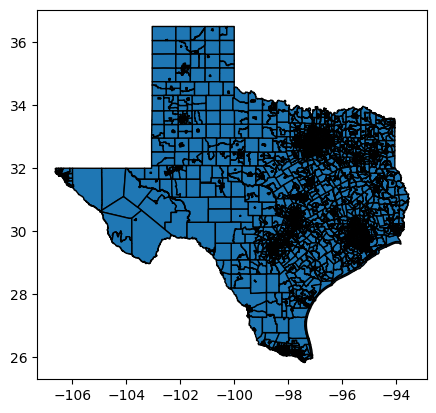

In [ ]:
import os
import geopandas as gpd

arquivos = [os.path.join("/content", f) for f in os.listdir("/content") if f.endswith(".shp")]
arquivo = max(arquivos, key=os.path.getmtime)
tl = gpd.read_file(arquivo).to_crs("EPSG:4326")
tl.plot(edgecolor="black")


In [ ]:
tl[["GEOID","geometry"]] ##TODO: Passar arquivo para HGI (CSV)

## BORO -> GEOID

,GEOID,geometry
0,48029181703,"POLYGON ((-98.66364 29.52305, -98.66362 29.523..."
1,48029181704,"POLYGON ((-98.64667 29.51503, -98.64662 29.515..."
2,48029181705,"POLYGON ((-98.62996 29.48352, -98.62941 29.483..."
3,48029181711,"POLYGON ((-98.6624 29.51902, -98.66032 29.5190..."
4,48029181712,"POLYGON ((-98.66609 29.48504, -98.66604 29.485..."
...,...,...
6891,48061012700,"POLYGON ((-97.43569 25.93883, -97.43284 25.940..."
6892,48061013203,"POLYGON ((-97.44636 25.93246, -97.44635 25.932..."
6893,48061012508,"POLYGON ((-97.61874 25.98202, -97.61838 25.982..."
6894,48061011903,"POLYGON ((-97.86217 26.06111, -97.86176 26.062..."


In [ ]:
import geopandas as gpd
from shapely import wkt

boroughs = tl[["GEOID", "geometry"]].copy()
boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)

boroughs.to_csv(f"{diretorio_principal}/boroughs_area.csv", index=False)


/tmp/ipython-input-2001046065.py:5: UserWarning: Geometry column does not contain geometry.
  boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)


In [ ]:
boroughs

,GEOID,geometry
0,06085504321,"POLYGON ((-121.875559 37.39924, -121.875352 37..."
1,06085504410,"POLYGON ((-121.888863 37.407575, -121.885763 3..."
2,06085507003,"POLYGON ((-122.024891 37.216828, -122.024585 3..."
3,06085507004,"POLYGON ((-121.99304 37.22562, -121.99249 37.2..."
4,06085502204,"POLYGON ((-121.931674 37.29803, -121.928011 37..."
...,...,...
9124,06059001303,"POLYGON ((-117.959174 33.92458, -117.958881 33..."
9125,06059001304,"POLYGON ((-117.959178 33.928202, -117.958306 3..."
9126,06059001401,"POLYGON ((-117.950559 33.945034, -117.950555 3..."
9127,06013367200,"POLYGON ((-122.345508 37.963547, -122.3455 37...."


In [ ]:
!rm -rf /usr/local/lib/python3.12/dist-packages/~orch*
!pip cache purge


Files removed: 0


In [ ]:
%pip -q install -U pip setuptools wheel
%pip -q uninstall -y torch torchvision torchaudio torch-geometric torch-scatter torch-sparse torch-cluster torch-spline-conv pyg-lib
%pip -q install --no-cache-dir geopandas shapely libpysal h3 h3ronpy pyarrow scipy scikit-learn


In [ ]:
# @title
%pip -q install --no-cache-dir torch==2.4.0 torchvision==0.19.0 torchaudio==2.4.0 --index-url https://download.pytorch.org/whl/cpu
%pip install --no-cache-dir pyg-lib torch-scatter torch-sparse torch-cluster torch-spline-conv torch-geometric \
  -f https://data.pyg.org/whl/torch-2.4.0+cu121.html


Looking in links: https://data.pyg.org/whl/torch-2.4.0+cu121.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 11.3 MB/s  0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 98.2 MB/s  0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 54.7 MB/s  0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 77.8 MB/s  0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 989.6/989.6 kB 626.1 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 40.9 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6/6 [torch-geometric]


In [ ]:
%pip -q install --no-cache-dir torch==2.4.0 torchvision==0.19.0 torchaudio==2.4.0 --index-url https://download.pytorch.org/whl/cpu
%pip -q install --no-cache-dir pyg-lib torch-scatter torch-sparse torch-cluster torch-spline-conv torch-geometric -f https://data.pyg.org/whl/torch-2.4.0+cpu.html


In [ ]:
%cd {diretorio_principal}

/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main


## POI Embedding

In [ ]:
FOLDER_ID_CRUS = "1cV807NNGn4gSDX-7fkJ83rlr0nRo4y89"
FOLDER_ID_SEPARATED = "1XUWhd59YDe8dSrTb6eZlLvhVcLSGpZ7n"

filename = f"checkins_{ESTADO}.csv"

path_crus = f"estados/crus/{filename}"
path_sep  = f"estados/separated/{filename}"

print("Baixando (crus)...")
download_from_folder_by_name(drive_service,FOLDER_ID_CRUS, filename, path_crus)

print("Baixando (separated)...")
download_from_folder_by_name(drive_service,FOLDER_ID_SEPARATED, filename, path_sep)

print("Concluído:", path_crus, "e", path_sep)


Baixando (crus)...
Baixando (separated)...
Concluído: estados/crus/checkins_Texas.csv e estados/separated/checkins_Texas.csv


In [ ]:
path_sep

'estados/separated/checkins_Alabama.csv'

In [ ]:
import pandas as pd, numpy as np, ast
import geopandas as gpd
from shapely.geometry import Point


CHECKIN_NAO_CRU = f"estados/crus/checkins_{ESTADO}.csv"
CHECKIN_CRU     = f"estados/separated/checkins_{ESTADO}.csv"
OUT_POIS        = "pois_gowalla.csv"

df_labeled = pd.read_csv(CHECKIN_NAO_CRU)
df_raw     = pd.read_csv(CHECKIN_CRU)

lon_col_raw = "lng" if "lng" in df_raw.columns else "longitude"
lat_col_raw = "lat" if "lat" in df_raw.columns else "latitude"
lon_col_lab = "lng" if "lng" in df_labeled.columns else ("longitude" if "longitude" in df_labeled.columns else None)
lat_col_lab = "lat" if "lat" in df_labeled.columns else ("latitude" if "latitude" in df_labeled.columns else None)

def parse_names(cell):
    try:
        lst = ast.literal_eval(cell)
        if isinstance(lst, list):
            return [d.get("name") for d in lst if isinstance(d, dict) and "name" in d]
    except Exception:
        pass
    return []

df_raw["__cat_names"] = df_raw["spot_categories"].fillna("[]").apply(parse_names)

def first_or_none(lst):
    return lst[0] if (isinstance(lst, list) and len(lst) > 0) else None

df_raw["__fclass_name"] = df_raw["__cat_names"].apply(first_or_none)

fclass_by_place = (df_raw.dropna(subset=["__fclass_name"])
                          .groupby("placeid")["__fclass_name"]
                          .agg(lambda s: s.mode().iat[0] if not s.mode().empty else s.iloc[0]))

cat_by_place = (df_labeled.dropna(subset=["category"])
                          .groupby("placeid")["category"]
                          .agg(lambda s: s.mode().iat[0] if not s.mode().empty else s.iloc[0]))

coords_raw = (df_raw.groupby("placeid")[[lat_col_raw, lon_col_raw]]
                    .mean()
                    .rename(columns={lat_col_raw: "latitude", lon_col_raw: "longitude"}))

if coords_raw.empty and lon_col_lab and lat_col_lab and (lon_col_lab in df_labeled.columns) and (lat_col_lab in df_labeled.columns):
    coords_raw = (df_labeled.groupby("placeid")[[lat_col_lab, lon_col_lab]]
                           .mean()
                           .rename(columns={lat_col_lab: "latitude", lon_col_lab: "longitude"}))

coords_raw = coords_raw.dropna()

pois = pd.DataFrame({"feature_id": coords_raw.index})
pois["feature_id"] = pois["feature_id"].astype(int)

pois["fclass_name"]   = fclass_by_place.reindex(pois["feature_id"]).values
pois["category_name"] = cat_by_place.reindex(pois["feature_id"]).values

pois = pois.dropna(subset=["fclass_name", "category_name"]).reset_index(drop=True)

gdf = gpd.GeoDataFrame(
    pois,
    geometry=gpd.points_from_xy(coords_raw.loc[pois["feature_id"], "longitude"].values,
                                coords_raw.loc[pois["feature_id"], "latitude"].values),
    crs="EPSG:4326"
)
gdf["geometry"] = gdf.geometry.apply(lambda p: p.wkt)

fclass_vocab = {n:i for i,n in enumerate(pd.Series(gdf["fclass_name"]).dropna().unique())}
cat_vocab    = {n:i for i,n in enumerate(pd.Series(gdf["category_name"]).dropna().unique())}

gdf["fclass"]   = gdf["fclass_name"].map(lambda n: fclass_vocab.get(n, -1)).astype(int)
gdf["category"] = gdf["category_name"].map(lambda n: cat_vocab.get(n, -1)).astype(int)

gdf = gdf[(gdf["fclass"]>=0) & (gdf["category"]>=0)].reset_index(drop=True)

pois_out = gdf[["feature_id", "category", "fclass", "geometry"]].copy()
pois_out.to_csv(OUT_POIS, index=False)



/tmp/ipython-input-2811998353.py:67: UserWarning: Geometry column does not contain geometry.
  gdf["geometry"] = gdf.geometry.apply(lambda p: p.wkt)


In [ ]:
pois_out.head()

,feature_id,category,fclass,geometry
0,9531,0,0,POINT (-86.8036222333 33.3815717667)
1,9532,1,1,POINT (-86.8052315667 33.3879232333)
2,9533,2,2,POINT (-86.7932581833 33.3868396167)
3,9593,3,3,POINT (-86.75109386440002 33.5611371083)
4,9693,4,4,POINT (-86.7792463303 33.4866859954)


In [ ]:
# @title
import geopandas as gpd
from shapely.geometry import box

lat_min, lat_max = df["latitude"].min(), df["latitude"].max()
lon_min, lon_max = df["longitude"].min(), df["longitude"].max()
area = box(lon_min, lat_min, lon_max, lat_max).buffer(0.01)

boroughs = gpd.GeoDataFrame(geometry=[area], crs="EPSG:4326")

boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)
boroughs.to_csv("boroughs_area.csv", index=False)


In [ ]:
import sys
module_dir = f'{diretorio_principal}/region-embedding/baselines/poi-encoder'

sys.path.insert(0, module_dir)

In [ ]:
from POIEmbedding import PreProcess

PreProcess("pois_gowalla.csv", "boroughs_area.csv", h3=False).run() ##TODO H3 FALSO


boroughs cols: ['GEOID', 'geometry']
         GEOID                                           geometry
0  48029181703  POLYGON ((-98.66364 29.52305, -98.66362 29.523...
1  48029181704  POLYGON ((-98.64667 29.51503, -98.64662 29.515...
2  48029181705  POLYGON ((-98.62996 29.48352, -98.62941 29.483...
3  48029181711  POLYGON ((-98.6624 29.51902, -98.66032 29.5190...
4  48029181712  POLYGON ((-98.66609 29.48504, -98.66604 29.485...
            GEOID                                           geometry
0     48029181703  POLYGON ((-98.66364 29.52305, -98.66362 29.523...
1     48029181704  POLYGON ((-98.64667 29.51503, -98.64662 29.515...
2     48029181705  POLYGON ((-98.62996 29.48352, -98.62941 29.483...
3     48029181711  POLYGON ((-98.6624 29.51902, -98.66032 29.5190...
4     48029181712  POLYGON ((-98.66609 29.48504, -98.66604 29.485...
...           ...                                                ...
6891  48061012700  POLYGON ((-97.43569 25.93883, -97.43284 25.940...
6892  480610132

In [ ]:
test = pd.read_csv("pois_gowalla.csv")
len(test)

1224

In [ ]:
import pandas as pd
import numpy as np
import torch
from shapely import wkt

def build_node_features_from_location_encoder(pois_csv_path: str,
                                              loc_embed_pt_path: str,
                                              placeid_col: str = "feature_id"):

    df_pois = pd.read_csv(pois_csv_path)
    if df_pois["geometry"].dtype == object:
        df_pois["geometry"] = df_pois["geometry"].apply(wkt.loads)

    blob = torch.load(loc_embed_pt_path, map_location="cpu")
    E = blob["embeddings"].detach().cpu().numpy()
    placeids = [str(p) for p in blob["placeids"]]
    placeid2idx = {pid: i for i, pid in enumerate(placeids)}

    ids = df_pois[placeid_col].astype(str).tolist()
    D = E.shape[1]
    X = np.zeros((len(ids), D), dtype=np.float32)

    for i, pid in enumerate(ids):
        idx = placeid2idx.get(pid)
        if idx is None:
            raise KeyError(f"placeid {pid} não encontrado em {loc_embed_pt_path}. "
                           f"")
        X[i] = E[idx]

    return X, df_pois


In [ ]:
# @title
from POIEmbedding import POI2Vec
p = POI2Vec()
p.train()
p.save_walks()


        source  target    weight
0            0   11542  0.517807
1            0    2611  0.575079
2            0    4412  0.625028
3            0   52452  0.618469
4            0  115232  0.623517
...        ...     ...       ...
406684  135417  135419  0.648901
406685  135442  135500  0.659831
406686  135450  135550  0.523790
406687  135463  135466  0.780766
406688  135500  135502  0.586341

[406689 rows x 3 columns]


In [ ]:
# @title
from POIEmbedding import POI2Vec
from model import POISet, EmbeddingModel
import torch, torch.utils.data as tud

poi2vec = POI2Vec()
poi2vec.read_walks()
poi2vec.get_global_second_class_walks()

second_class_hierarchy_pairs = list(set([tuple(x) for x in poi2vec.pois[["category","fclass"]].to_numpy()]))
dataset = POISet(
    poi2vec.second_class_number,
    poi2vec.second_class_walks,
    poi2vec.global_second_class_walks,
    k=5
)
model = EmbeddingModel(
    vocab_size=poi2vec.second_class_number,
    embed_size=64,
    second_class_hierarchy_pairs=second_class_hierarchy_pairs,
    le_lambda=1e-8
)

loader = tud.DataLoader(dataset, batch_size=2048, shuffle=True)
opt = torch.optim.Adam(model.parameters(), lr=5e-2)
loss_history = []

for e in range(5):
    epoch_loss = 0
    batches = 0

    for i,(inp,pos,neg) in enumerate(loader):
        opt.zero_grad()
        loss,_ = model(inp.long(), pos.long(), neg.long())
        loss.backward()
        opt.step()

        epoch_loss += loss.item()
        batches += 1

    avg_loss = epoch_loss / batches
    loss_history.append(avg_loss)
    print(f"Época {e+1:02d} | Loss média: {avg_loss:.4f}")


torch.save({f"in_embed_{ESTADO.lower()}.weight": model.clone_input_embedding()}, f"poi-encoder-gowalla-h3_{ESTADO.lower()}.tensor")


        source  target    weight
0            0   11542  0.517807
1            0    2611  0.575079
2            0    4412  0.625028
3            0   52452  0.618469
4            0  115232  0.623517
...        ...     ...       ...
406684  135417  135419  0.648901
406685  135442  135500  0.659831
406686  135450  135550  0.523790
406687  135463  135466  0.780766
406688  135500  135502  0.586341

[406689 rows x 3 columns]
Época 01 | Loss média: 0.3349
Época 02 | Loss média: 0.0477
Época 03 | Loss média: 0.0615
Época 04 | Loss média: 0.0638
Época 05 | Loss média: 0.0701


In [ ]:
pd.read_csv("pois_gowalla.csv")

,feature_id,category,fclass,geometry
0,9531,0,0,POINT (-86.8036222333 33.3815717667)
1,9532,1,1,POINT (-86.8052315667 33.3879232333)
2,9533,2,2,POINT (-86.7932581833 33.3868396167)
3,9593,3,3,POINT (-86.75109386440002 33.5611371083)
4,9693,4,4,POINT (-86.7792463303 33.4866859954)
...,...,...,...,...
10264,7565433,6,79,POINT (-87.6704645 34.7691172)
10265,7568997,0,51,POINT (-85.0144314167 32.4956339167)
10266,7570992,3,49,POINT (-87.6857912 30.2655526)
10267,7574223,6,44,POINT (-86.8437373638 34.178465376)


## HGI

In [ ]:
import sys
module_dir = f'{diretorio_principal}/region-embedding/baselines/HGI/preprocess'

sys.path.insert(0, module_dir)

In [ ]:
import torch, numpy as np, pandas as pd
from torch_geometric.data import Data
from main import Preprocess

POIS = "pois_gowalla.csv"
REGS = "boroughs_area.csv"

data_dict = Preprocess(POIS, REGS, emb_filename=None, h3=False).get_data_torch()

loc_pt_path = f"/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main/poi_embeddings_location-{ESTADO.lower()}.pt"
blob = torch.load(loc_pt_path, map_location="cpu")
E = blob["embeddings"].detach().cpu().numpy()   # (1224, D)
placeids = [str(p) for p in blob["placeids"]]
placeid2idx = {pid: i for i, pid in enumerate(placeids)}
D = E.shape[1]

# edge_index -> número total de nós no grafo
ei = np.asarray(data_dict['edge_index'])
num_nodes_graph = ei.max() + 1
print("num_nodes_graph:", num_nodes_graph)

# poi_index.csv tem o mapeamento nó -> placeid
order = pd.read_csv("poi_index.csv")
order["feature_id"] = order["feature_id"].astype(str)

print("len(poi_index):", len(order))

# X agora tem UM embedding por nó do grafo
X = np.zeros((num_nodes_graph, D), dtype=np.float32)

# Preenche só os nós que são POIs, usando row_idx
missing = 0
for row in order.itertuples():
    node_idx = int(row.row_idx)          # índice do nó no grafo
    pid = row.feature_id                # placeid como string
    emb_idx = placeid2idx.get(str(pid))
    if emb_idx is None:
        missing += 1
        continue
    X[node_idx] = E[emb_idx]

print("Embeddings dos POIs:", E.shape)
print("Matriz X (node embeddings):", X.shape)
print("POIs sem embedding encontrado:", missing)

# sanity check
assert ei.max() < X.shape[0], "edge_index referencia nó >= len(X) — ordem quebrou"

g = Data(
    x=torch.tensor(X, dtype=torch.float32),
    edge_index=torch.tensor(data_dict['edge_index'], dtype=torch.long),
    edge_weight=torch.tensor(data_dict['edge_weight'], dtype=torch.float32),
)
g.region_id  = torch.tensor(data_dict['region_id'], dtype=torch.long)
g.region_area = torch.tensor(data_dict['region_area'], dtype=torch.float32)
g.coarse_region_similarity = torch.tensor(data_dict['coarse_region_similarity'], dtype=torch.float32)
g.region_adjacency = torch.tensor(data_dict['region_adjacency'], dtype=torch.long)

torch.save(g, "gowalla.pt")
print("✅ gowalla.pt salvo com x.shape =", g.x.shape)


reading poi data
reading boroughs data


/usr/local/lib/python3.12/dist-packages/libpysal/weights/util.py:1618: UserWarning: The weights matrix is not fully connected: 
 There are 14 disconnected components.
 There are 6 islands with ids: 31, 86, 109, 142, 178, 180.
  return W(neighbors, **kwargs)
/usr/local/lib/python3.12/dist-packages/libpysal/weights/util.py:1618: UserWarning: The weights matrix is not fully connected: 
 There are 14 disconnected components.
 There are 6 islands with ids: 31, 86, 109, 142, 178, 180.
  return W(neighbors, **kwargs)
/tmp/ipython-input-3191163683.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the 

reading boroughs data
creating graph
get region ids
reading embedding
creating region adjacency
creating region similarity by cosine similarity of embeddings
finishing preprocessing
num_nodes_graph: 6171
len(poi_index): 1224
Embeddings dos POIs: (1224, 64)
Matriz X (node embeddings): (6171, 64)
POIs sem embedding encontrado: 0
✅ gowalla.pt salvo com x.shape = torch.Size([6171, 64])


In [ ]:
import os, pickle as pkl, torch
from torch_geometric.data import Data

os.makedirs("./data", exist_ok=True)

g = torch.load("./gowalla.pt", map_location="cpu")

data_dict = {
    "node_features": g.x.detach().cpu().numpy(),
    "edge_index": g.edge_index.detach().cpu().numpy(),
    "edge_weight": g.edge_weight.detach().cpu().numpy(),
    "region_id": g.region_id.detach().cpu().numpy(),
    "region_area": g.region_area.detach().cpu().numpy(),
    "coarse_region_similarity": g.coarse_region_similarity.detach().cpu().numpy(),
    "region_adjacency": g.region_adjacency.detach().cpu().numpy(),
}

with open("./data/gowalla_hgi_data.pkl", "wb") as f:
    pkl.dump(data_dict, f)



/tmp/ipython-input-1595378934.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  g = torch.load("./gowalla.pt", map_location="cpu")


In [ ]:
import numpy as np

R_from_id = int(np.max(data_dict["region_id"])) + 1
R_area    = len(data_dict["region_area"])
R_adj     = int(data_dict["region_adjacency"].max()) + 1
R_sim     = data_dict["coarse_region_similarity"].shape[0]

print("R from id :", R_from_id)
print("R area    :", R_area)
print("R adj     :", R_adj)
print("R sim     :", R_sim)

assert R_from_id == R_area == R_adj == R_sim, "Desalinhad"


R from id : 208
R area    : 208
R adj     : 208
R sim     : 208


In [ ]:
%pip uninstall -y torch torchvision torchaudio torch-geometric torch-scatter torch-sparse torch-cluster torch-spline-conv pyg-lib

%pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121
%pip install --no-cache-dir pyg-lib torch-scatter torch-sparse torch-cluster torch-spline-conv torch-geometric \
  -f https://data.pyg.org/whl/torch-2.4.0+cu121.html


Found existing installation: torch 2.4.0+cpu
Uninstalling torch-2.4.0+cpu:
  Successfully uninstalled torch-2.4.0+cpu
Found existing installation: torchvision 0.19.0+cpu
Uninstalling torchvision-0.19.0+cpu:
  Successfully uninstalled torchvision-0.19.0+cpu
Found existing installation: torchaudio 2.4.0+cpu
Uninstalling torchaudio-2.4.0+cpu:
  Successfully uninstalled torchaudio-2.4.0+cpu
Found existing installation: torch-geometric 2.7.0
Uninstalling torch-geometric-2.7.0:
  Successfully uninstalled torch-geometric-2.7.0
Found existing installation: torch_scatter 2.1.2+pt24cpu
Uninstalling torch_scatter-2.1.2+pt24cpu:
  Successfully uninstalled torch_scatter-2.1.2+pt24cpu
Found existing installation: torch_sparse 0.6.18+pt24cpu
Uninstalling torch_sparse-0.6.18+pt24cpu:
  Successfully uninstalled torch_sparse-0.6.18+pt24cpu
Found existing installation: torch_cluster 1.6.3+pt24cpu
Uninstalling torch_cluster-1.6.3+pt24cpu:
  Successfully uninstalled torch_cluster-1.6.3+pt24cpu
Found existi

In [ ]:
!python {diretorio_principal}/region-embedding/baselines/HGI/train.py --city gowalla --dim 64 --alpha 0.5 --attention_head 4 --epoch 500 --device cuda --save_name gowalla_h3


Start training region embeddings for the city of gowalla
  0% 0/500 [00:00<?, ?it/s]Parameter containing:
tensor([[ 0.0516,  0.0364,  0.0700,  ..., -0.1224,  0.0002,  0.1006],
        [-0.0227, -0.0736,  0.0979,  ...,  0.0699, -0.0847, -0.1081],
        [-0.0333, -0.1169, -0.0555,  ..., -0.0087, -0.1025, -0.0445],
        ...,
        [-0.0452,  0.0935, -0.0257,  ...,  0.0789,  0.0612,  0.1240],
        [-0.0907, -0.0407,  0.0310,  ...,  0.0199,  0.0931, -0.0985],
        [-0.1015, -0.0243, -0.0371,  ...,  0.0199, -0.1105,  0.0023]],
       device='cuda:0', requires_grad=True) Parameter containing:
tensor([[ 0.1119,  0.1133, -0.1187,  ..., -0.1022, -0.0937,  0.0504],
        [-0.1193,  0.0706,  0.0139,  ..., -0.1143,  0.0054, -0.0070],
        [ 0.0849, -0.0965, -0.0581,  ...,  0.0353, -0.0278,  0.1004],
        ...,
        [-0.0961, -0.0239, -0.1237,  ...,  0.0115, -0.0115,  0.0890],
        [-0.0715, -0.0723, -0.0475,  ...,  0.0704, -0.0369, -0.0844],
        [ 0.0305,  0.0283,  0.0

In [ ]:
!python {diretorio_principal}/region-embedding/baselines/HGI/train.py --city gowalla --dim 128 --alpha 0.5 --attention_head 4 --epoch 400 --device cuda --save_name gowalla_h3


Streaming output truncated to the last 5000 lines.
        [ 0.0611,  0.0428,  0.0413,  ...,  0.0285,  0.0786, -0.0529]],
       device='cuda:0', requires_grad=True) Parameter containing:
tensor([[-0.0405,  0.0052, -0.0907,  ...,  0.0942,  0.0083, -0.0024],
        [ 0.0488,  0.0799, -0.0206,  ..., -0.0833,  0.0671, -0.0517],
        [-0.0132, -0.0697, -0.0729,  ..., -0.0404, -0.0194, -0.0095],
        ...,
        [-0.0968, -0.0512, -0.0105,  ...,  0.0017, -0.0062, -0.0738],
        [-0.0058, -0.0416, -0.0791,  ..., -0.0799, -0.0690,  0.0179],
        [ 0.0591,  0.0325,  0.0288,  ..., -0.0666, -0.0164,  0.0508]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.0392, -0.0180, -0.0799,  ...,  0.1080,  0.0228,  0.0286],
        [-0.0222, -0.1021, -0.1037,  ...,  0.0294, -0.0274, -0.0068],
        [ 0.0015,  0.0155, -0.0652,  ...,  0.0738,  0.0409,  0.0086],
        ...,
        [ 0.0009, -0.0611,  0.0718,  ..., -0.0739, -0.0865,  0.0421],
        [ 0.0811, -

In [ ]:
!python {diretorio_principal}/region-embedding/baselines/HGI/train.py --city gowalla --dim 32 --alpha 0.5 --attention_head 4 --epoch 300 --device cuda --save_name gowalla_h3


Streaming output truncated to the last 5000 lines.
        ...,
        [ 0.1147, -0.1161, -0.1318,  ..., -0.0834,  0.0878,  0.1054],
        [-0.0209,  0.0919, -0.1614,  ...,  0.0994, -0.1318,  0.1332],
        [ 0.0297,  0.0337, -0.0801,  ..., -0.0567, -0.1054, -0.0236]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.0466,  0.1631, -0.0445,  ...,  0.2545,  0.0689, -0.0257],
        [ 0.0738, -0.0371,  0.0877,  ...,  0.0828,  0.0775, -0.0542],
        [ 0.1650,  0.3392,  0.1109,  ...,  0.0612,  0.0611, -0.2510],
        ...,
        [ 0.1954,  0.2873,  0.0999,  ...,  0.0355,  0.2675, -0.3321],
        [ 0.1230,  0.0760,  0.2339,  ...,  0.1710,  0.0562, -0.2724],
        [ 0.0636,  0.0545,  0.0352,  ...,  0.1286,  0.1076, -0.2118]],
       device='cuda:0', requires_grad=True) Parameter containing:
tensor([[-0.1557, -0.1185,  0.1481,  ...,  0.0799, -0.0474,  0.0866],
        [ 0.1327,  0.1347, -0.1948,  ..., -0.1118,  0.0896, -0.1534],
        [-0.1254,  

# Montana


Census: https://catalog.data.gov/dataset/tiger-line-shapefile-2021-state-nebraska-census-tracts

In [ ]:
ESTADO = "Montana"

In [ ]:
diretorio_principal = "/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main/"

In [ ]:
baixar_shapefile_estado("montana")

NameError: name 'baixar_shapefile_estado' is not defined

<Axes: >

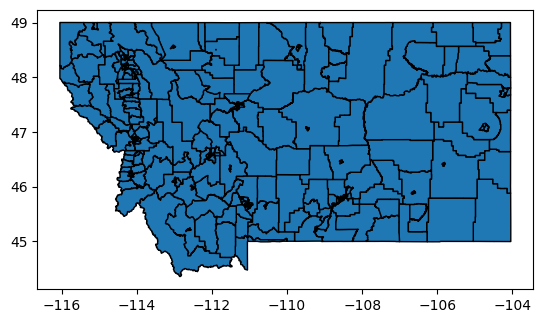

In [ ]:
import os
import geopandas as gpd

arquivos = [os.path.join("/content", f) for f in os.listdir("/content") if f.endswith(".shp")]
arquivo = max(arquivos, key=os.path.getmtime)
tl = gpd.read_file(arquivo).to_crs("EPSG:4326")
tl.plot(edgecolor="black")


In [ ]:
tl[["GEOID","geometry"]] ##TODO: Passar arquivo para HGI (CSV)

## BORO -> GEOID

,GEOID,geometry
0,30111001300,"POLYGON ((-108.60195 45.80163, -108.60192 45.8..."
1,30111001702,"POLYGON ((-108.57625 45.77692, -108.57613 45.7..."
2,30111000704,"POLYGON ((-108.5707 45.82331, -108.57063 45.82..."
3,30111000902,"POLYGON ((-108.52542 45.76976, -108.5245 45.76..."
4,30111000200,"POLYGON ((-108.53398 45.80169, -108.53199 45.8..."
...,...,...
314,30087940400,"POLYGON ((-106.72961 45.40753, -106.72961 45.4..."
315,30087000300,"POLYGON ((-106.69316 45.87987, -106.69258 45.8..."
316,30087000200,"POLYGON ((-107.00756 46.30764, -107.00563 46.3..."
317,30087000100,"POLYGON ((-107.89762 46.8486, -107.89743 46.84..."


In [ ]:
import geopandas as gpd
from shapely import wkt

boroughs = tl[["GEOID", "geometry"]].copy()
boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)

boroughs.to_csv(f"{diretorio_principal}/boroughs_area.csv", index=False)


/tmp/ipython-input-2001046065.py:5: UserWarning: Geometry column does not contain geometry.
  boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)


In [ ]:
boroughs

,GEOID,geometry
0,31137967000,"POLYGON ((-99.425549 40.407986, -99.42522 40.4..."
1,31137967200,"POLYGON ((-99.644407 40.516296, -99.644406 40...."
2,31137967100,"POLYGON ((-99.474313 40.496, -99.473837 40.495..."
3,31139979200,"POLYGON ((-97.834977 42.248801, -97.834983 42...."
4,31139979100,"POLYGON ((-97.56289 42.176754, -97.562806 42.1..."
...,...,...
548,31029961900,"POLYGON ((-102.051798 40.360069, -102.051555 4..."
549,31153010503,"POLYGON ((-96.009261 41.190702, -96.009134 41...."
550,31183973600,"POLYGON ((-98.761183 42.071172, -98.761164 42...."
551,31055007442,"POLYGON ((-96.158074 41.273971, -96.158074 41...."


In [ ]:
!rm -rf /usr/local/lib/python3.12/dist-packages/~orch*
!pip cache purge


Files removed: 6 (250 kB)


In [ ]:
%pip -q install -U pip setuptools wheel
%pip -q uninstall -y torch torchvision torchaudio torch-geometric torch-scatter torch-sparse torch-cluster torch-spline-conv pyg-lib
%pip -q install --no-cache-dir geopandas shapely libpysal h3 h3ronpy pyarrow scipy scikit-learn


In [ ]:
%pip -q install --no-cache-dir torch==2.4.0 torchvision==0.19.0 torchaudio==2.4.0 --index-url https://download.pytorch.org/whl/cpu
%pip -q install --no-cache-dir pyg-lib torch-scatter torch-sparse torch-cluster torch-spline-conv torch-geometric -f https://data.pyg.org/whl/torch-2.4.0+cpu.html


In [ ]:
%cd {diretorio_principal}

/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main


## POI Embedding

In [ ]:
FOLDER_ID_CRUS = "1cV807NNGn4gSDX-7fkJ83rlr0nRo4y89"
FOLDER_ID_SEPARATED = "1XUWhd59YDe8dSrTb6eZlLvhVcLSGpZ7n"

filename = f"checkins_{ESTADO}.csv"

path_crus = f"estados/crus/{filename}"
path_sep  = f"estados/separated/{filename}"

print("Baixando (crus)...")
download_from_folder_by_name(drive_service,FOLDER_ID_CRUS, filename, path_crus)

print("Baixando (separated)...")
download_from_folder_by_name(drive_service,FOLDER_ID_SEPARATED, filename, path_sep)

print("Concluído:", path_crus, "e", path_sep)


Baixando (crus)...
Baixando (separated)...
Concluído: estados/crus/checkins_Montana.csv e estados/separated/checkins_Montana.csv


In [ ]:
import pandas as pd, numpy as np, ast
import geopandas as gpd
from shapely.geometry import Point


CHECKIN_NAO_CRU = f"estados/crus/checkins_{ESTADO}.csv"
CHECKIN_CRU     = f"estados/separated/checkins_{ESTADO}.csv"
OUT_POIS        = "pois_gowalla.csv"

df_labeled = pd.read_csv(CHECKIN_NAO_CRU)
df_raw     = pd.read_csv(CHECKIN_CRU)

lon_col_raw = "lng" if "lng" in df_raw.columns else "longitude"
lat_col_raw = "lat" if "lat" in df_raw.columns else "latitude"
lon_col_lab = "lng" if "lng" in df_labeled.columns else ("longitude" if "longitude" in df_labeled.columns else None)
lat_col_lab = "lat" if "lat" in df_labeled.columns else ("latitude" if "latitude" in df_labeled.columns else None)

def parse_names(cell):
    try:
        lst = ast.literal_eval(cell)
        if isinstance(lst, list):
            return [d.get("name") for d in lst if isinstance(d, dict) and "name" in d]
    except Exception:
        pass
    return []

df_raw["__cat_names"] = df_raw["spot_categories"].fillna("[]").apply(parse_names)

def first_or_none(lst):
    return lst[0] if (isinstance(lst, list) and len(lst) > 0) else None

df_raw["__fclass_name"] = df_raw["__cat_names"].apply(first_or_none)

fclass_by_place = (df_raw.dropna(subset=["__fclass_name"])
                          .groupby("placeid")["__fclass_name"]
                          .agg(lambda s: s.mode().iat[0] if not s.mode().empty else s.iloc[0]))

cat_by_place = (df_labeled.dropna(subset=["category"])
                          .groupby("placeid")["category"]
                          .agg(lambda s: s.mode().iat[0] if not s.mode().empty else s.iloc[0]))

coords_raw = (df_raw.groupby("placeid")[[lat_col_raw, lon_col_raw]]
                    .mean()
                    .rename(columns={lat_col_raw: "latitude", lon_col_raw: "longitude"}))

if coords_raw.empty and lon_col_lab and lat_col_lab and (lon_col_lab in df_labeled.columns) and (lat_col_lab in df_labeled.columns):
    coords_raw = (df_labeled.groupby("placeid")[[lat_col_lab, lon_col_lab]]
                           .mean()
                           .rename(columns={lat_col_lab: "latitude", lon_col_lab: "longitude"}))

coords_raw = coords_raw.dropna()

pois = pd.DataFrame({"feature_id": coords_raw.index})
pois["feature_id"] = pois["feature_id"].astype(int)

pois["fclass_name"]   = fclass_by_place.reindex(pois["feature_id"]).values
pois["category_name"] = cat_by_place.reindex(pois["feature_id"]).values

pois = pois.dropna(subset=["fclass_name", "category_name"]).reset_index(drop=True)

gdf = gpd.GeoDataFrame(
    pois,
    geometry=gpd.points_from_xy(coords_raw.loc[pois["feature_id"], "longitude"].values,
                                coords_raw.loc[pois["feature_id"], "latitude"].values),
    crs="EPSG:4326"
)
gdf["geometry"] = gdf.geometry.apply(lambda p: p.wkt)

fclass_vocab = {n:i for i,n in enumerate(pd.Series(gdf["fclass_name"]).dropna().unique())}
cat_vocab    = {n:i for i,n in enumerate(pd.Series(gdf["category_name"]).dropna().unique())}

gdf["fclass"]   = gdf["fclass_name"].map(lambda n: fclass_vocab.get(n, -1)).astype(int)
gdf["category"] = gdf["category_name"].map(lambda n: cat_vocab.get(n, -1)).astype(int)

gdf = gdf[(gdf["fclass"]>=0) & (gdf["category"]>=0)].reset_index(drop=True)

pois_out = gdf[["feature_id", "category", "fclass", "geometry"]].copy()
pois_out.to_csv(OUT_POIS, index=False)



/tmp/ipython-input-2811998353.py:67: UserWarning: Geometry column does not contain geometry.
  gdf["geometry"] = gdf.geometry.apply(lambda p: p.wkt)


In [ ]:
# @title
import geopandas as gpd
from shapely.geometry import box

lat_min, lat_max = df["latitude"].min(), df["latitude"].max()
lon_min, lon_max = df["longitude"].min(), df["longitude"].max()
area = box(lon_min, lat_min, lon_max, lat_max).buffer(0.01)

boroughs = gpd.GeoDataFrame(geometry=[area], crs="EPSG:4326")

boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)
boroughs.to_csv("boroughs_area.csv", index=False)


In [ ]:
import sys
module_dir = f'{diretorio_principal}/region-embedding/baselines/poi-encoder'

sys.path.insert(0, module_dir)

In [ ]:
from POIEmbedding import PreProcess

PreProcess("pois_gowalla.csv", "boroughs_area.csv", h3=False).run() ##TODO H3 FALSO


boroughs cols: ['GEOID', 'geometry']
         GEOID                                           geometry
0  30111001300  POLYGON ((-108.60195 45.80163, -108.60192 45.8...
1  30111001702  POLYGON ((-108.57625 45.77692, -108.57613 45.7...
2  30111000704  POLYGON ((-108.5707 45.82331, -108.57063 45.82...
3  30111000902  POLYGON ((-108.52542 45.76976, -108.5245 45.76...
4  30111000200  POLYGON ((-108.53398 45.80169, -108.53199 45.8...
           GEOID                                           geometry
0    30111001300  POLYGON ((-108.60195 45.80163, -108.60192 45.8...
1    30111001702  POLYGON ((-108.57625 45.77692, -108.57613 45.7...
2    30111000704  POLYGON ((-108.5707 45.82331, -108.57063 45.82...
3    30111000902  POLYGON ((-108.52542 45.76976, -108.5245 45.76...
4    30111000200  POLYGON ((-108.53398 45.80169, -108.53199 45.8...
..           ...                                                ...
314  30087940400  POLYGON ((-106.72961 45.40753, -106.72961 45.4...
315  30087000300  POLYG

In [ ]:
import pandas as pd
import numpy as np
import torch
from shapely import wkt

def build_node_features_from_location_encoder(pois_csv_path: str,
                                              loc_embed_pt_path: str,
                                              placeid_col: str = "feature_id"):

    df_pois = pd.read_csv(pois_csv_path)
    if df_pois["geometry"].dtype == object:
        df_pois["geometry"] = df_pois["geometry"].apply(wkt.loads)

    blob = torch.load(loc_embed_pt_path, map_location="cpu")
    E = blob["embeddings"].detach().cpu().numpy()
    placeids = [str(p) for p in blob["placeids"]]
    placeid2idx = {pid: i for i, pid in enumerate(placeids)}

    ids = df_pois[placeid_col].astype(str).tolist()
    D = E.shape[1]
    X = np.zeros((len(ids), D), dtype=np.float32)

    for i, pid in enumerate(ids):
        idx = placeid2idx.get(pid)
        if idx is None:
            raise KeyError(f"placeid {pid} não encontrado em {loc_embed_pt_path}. "
                           f"")
        X[i] = E[idx]

    return X, df_pois


In [ ]:
# @title
from POIEmbedding import POI2Vec
p = POI2Vec()
p.train()
p.save_walks()


      source  target    weight
0          0    1149  0.448649
1          0      96  0.487299
2          0     804  0.491369
3          0     814  0.505366
4          0     906  0.486308
...      ...     ...       ...
3648    1211    1216  0.371429
3649    1211    1212  0.498321
3650    1212    1213  0.779403
3651    1212    1214  0.515824
3652    1213    1214  0.516458

[3653 rows x 3 columns]


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
# @title
from POIEmbedding import POI2Vec
from model import POISet, EmbeddingModel
import torch, torch.utils.data as tud

poi2vec = POI2Vec()
poi2vec.read_walks()
poi2vec.get_global_second_class_walks()

second_class_hierarchy_pairs = list(set([tuple(x) for x in poi2vec.pois[["category","fclass"]].to_numpy()]))
dataset = POISet(
    poi2vec.second_class_number,
    poi2vec.second_class_walks,
    poi2vec.global_second_class_walks,
    k=5
)
model = EmbeddingModel(
    vocab_size=poi2vec.second_class_number,
    embed_size=64,
    second_class_hierarchy_pairs=second_class_hierarchy_pairs,
    le_lambda=1e-8
)

loader = tud.DataLoader(dataset, batch_size=2048, shuffle=True)
opt = torch.optim.Adam(model.parameters(), lr=5e-2)
for e in range(5):
    for i,(inp,pos,neg) in enumerate(loader):
        opt.zero_grad()
        loss,_ = model(inp.long(), pos.long(), neg.long())
        loss.backward()
        opt.step()

torch.save({f"in_embed_{ESTADO}.weight": model.clone_input_embedding()}, f"poi-encoder-gowalla-h3_{ESTADO}.tensor")


      source  target    weight
0          0    1149  0.448649
1          0      96  0.487299
2          0     804  0.491369
3          0     814  0.505366
4          0     906  0.486308
...      ...     ...       ...
3648    1211    1216  0.371429
3649    1211    1212  0.498321
3650    1212    1213  0.779403
3651    1212    1214  0.515824
3652    1213    1214  0.516458

[3653 rows x 3 columns]


In [ ]:
print(f"poi-encoder-gowalla-h3_{ESTADO}.tensor")

poi-encoder-gowalla-h3_Montana.tensor


## HGI

In [ ]:
import sys
module_dir = f'{diretorio_principal}/region-embedding/baselines/HGI/preprocess'

sys.path.insert(0, module_dir)

In [ ]:
import pandas as pd
import numpy as np
import torch
out_df = pd.read_csv(f"/content/drive/MyDrive/MTL_POI_Novo/data/output/{ESTADO.lower()}/embeddings-poi-encoder.csv")
out_df = out_df.sort_values("placeid").reset_index(drop=True)

placeids = out_df["placeid"].astype(str).tolist()

emb_cols = [c for c in out_df.columns if c.isnumeric()]
E = out_df[emb_cols].to_numpy(dtype=np.float32)

torch.save({
    "embeddings": torch.from_numpy(E),
    "placeids": placeids
}, f"/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main/poi_embeddings_encoder.pt")

print("Arquivo salvo com sucesso!")
print(E.shape, "embeddings salvos")


Arquivo salvo com sucesso!
(6171, 64) embeddings salvos


In [ ]:
import torch, numpy as np, pandas as pd
from torch_geometric.data import Data
from main import Preprocess

POIS = "pois_gowalla.csv"
REGS = "boroughs_area.csv"

data_dict = Preprocess(POIS, REGS, emb_filename=None, h3=False).get_data_torch()

loc_pt_path = "/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main/poi_embeddings_encoder.pt"
blob = torch.load(loc_pt_path, map_location="cpu")
E = blob["embeddings"].detach().cpu().numpy()
placeids = [str(p) for p in blob["placeids"]]
placeid2idx = {pid: i for i, pid in enumerate(placeids)}
D = E.shape[1]

order = pd.read_csv("poi_index.csv")
order["feature_id"] = order["feature_id"].astype(str)

X = np.zeros((len(order), D), dtype=np.float32)
for i, pid in enumerate(order["feature_id"].tolist()):
    idx = placeid2idx.get(pid)
    if idx is None:
        raise KeyError(f"placeid {pid} não encontrado em {loc_pt_path}. Gere embeddings para todos os POIs.")
    X[i] = E[idx]

import numpy as np
ei = np.asarray(data_dict['edge_index'])
assert ei.max() < X.shape[0], "edge_index referencia nó >= len(X) — ordem quebrou"

g = Data(
    x=torch.tensor(X, dtype=torch.float32),
    edge_index=torch.tensor(data_dict['edge_index'], dtype=torch.long),
    edge_weight=torch.tensor(data_dict['edge_weight'], dtype=torch.float32),
)
g.region_id  = torch.tensor(data_dict['region_id'], dtype=torch.long)
g.region_area = torch.tensor(data_dict['region_area'], dtype=torch.float32)
g.coarse_region_similarity = torch.tensor(data_dict['coarse_region_similarity'], dtype=torch.float32)
g.region_adjacency = torch.tensor(data_dict['region_adjacency'], dtype=torch.long)

torch.save(g, "gowalla.pt")


reading poi data
reading boroughs data


/usr/local/lib/python3.12/dist-packages/libpysal/weights/util.py:1618: UserWarning: The weights matrix is not fully connected: 
 There are 14 disconnected components.
 There are 6 islands with ids: 31, 86, 109, 142, 178, 180.
  return W(neighbors, **kwargs)


reading boroughs data
creating graph
      feature_id  category  fclass                     geometry  index_right  \
0           9413         0       0  POINT (-114.08428 46.91893)          159   
1          57226         0       0  POINT (-114.25269 48.30766)          229   
2          57244         1       1  POINT (-114.33695 48.41222)           35   
3          57269         0       2  POINT (-114.33162 48.40026)          147   
4          57456         1       3   POINT (-114.33622 48.4097)           35   
...          ...       ...     ...                          ...          ...   
1219     7555386         6     146  POINT (-111.27907 47.51297)          105   
1220     7562685         2      14  POINT (-111.09938 44.66297)           37   
1221     7562747         1      15  POINT (-111.09994 44.66112)           37   
1222     7563383         3      33  POINT (-112.50579 45.98295)           86   
1223     7565831         6     146  POINT (-108.56642 45.75476)          123   

  

/usr/local/lib/python3.12/dist-packages/libpysal/weights/util.py:1618: UserWarning: The weights matrix is not fully connected: 
 There are 14 disconnected components.
 There are 6 islands with ids: 31, 86, 109, 142, 178, 180.
  return W(neighbors, **kwargs)
/tmp/ipython-input-1748186182.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_

creating region similarity by cosine similarity of embeddings
finishing preprocessing


In [ ]:
import os, pickle as pkl, torch
from torch_geometric.data import Data

os.makedirs("./data", exist_ok=True)

g = torch.load("./gowalla.pt", map_location="cpu")

data_dict = {
    "node_features": g.x.detach().cpu().numpy(),
    "edge_index": g.edge_index.detach().cpu().numpy(),
    "edge_weight": g.edge_weight.detach().cpu().numpy(),
    "region_id": g.region_id.detach().cpu().numpy(),
    "region_area": g.region_area.detach().cpu().numpy(),
    "coarse_region_similarity": g.coarse_region_similarity.detach().cpu().numpy(),
    "region_adjacency": g.region_adjacency.detach().cpu().numpy(),
}

with open("./data/gowalla_hgi_data.pkl", "wb") as f:
    pkl.dump(data_dict, f)



/tmp/ipython-input-1595378934.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  g = torch.load("./gowalla.pt", map_location="cpu")


In [ ]:
import numpy as np

R_from_id = int(np.max(data_dict["region_id"])) + 1
R_area    = len(data_dict["region_area"])
R_adj     = int(data_dict["region_adjacency"].max()) + 1
R_sim     = data_dict["coarse_region_similarity"].shape[0]

print("R from id :", R_from_id)
print("R area    :", R_area)
print("R adj     :", R_adj)
print("R sim     :", R_sim)

assert R_from_id == R_area == R_adj == R_sim, "Desalinhad"


R from id : 208
R area    : 208
R adj     : 208
R sim     : 208


In [ ]:
!python {diretorio_principal}/region-embedding/baselines/HGI/train.py --city gowalla --dim 64 --alpha 0.5 --attention_head 4 --epoch 300 --device cpu --save_name gowalla_h3


Streaming output truncated to the last 5000 lines.
Parameter containing:
tensor([[ 0.0971,  0.0477, -0.0497,  ..., -0.0825,  0.1083, -0.0277],
        [-0.0772,  0.0122, -0.0158,  ..., -0.0807,  0.0190, -0.1522],
        [-0.0752, -0.0887, -0.0248,  ..., -0.0435,  0.0963, -0.0493],
        ...,
        [ 0.0335, -0.0192,  0.1901,  ...,  0.0732,  0.0053, -0.1404],
        [ 0.0759, -0.0667, -0.1052,  ..., -0.0820,  0.0190, -0.1186],
        [-0.1924, -0.0348,  0.0271,  ..., -0.0830, -0.0643,  0.1261]],
       requires_grad=True) Parameter containing:
tensor([[ 0.1166,  0.0990,  0.0745,  ...,  0.0673,  0.0081, -0.0022],
        [ 0.0453,  0.0904,  0.1274,  ...,  0.0586,  0.0558,  0.0399],
        [ 0.0960,  0.0893, -0.0897,  ..., -0.0994, -0.0292,  0.0062],
        ...,
        [-0.1103,  0.1389,  0.0186,  ..., -0.0772, -0.0498,  0.0669],
        [ 0.0455,  0.0139, -0.0784,  ...,  0.1419, -0.0575, -0.0353],
        [ 0.0364,  0.1087, -0.1176,  ...,  0.0318,  0.0718,  0.0219]],
       req

# Alabama


Census: https://catalog.data.gov/dataset/tiger-line-shapefile-2021-state-nebraska-census-tracts

In [ ]:
ESTADO = "Alabama"

In [ ]:
diretorio_principal = "/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main/"

In [ ]:
baixar_shapefile_estado("alabama")

<Axes: >

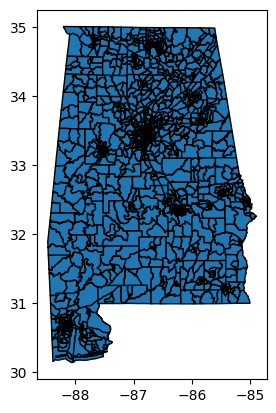

In [ ]:
import os
import geopandas as gpd

arquivos = [os.path.join("/content", f) for f in os.listdir("/content") if f.endswith(".shp")]
arquivo = max(arquivos, key=os.path.getmtime)
tl = gpd.read_file(arquivo).to_crs("EPSG:4326")
tl.plot(edgecolor="black")


In [ ]:
tl[["GEOID","geometry"]] ##TODO: Passar arquivo para HGI (CSV)

## BORO -> GEOID

,GEOID,geometry
0,01079979201,"POLYGON ((-87.43611 34.72743, -87.4361 34.7274..."
1,01079979202,"POLYGON ((-87.45696 34.61352, -87.45693 34.613..."
2,01079979502,"POLYGON ((-87.29614 34.54337, -87.2961 34.5434..."
3,01079979501,"POLYGON ((-87.20741 34.5571, -87.2074 34.55731..."
4,01009050103,"POLYGON ((-86.57229 33.8207, -86.57229 33.8208..."
...,...,...
1432,01087232200,"POLYGON ((-86.02316 32.41927, -86.02312 32.419..."
1433,01087232000,"POLYGON ((-85.71336 32.44663, -85.71318 32.447..."
1434,01087231500,"POLYGON ((-85.88615 32.49305, -85.88575 32.493..."
1435,01087231400,"POLYGON ((-85.64797 32.44458, -85.64626 32.445..."


In [ ]:
import geopandas as gpd
from shapely import wkt

boroughs = tl[["GEOID", "geometry"]].copy()
boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)

boroughs.to_csv(f"{diretorio_principal}/boroughs_area.csv", index=False)


/tmp/ipython-input-2001046065.py:5: UserWarning: Geometry column does not contain geometry.
  boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)


In [ ]:
boroughs

,GEOID,geometry
0,01079979201,"POLYGON ((-87.436107 34.727427, -87.436104 34...."
1,01079979202,"POLYGON ((-87.45696 34.613518, -87.456933 34.6..."
2,01079979502,"POLYGON ((-87.296137 34.543373, -87.296104 34...."
3,01079979501,"POLYGON ((-87.20741 34.557097, -87.2074 34.557..."
4,01009050103,"POLYGON ((-86.572293 33.820705, -86.572291 33...."
...,...,...
1432,01087232200,"POLYGON ((-86.023164 32.419268, -86.02312 32.4..."
1433,01087232000,"POLYGON ((-85.713356 32.446634, -85.713179 32...."
1434,01087231500,"POLYGON ((-85.886148 32.493053, -85.885746 32...."
1435,01087231400,"POLYGON ((-85.647973 32.444578, -85.64626 32.4..."


In [ ]:
!rm -rf /usr/local/lib/python3.12/dist-packages/~orch*
!pip cache purge


Files removed: 6 (250 kB)


In [ ]:
%pip -q install -U pip setuptools wheel
%pip -q uninstall -y torch torchvision torchaudio torch-geometric torch-scatter torch-sparse torch-cluster torch-spline-conv pyg-lib
%pip -q install --no-cache-dir geopandas shapely libpysal h3 h3ronpy pyarrow scipy scikit-learn


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 31.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 66.1 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ipython 7.34.0 requires jedi>=0.16, which is not installed.


In [ ]:
%pip -q install --no-cache-dir torch==2.4.0 torchvision==0.19.0 torchaudio==2.4.0 --index-url https://download.pytorch.org/whl/cpu
%pip -q install --no-cache-dir pyg-lib torch-scatter torch-sparse torch-cluster torch-spline-conv torch-geometric -f https://data.pyg.org/whl/torch-2.4.0+cpu.html


In [ ]:
%cd {diretorio_principal}

/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main


## POI Embedding

In [ ]:
FOLDER_ID_CRUS = "1cV807NNGn4gSDX-7fkJ83rlr0nRo4y89"
FOLDER_ID_SEPARATED = "1XUWhd59YDe8dSrTb6eZlLvhVcLSGpZ7n"

filename = f"checkins_{ESTADO}.csv"

path_crus = f"estados/crus/{filename}"
path_sep  = f"estados/separated/{filename}"

print("Baixando (crus)...")
download_from_folder_by_name(drive_service,FOLDER_ID_CRUS, filename, path_crus)

print("Baixando (separated)...")
download_from_folder_by_name(drive_service,FOLDER_ID_SEPARATED, filename, path_sep)

print("Concluído:", path_crus, "e", path_sep)


Baixando (crus)...
Baixando (separated)...
Concluído: estados/crus/checkins_Alabama.csv e estados/separated/checkins_Alabama.csv


In [ ]:
import pandas as pd, numpy as np, ast
import geopandas as gpd
from shapely.geometry import Point


CHECKIN_NAO_CRU = f"estados/crus/checkins_{ESTADO}.csv"
CHECKIN_CRU     = f"estados/separated/checkins_{ESTADO}.csv"
OUT_POIS        = "pois_gowalla.csv"

df_labeled = pd.read_csv(CHECKIN_NAO_CRU)
df_raw     = pd.read_csv(CHECKIN_CRU)

lon_col_raw = "lng" if "lng" in df_raw.columns else "longitude"
lat_col_raw = "lat" if "lat" in df_raw.columns else "latitude"
lon_col_lab = "lng" if "lng" in df_labeled.columns else ("longitude" if "longitude" in df_labeled.columns else None)
lat_col_lab = "lat" if "lat" in df_labeled.columns else ("latitude" if "latitude" in df_labeled.columns else None)

def parse_names(cell):
    try:
        lst = ast.literal_eval(cell)
        if isinstance(lst, list):
            return [d.get("name") for d in lst if isinstance(d, dict) and "name" in d]
    except Exception:
        pass
    return []

df_raw["__cat_names"] = df_raw["spot_categories"].fillna("[]").apply(parse_names)

def first_or_none(lst):
    return lst[0] if (isinstance(lst, list) and len(lst) > 0) else None

df_raw["__fclass_name"] = df_raw["__cat_names"].apply(first_or_none)

fclass_by_place = (df_raw.dropna(subset=["__fclass_name"])
                          .groupby("placeid")["__fclass_name"]
                          .agg(lambda s: s.mode().iat[0] if not s.mode().empty else s.iloc[0]))

cat_by_place = (df_labeled.dropna(subset=["category"])
                          .groupby("placeid")["category"]
                          .agg(lambda s: s.mode().iat[0] if not s.mode().empty else s.iloc[0]))

coords_raw = (df_raw.groupby("placeid")[[lat_col_raw, lon_col_raw]]
                    .mean()
                    .rename(columns={lat_col_raw: "latitude", lon_col_raw: "longitude"}))

if coords_raw.empty and lon_col_lab and lat_col_lab and (lon_col_lab in df_labeled.columns) and (lat_col_lab in df_labeled.columns):
    coords_raw = (df_labeled.groupby("placeid")[[lat_col_lab, lon_col_lab]]
                           .mean()
                           .rename(columns={lat_col_lab: "latitude", lon_col_lab: "longitude"}))

coords_raw = coords_raw.dropna()

pois = pd.DataFrame({"feature_id": coords_raw.index})
pois["feature_id"] = pois["feature_id"].astype(int)

pois["fclass_name"]   = fclass_by_place.reindex(pois["feature_id"]).values
pois["category_name"] = cat_by_place.reindex(pois["feature_id"]).values

pois = pois.dropna(subset=["fclass_name", "category_name"]).reset_index(drop=True)

gdf = gpd.GeoDataFrame(
    pois,
    geometry=gpd.points_from_xy(coords_raw.loc[pois["feature_id"], "longitude"].values,
                                coords_raw.loc[pois["feature_id"], "latitude"].values),
    crs="EPSG:4326"
)
gdf["geometry"] = gdf.geometry.apply(lambda p: p.wkt)

fclass_vocab = {n:i for i,n in enumerate(pd.Series(gdf["fclass_name"]).dropna().unique())}
cat_vocab    = {n:i for i,n in enumerate(pd.Series(gdf["category_name"]).dropna().unique())}

gdf["fclass"]   = gdf["fclass_name"].map(lambda n: fclass_vocab.get(n, -1)).astype(int)
gdf["category"] = gdf["category_name"].map(lambda n: cat_vocab.get(n, -1)).astype(int)

gdf = gdf[(gdf["fclass"]>=0) & (gdf["category"]>=0)].reset_index(drop=True)

pois_out = gdf[["feature_id", "category", "fclass", "geometry"]].copy()
pois_out.to_csv(OUT_POIS, index=False)



/tmp/ipython-input-2811998353.py:67: UserWarning: Geometry column does not contain geometry.
  gdf["geometry"] = gdf.geometry.apply(lambda p: p.wkt)


In [ ]:
# @title
import geopandas as gpd
from shapely.geometry import box

lat_min, lat_max = df["latitude"].min(), df["latitude"].max()
lon_min, lon_max = df["longitude"].min(), df["longitude"].max()
area = box(lon_min, lat_min, lon_max, lat_max).buffer(0.01)

boroughs = gpd.GeoDataFrame(geometry=[area], crs="EPSG:4326")

boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)
boroughs.to_csv("boroughs_area.csv", index=False)


In [ ]:
import sys
module_dir = f'{diretorio_principal}/region-embedding/baselines/poi-encoder'

sys.path.insert(0, module_dir)

In [ ]:
from POIEmbedding import PreProcess

PreProcess("pois_gowalla.csv", "boroughs_area.csv", h3=False).run() ##TODO H3 FALSO


boroughs cols: ['GEOID', 'geometry']
         GEOID                                           geometry
0  30111001300  POLYGON ((-108.60195 45.80163, -108.60192 45.8...
1  30111001702  POLYGON ((-108.57625 45.77692, -108.57613 45.7...
2  30111000704  POLYGON ((-108.5707 45.82331, -108.57063 45.82...
3  30111000902  POLYGON ((-108.52542 45.76976, -108.5245 45.76...
4  30111000200  POLYGON ((-108.53398 45.80169, -108.53199 45.8...
           GEOID                                           geometry
0    30111001300  POLYGON ((-108.60195 45.80163, -108.60192 45.8...
1    30111001702  POLYGON ((-108.57625 45.77692, -108.57613 45.7...
2    30111000704  POLYGON ((-108.5707 45.82331, -108.57063 45.82...
3    30111000902  POLYGON ((-108.52542 45.76976, -108.5245 45.76...
4    30111000200  POLYGON ((-108.53398 45.80169, -108.53199 45.8...
..           ...                                                ...
314  30087940400  POLYGON ((-106.72961 45.40753, -106.72961 45.4...
315  30087000300  POLYG

In [ ]:
import pandas as pd
import numpy as np
import torch
from shapely import wkt

def build_node_features_from_location_encoder(pois_csv_path: str,
                                              loc_embed_pt_path: str,
                                              placeid_col: str = "feature_id"):

    df_pois = pd.read_csv(pois_csv_path)
    if df_pois["geometry"].dtype == object:
        df_pois["geometry"] = df_pois["geometry"].apply(wkt.loads)

    blob = torch.load(loc_embed_pt_path, map_location="cpu")
    E = blob["embeddings"].detach().cpu().numpy()
    placeids = [str(p) for p in blob["placeids"]]
    placeid2idx = {pid: i for i, pid in enumerate(placeids)}

    ids = df_pois[placeid_col].astype(str).tolist()
    D = E.shape[1]
    X = np.zeros((len(ids), D), dtype=np.float32)

    for i, pid in enumerate(ids):
        idx = placeid2idx.get(pid)
        if idx is None:
            raise KeyError(f"placeid {pid} não encontrado em {loc_embed_pt_path}. "
                           f"")
        X[i] = E[idx]

    return X, df_pois


In [ ]:
# @title
from POIEmbedding import POI2Vec
p = POI2Vec()
p.train()
p.save_walks()


      source  target    weight
0          0    1149  0.448649
1          0      96  0.487299
2          0     804  0.491369
3          0     814  0.505366
4          0     906  0.486308
...      ...     ...       ...
3648    1211    1216  0.371429
3649    1211    1212  0.498321
3650    1212    1213  0.779403
3651    1212    1214  0.515824
3652    1213    1214  0.516458

[3653 rows x 3 columns]


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
# @title
from POIEmbedding import POI2Vec
from model import POISet, EmbeddingModel
import torch, torch.utils.data as tud

poi2vec = POI2Vec()
poi2vec.read_walks()
poi2vec.get_global_second_class_walks()

second_class_hierarchy_pairs = list(set([tuple(x) for x in poi2vec.pois[["category","fclass"]].to_numpy()]))
dataset = POISet(
    poi2vec.second_class_number,
    poi2vec.second_class_walks,
    poi2vec.global_second_class_walks,
    k=5
)
model = EmbeddingModel(
    vocab_size=poi2vec.second_class_number,
    embed_size=64,
    second_class_hierarchy_pairs=second_class_hierarchy_pairs,
    le_lambda=1e-8
)

loader = tud.DataLoader(dataset, batch_size=2048, shuffle=True)
opt = torch.optim.Adam(model.parameters(), lr=5e-2)
for e in range(5):
    for i,(inp,pos,neg) in enumerate(loader):
        opt.zero_grad()
        loss,_ = model(inp.long(), pos.long(), neg.long())
        loss.backward()
        opt.step()

torch.save({f"in_embed_{ESTADO}.weight": model.clone_input_embedding()}, f"poi-encoder-gowalla-h3_{ESTADO}.tensor")


      source  target    weight
0          0    1149  0.448649
1          0      96  0.487299
2          0     804  0.491369
3          0     814  0.505366
4          0     906  0.486308
...      ...     ...       ...
3648    1211    1216  0.371429
3649    1211    1212  0.498321
3650    1212    1213  0.779403
3651    1212    1214  0.515824
3652    1213    1214  0.516458

[3653 rows x 3 columns]


In [ ]:
print(f"poi-encoder-gowalla-h3_{ESTADO}.tensor")

poi-encoder-gowalla-h3_Montana.tensor


## HGI

In [ ]:
import sys
module_dir = f'{diretorio_principal}/region-embedding/baselines/HGI/preprocess'

sys.path.insert(0, module_dir)

In [ ]:
import pandas as pd
import numpy as np
import torch
out_df = pd.read_csv(f"/content/drive/MyDrive/MTL_POI_Novo/data/output/{ESTADO.lower()}/embeddings-poi-encoder.csv")
out_df = out_df.sort_values("placeid").reset_index(drop=True)

placeids = out_df["placeid"].astype(str).tolist()

emb_cols = [c for c in out_df.columns if c.isnumeric()]
E = out_df[emb_cols].to_numpy(dtype=np.float32)

torch.save({
    "embeddings": torch.from_numpy(E),
    "placeids": placeids
}, f"/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main/poi_embeddings_encoder.pt")

print("Arquivo salvo com sucesso!")
print(E.shape, "embeddings salvos")


Arquivo salvo com sucesso!
(93402, 64) embeddings salvos


In [ ]:
import torch, numpy as np, pandas as pd
from torch_geometric.data import Data
from main import Preprocess

POIS = "pois_gowalla.csv"
REGS = "boroughs_area.csv"

data_dict = Preprocess(POIS, REGS, emb_filename=None, h3=False).get_data_torch()

loc_pt_path = "/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main/poi_embeddings_encoder.pt"
blob = torch.load(loc_pt_path, map_location="cpu")
E = blob["embeddings"].detach().cpu().numpy()
placeids = [str(p) for p in blob["placeids"]]
placeid2idx = {pid: i for i, pid in enumerate(placeids)}
D = E.shape[1]

order = pd.read_csv("poi_index.csv")
order["feature_id"] = order["feature_id"].astype(str)

X = np.zeros((len(order), D), dtype=np.float32)
for i, pid in enumerate(order["feature_id"].tolist()):
    idx = placeid2idx.get(pid)
    if idx is None:
        raise KeyError(f"placeid {pid} não encontrado em {loc_pt_path}. Gere embeddings para todos os POIs.")
    X[i] = E[idx]

import numpy as np
ei = np.asarray(data_dict['edge_index'])
assert ei.max() < X.shape[0], "edge_index referencia nó >= len(X) — ordem quebrou"

g = Data(
    x=torch.tensor(X, dtype=torch.float32),
    edge_index=torch.tensor(data_dict['edge_index'], dtype=torch.long),
    edge_weight=torch.tensor(data_dict['edge_weight'], dtype=torch.float32),
)
g.region_id  = torch.tensor(data_dict['region_id'], dtype=torch.long)
g.region_area = torch.tensor(data_dict['region_area'], dtype=torch.float32)
g.coarse_region_similarity = torch.tensor(data_dict['coarse_region_similarity'], dtype=torch.float32)
g.region_adjacency = torch.tensor(data_dict['region_adjacency'], dtype=torch.long)

torch.save(g, "gowalla.pt")


reading poi data
reading boroughs data


/usr/local/lib/python3.12/dist-packages/libpysal/weights/util.py:1618: UserWarning: The weights matrix is not fully connected: 
 There are 16 disconnected components.
 There are 7 islands with ids: 131, 288, 310, 775, 863, 865, 1065.
  return W(neighbors, **kwargs)


reading boroughs data
creating graph
       feature_id  category  fclass                    geometry  index_right  \
0            9531         0       0  POINT (-86.80362 33.38157)         1322   
1            9532         1       1  POINT (-86.80523 33.38792)          151   
2            9533         2       2  POINT (-86.79326 33.38684)         1322   
3            9593         3       3  POINT (-86.75109 33.56114)          149   
4            9693         4       4  POINT (-86.77925 33.48669)          438   
...           ...       ...     ...                         ...          ...   
10264     7565433         6      79  POINT (-87.67046 34.76912)         1234   
10265     7568997         0      51  POINT (-85.01443 32.49563)          686   
10266     7570992         3      49  POINT (-87.68579 30.26555)          904   
10267     7574223         6      44  POINT (-86.84374 34.17847)           44   
10268     7574363         0      86   POINT (-86.7737 33.51502)          492   

  

/usr/local/lib/python3.12/dist-packages/libpysal/weights/util.py:1618: UserWarning: The weights matrix is not fully connected: 
 There are 16 disconnected components.
 There are 7 islands with ids: 131, 288, 310, 775, 863, 865, 1065.
  return W(neighbors, **kwargs)
/tmp/ipython-input-1748186182.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `

creating region similarity by cosine similarity of embeddings
finishing preprocessing


In [ ]:
import os, pickle as pkl, torch
from torch_geometric.data import Data

os.makedirs("./data", exist_ok=True)

g = torch.load("./gowalla.pt", map_location="cpu")

data_dict = {
    "node_features": g.x.detach().cpu().numpy(),
    "edge_index": g.edge_index.detach().cpu().numpy(),
    "edge_weight": g.edge_weight.detach().cpu().numpy(),
    "region_id": g.region_id.detach().cpu().numpy(),
    "region_area": g.region_area.detach().cpu().numpy(),
    "coarse_region_similarity": g.coarse_region_similarity.detach().cpu().numpy(),
    "region_adjacency": g.region_adjacency.detach().cpu().numpy(),
}

with open("./data/gowalla_hgi_data.pkl", "wb") as f:
    pkl.dump(data_dict, f)



/tmp/ipython-input-1595378934.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  g = torch.load("./gowalla.pt", map_location="cpu")


In [ ]:
import numpy as np

R_from_id = int(np.max(data_dict["region_id"])) + 1
R_area    = len(data_dict["region_area"])
R_adj     = int(data_dict["region_adjacency"].max()) + 1
R_sim     = data_dict["coarse_region_similarity"].shape[0]

print("R from id :", R_from_id)
print("R area    :", R_area)
print("R adj     :", R_adj)
print("R sim     :", R_sim)

assert R_from_id == R_area == R_adj == R_sim, "Desalinhad"


R from id : 1072
R area    : 1072
R adj     : 1072
R sim     : 1072


In [ ]:
!python {diretorio_principal}/region-embedding/baselines/HGI/train.py --city gowalla --dim 64 --alpha 0.5 --attention_head 4 --epoch 300 --device cpu --save_name gowalla_h3


Streaming output truncated to the last 5000 lines.
Parameter containing:
tensor([[-0.0823,  0.0205,  0.0214,  ...,  0.0195,  0.1195,  0.0366],
        [-0.0877,  0.0770, -0.0846,  ...,  0.0263, -0.1825, -0.0738],
        [-0.0150,  0.0053,  0.1060,  ..., -0.0378,  0.0222, -0.0359],
        ...,
        [ 0.0066, -0.0945,  0.0590,  ...,  0.0582, -0.0070,  0.0394],
        [ 0.0211, -0.0292,  0.1327,  ...,  0.0268,  0.0256,  0.0806],
        [-0.0386, -0.1190,  0.1241,  ..., -0.0419,  0.0208, -0.0331]],
       requires_grad=True) Parameter containing:
tensor([[-0.0364,  0.0464, -0.0517,  ...,  0.0375,  0.0613, -0.0924],
        [-0.0833,  0.0836,  0.0556,  ..., -0.0505,  0.0914,  0.1122],
        [ 0.1211, -0.1018,  0.0879,  ..., -0.0859,  0.0749, -0.0909],
        ...,
        [-0.0780, -0.0021, -0.0897,  ..., -0.0232,  0.0874, -0.0423],
        [-0.1362,  0.0222, -0.0059,  ...,  0.0781, -0.0856,  0.0418],
        [ 0.0712, -0.0633, -0.0361,  ..., -0.0380,  0.0874, -0.0869]],
       req

# Florida


Census: https://catalog.data.gov/dataset/tiger-line-shapefile-2021-state-nebraska-census-tracts

In [ ]:
ESTADO = "Florida"

In [ ]:
diretorio_principal = "/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main/"

In [ ]:
baixar_shapefile_estado("florida")

<Axes: >

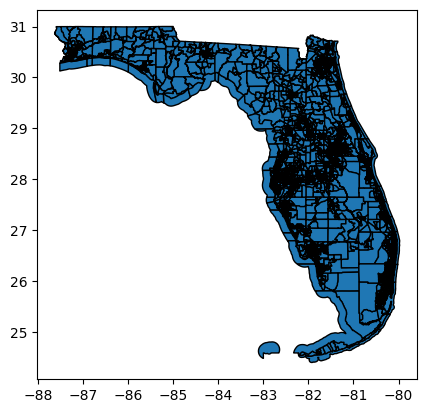

In [ ]:
import os
import geopandas as gpd

arquivos = [os.path.join("/content", f) for f in os.listdir("/content") if f.endswith(".shp")]
arquivo = max(arquivos, key=os.path.getmtime)
tl = gpd.read_file(arquivo).to_crs("EPSG:4326")
tl.plot(edgecolor="black")


In [ ]:
tl[["GEOID","geometry"]] ##TODO: Passar arquivo para HGI (CSV)

## BORO -> GEOID

,GEOID,geometry
0,12127080600,"POLYGON ((-81.07344 29.29253, -81.07342 29.292..."
1,12127082406,"POLYGON ((-81.01981 29.15447, -81.01972 29.154..."
2,12127081300,"POLYGON ((-81.01538 29.21656, -81.0151 29.2170..."
3,12127081500,"POLYGON ((-81.03353 29.22556, -81.03318 29.225..."
4,12127081600,"POLYGON ((-81.0493 29.22346, -81.04926 29.2234..."
...,...,...
5155,12103028103,"POLYGON ((-82.7461 27.74625, -82.74606 27.7463..."
5156,12103028104,"POLYGON ((-82.75336 27.75266, -82.75275 27.753..."
5157,12103024408,"POLYGON ((-82.63872 27.8428, -82.63812 27.8428..."
5158,12086000710,"POLYGON ((-80.31436 25.84797, -80.31305 25.847..."


In [ ]:
import geopandas as gpd
from shapely import wkt

boroughs = tl[["GEOID", "geometry"]].copy()
boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)

boroughs.to_csv(f"{diretorio_principal}/boroughs_area.csv", index=False)


/tmp/ipython-input-2001046065.py:5: UserWarning: Geometry column does not contain geometry.
  boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)


In [ ]:
boroughs

,GEOID,geometry
0,01079979201,"POLYGON ((-87.436107 34.727427, -87.436104 34...."
1,01079979202,"POLYGON ((-87.45696 34.613518, -87.456933 34.6..."
2,01079979502,"POLYGON ((-87.296137 34.543373, -87.296104 34...."
3,01079979501,"POLYGON ((-87.20741 34.557097, -87.2074 34.557..."
4,01009050103,"POLYGON ((-86.572293 33.820705, -86.572291 33...."
...,...,...
1432,01087232200,"POLYGON ((-86.023164 32.419268, -86.02312 32.4..."
1433,01087232000,"POLYGON ((-85.713356 32.446634, -85.713179 32...."
1434,01087231500,"POLYGON ((-85.886148 32.493053, -85.885746 32...."
1435,01087231400,"POLYGON ((-85.647973 32.444578, -85.64626 32.4..."


In [ ]:
!rm -rf /usr/local/lib/python3.12/dist-packages/~orch*
!pip cache purge


Files removed: 6 (250 kB)


In [ ]:
%pip -q install -U pip setuptools wheel
%pip -q uninstall -y torch torchvision torchaudio torch-geometric torch-scatter torch-sparse torch-cluster torch-spline-conv pyg-lib
%pip -q install --no-cache-dir geopandas shapely libpysal h3 h3ronpy pyarrow scipy scikit-learn


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 21.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 80.0 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ipython 7.34.0 requires jedi>=0.16, which is not installed.


In [ ]:
%pip -q install --no-cache-dir torch==2.4.0 torchvision==0.19.0 torchaudio==2.4.0 --index-url https://download.pytorch.org/whl/cpu
%pip -q install --no-cache-dir pyg-lib torch-scatter torch-sparse torch-cluster torch-spline-conv torch-geometric -f https://data.pyg.org/whl/torch-2.4.0+cpu.html


In [ ]:
%cd {diretorio_principal}

/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main


## POI Embedding

In [ ]:
FOLDER_ID_CRUS = "1cV807NNGn4gSDX-7fkJ83rlr0nRo4y89"
FOLDER_ID_SEPARATED = "1XUWhd59YDe8dSrTb6eZlLvhVcLSGpZ7n"

filename = f"checkins_{ESTADO}.csv"

path_crus = f"estados/crus/{filename}"
path_sep  = f"estados/separated/{filename}"

print("Baixando (crus)...")
download_from_folder_by_name(drive_service,FOLDER_ID_CRUS, filename, path_crus)

print("Baixando (separated)...")
download_from_folder_by_name(drive_service,FOLDER_ID_SEPARATED, filename, path_sep)

print("Concluído:", path_crus, "e", path_sep)


Baixando (crus)...
Baixando (separated)...
Concluído: estados/crus/checkins_Florida.csv e estados/separated/checkins_Florida.csv


In [ ]:
import pandas as pd, numpy as np, ast
import geopandas as gpd
from shapely.geometry import Point


CHECKIN_NAO_CRU = f"estados/crus/checkins_{ESTADO}.csv"
CHECKIN_CRU     = f"estados/separated/checkins_{ESTADO}.csv"
OUT_POIS        = "pois_gowalla.csv"

df_labeled = pd.read_csv(CHECKIN_NAO_CRU)
df_raw     = pd.read_csv(CHECKIN_CRU)

lon_col_raw = "lng" if "lng" in df_raw.columns else "longitude"
lat_col_raw = "lat" if "lat" in df_raw.columns else "latitude"
lon_col_lab = "lng" if "lng" in df_labeled.columns else ("longitude" if "longitude" in df_labeled.columns else None)
lat_col_lab = "lat" if "lat" in df_labeled.columns else ("latitude" if "latitude" in df_labeled.columns else None)

def parse_names(cell):
    try:
        lst = ast.literal_eval(cell)
        if isinstance(lst, list):
            return [d.get("name") for d in lst if isinstance(d, dict) and "name" in d]
    except Exception:
        pass
    return []

df_raw["__cat_names"] = df_raw["spot_categories"].fillna("[]").apply(parse_names)

def first_or_none(lst):
    return lst[0] if (isinstance(lst, list) and len(lst) > 0) else None

df_raw["__fclass_name"] = df_raw["__cat_names"].apply(first_or_none)

fclass_by_place = (df_raw.dropna(subset=["__fclass_name"])
                          .groupby("placeid")["__fclass_name"]
                          .agg(lambda s: s.mode().iat[0] if not s.mode().empty else s.iloc[0]))

cat_by_place = (df_labeled.dropna(subset=["category"])
                          .groupby("placeid")["category"]
                          .agg(lambda s: s.mode().iat[0] if not s.mode().empty else s.iloc[0]))

coords_raw = (df_raw.groupby("placeid")[[lat_col_raw, lon_col_raw]]
                    .mean()
                    .rename(columns={lat_col_raw: "latitude", lon_col_raw: "longitude"}))

if coords_raw.empty and lon_col_lab and lat_col_lab and (lon_col_lab in df_labeled.columns) and (lat_col_lab in df_labeled.columns):
    coords_raw = (df_labeled.groupby("placeid")[[lat_col_lab, lon_col_lab]]
                           .mean()
                           .rename(columns={lat_col_lab: "latitude", lon_col_lab: "longitude"}))

coords_raw = coords_raw.dropna()

pois = pd.DataFrame({"feature_id": coords_raw.index})
pois["feature_id"] = pois["feature_id"].astype(int)

pois["fclass_name"]   = fclass_by_place.reindex(pois["feature_id"]).values
pois["category_name"] = cat_by_place.reindex(pois["feature_id"]).values

pois = pois.dropna(subset=["fclass_name", "category_name"]).reset_index(drop=True)

gdf = gpd.GeoDataFrame(
    pois,
    geometry=gpd.points_from_xy(coords_raw.loc[pois["feature_id"], "longitude"].values,
                                coords_raw.loc[pois["feature_id"], "latitude"].values),
    crs="EPSG:4326"
)
gdf["geometry"] = gdf.geometry.apply(lambda p: p.wkt)

fclass_vocab = {n:i for i,n in enumerate(pd.Series(gdf["fclass_name"]).dropna().unique())}
cat_vocab    = {n:i for i,n in enumerate(pd.Series(gdf["category_name"]).dropna().unique())}

gdf["fclass"]   = gdf["fclass_name"].map(lambda n: fclass_vocab.get(n, -1)).astype(int)
gdf["category"] = gdf["category_name"].map(lambda n: cat_vocab.get(n, -1)).astype(int)

gdf = gdf[(gdf["fclass"]>=0) & (gdf["category"]>=0)].reset_index(drop=True)

pois_out = gdf[["feature_id", "category", "fclass", "geometry"]].copy()
pois_out.to_csv(OUT_POIS, index=False)



/tmp/ipython-input-2811998353.py:67: UserWarning: Geometry column does not contain geometry.
  gdf["geometry"] = gdf.geometry.apply(lambda p: p.wkt)


In [ ]:
# @title
import geopandas as gpd
from shapely.geometry import box

lat_min, lat_max = df["latitude"].min(), df["latitude"].max()
lon_min, lon_max = df["longitude"].min(), df["longitude"].max()
area = box(lon_min, lat_min, lon_max, lat_max).buffer(0.01)

boroughs = gpd.GeoDataFrame(geometry=[area], crs="EPSG:4326")

boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)
boroughs.to_csv("boroughs_area.csv", index=False)


In [ ]:
import sys
module_dir = f'{diretorio_principal}/region-embedding/baselines/poi-encoder'

sys.path.insert(0, module_dir)

In [ ]:
from POIEmbedding import PreProcess

PreProcess("pois_gowalla.csv", "boroughs_area.csv", h3=False).run() ##TODO H3 FALSO


In [ ]:
import pandas as pd
import numpy as np
import torch
from shapely import wkt

def build_node_features_from_location_encoder(pois_csv_path: str,
                                              loc_embed_pt_path: str,
                                              placeid_col: str = "feature_id"):

    df_pois = pd.read_csv(pois_csv_path)
    if df_pois["geometry"].dtype == object:
        df_pois["geometry"] = df_pois["geometry"].apply(wkt.loads)

    blob = torch.load(loc_embed_pt_path, map_location="cpu")
    E = blob["embeddings"].detach().cpu().numpy()
    placeids = [str(p) for p in blob["placeids"]]
    placeid2idx = {pid: i for i, pid in enumerate(placeids)}

    ids = df_pois[placeid_col].astype(str).tolist()
    D = E.shape[1]
    X = np.zeros((len(ids), D), dtype=np.float32)

    for i, pid in enumerate(ids):
        idx = placeid2idx.get(pid)
        if idx is None:
            raise KeyError(f"placeid {pid} não encontrado em {loc_embed_pt_path}. "
                           f"")
        X[i] = E[idx]

    return X, df_pois


In [ ]:
# @title
from POIEmbedding import POI2Vec
p = POI2Vec()
p.train()
p.save_walks()


In [ ]:
# @title
from POIEmbedding import POI2Vec
from model import POISet, EmbeddingModel
import torch, torch.utils.data as tud

poi2vec = POI2Vec()
poi2vec.read_walks()
poi2vec.get_global_second_class_walks()

second_class_hierarchy_pairs = list(set([tuple(x) for x in poi2vec.pois[["category","fclass"]].to_numpy()]))
dataset = POISet(
    poi2vec.second_class_number,
    poi2vec.second_class_walks,
    poi2vec.global_second_class_walks,
    k=5
)
model = EmbeddingModel(
    vocab_size=poi2vec.second_class_number,
    embed_size=64,
    second_class_hierarchy_pairs=second_class_hierarchy_pairs,
    le_lambda=1e-8
)

loader = tud.DataLoader(dataset, batch_size=2048, shuffle=True)
opt = torch.optim.Adam(model.parameters(), lr=5e-2)
for e in range(5):
    for i,(inp,pos,neg) in enumerate(loader):
        opt.zero_grad()
        loss,_ = model(inp.long(), pos.long(), neg.long())
        loss.backward()
        opt.step()

torch.save({f"in_embed_{ESTADO}.weight": model.clone_input_embedding()}, f"poi-encoder-gowalla-h3_{ESTADO}.tensor")


In [ ]:
print(f"poi-encoder-gowalla-h3_{ESTADO}.tensor")

poi-encoder-gowalla-h3_Montana.tensor


## HGI

In [ ]:
import sys
module_dir = f'{diretorio_principal}/region-embedding/baselines/HGI/preprocess'

sys.path.insert(0, module_dir)

In [ ]:
import pandas as pd
import numpy as np
import torch
out_df = pd.read_csv(f"/content/drive/MyDrive/MTL_POI_Novo/data/output/{ESTADO.lower()}/embeddings-poi-encoder.csv")
out_df = out_df.sort_values("placeid").reset_index(drop=True)

placeids = out_df["placeid"].astype(str).tolist()

emb_cols = [c for c in out_df.columns if c.isnumeric()]
E = out_df[emb_cols].to_numpy(dtype=np.float32)

torch.save({
    "embeddings": torch.from_numpy(E),
    "placeids": placeids
}, f"/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main/poi_embeddings_encoder.pt")

print("Arquivo salvo com sucesso!")
print(E.shape, "embeddings salvos")


Arquivo salvo com sucesso!
(990518, 128) embeddings salvos


In [ ]:
import torch, numpy as np, pandas as pd
from torch_geometric.data import Data
from main import Preprocess

POIS = "pois_gowalla.csv"
REGS = "boroughs_area.csv"

data_dict = Preprocess(POIS, REGS, emb_filename=None, h3=False).get_data_torch()

loc_pt_path = "/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main/poi_embeddings_encoder.pt"
blob = torch.load(loc_pt_path, map_location="cpu")
E = blob["embeddings"].detach().cpu().numpy()
placeids = [str(p) for p in blob["placeids"]]
placeid2idx = {pid: i for i, pid in enumerate(placeids)}
D = E.shape[1]

order = pd.read_csv("poi_index.csv")
order["feature_id"] = order["feature_id"].astype(str)

X = np.zeros((len(order), D), dtype=np.float32)
for i, pid in enumerate(order["feature_id"].tolist()):
    idx = placeid2idx.get(pid)
    if idx is None:
        raise KeyError(f"placeid {pid} não encontrado em {loc_pt_path}. Gere embeddings para todos os POIs.")
    X[i] = E[idx]

import numpy as np
ei = np.asarray(data_dict['edge_index'])
assert ei.max() < X.shape[0], "edge_index referencia nó >= len(X) — ordem quebrou"

g = Data(
    x=torch.tensor(X, dtype=torch.float32),
    edge_index=torch.tensor(data_dict['edge_index'], dtype=torch.long),
    edge_weight=torch.tensor(data_dict['edge_weight'], dtype=torch.float32),
)
g.region_id  = torch.tensor(data_dict['region_id'], dtype=torch.long)
g.region_area = torch.tensor(data_dict['region_area'], dtype=torch.float32)
g.coarse_region_similarity = torch.tensor(data_dict['coarse_region_similarity'], dtype=torch.float32)
g.region_adjacency = torch.tensor(data_dict['region_adjacency'], dtype=torch.long)

torch.save(g, "gowalla.pt")


reading poi data
reading boroughs data


/usr/local/lib/python3.12/dist-packages/libpysal/weights/util.py:1618: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
 There is 1 island with id: 2232.
  return W(neighbors, **kwargs)


reading boroughs data
creating graph
       feature_id  category  fclass                    geometry  index_right  \
0            9322         0       0  POINT (-80.33714 25.64918)         2768   
1            9325         1       1  POINT (-80.25493 25.75165)          740   
2            9342         2       2  POINT (-80.27879 25.74124)         2692   
3            9345         3       3   POINT (-80.2603 25.74937)          741   
4            9454         3       4  POINT (-80.29982 26.00769)         1449   
...           ...       ...     ...                         ...          ...   
65004     7653440         3      87  POINT (-81.52144 28.36138)         3742   
65005     7653466         5      32  POINT (-81.51953 28.37029)         3742   
65006     7653536         2      23  POINT (-81.64805 28.33742)         2342   
65007     7678396         3     222  POINT (-81.42002 29.92867)         2143   
65008     7696696         4      82  POINT (-81.23996 29.47476)         3300   

  

/usr/local/lib/python3.12/dist-packages/libpysal/weights/util.py:1618: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
 There is 1 island with id: 2232.
  return W(neighbors, **kwargs)
/tmp/ipython-input-1748186182.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use cas

creating region similarity by cosine similarity of embeddings
finishing preprocessing


In [ ]:
import os, pickle as pkl, torch
from torch_geometric.data import Data

os.makedirs("./data", exist_ok=True)

g = torch.load("./gowalla.pt", map_location="cpu")

data_dict = {
    "node_features": g.x.detach().cpu().numpy(),
    "edge_index": g.edge_index.detach().cpu().numpy(),
    "edge_weight": g.edge_weight.detach().cpu().numpy(),
    "region_id": g.region_id.detach().cpu().numpy(),
    "region_area": g.region_area.detach().cpu().numpy(),
    "coarse_region_similarity": g.coarse_region_similarity.detach().cpu().numpy(),
    "region_adjacency": g.region_adjacency.detach().cpu().numpy(),
}

with open("./data/gowalla_hgi_data.pkl", "wb") as f:
    pkl.dump(data_dict, f)



/tmp/ipython-input-1595378934.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  g = torch.load("./gowalla.pt", map_location="cpu")


In [ ]:
import numpy as np

R_from_id = int(np.max(data_dict["region_id"])) + 1
R_area    = len(data_dict["region_area"])
R_adj     = int(data_dict["region_adjacency"].max()) + 1
R_sim     = data_dict["coarse_region_similarity"].shape[0]

print("R from id :", R_from_id)
print("R area    :", R_area)
print("R adj     :", R_adj)
print("R sim     :", R_sim)

assert R_from_id == R_area == R_adj == R_sim, "Desalinhad"


R from id : 1072
R area    : 1072
R adj     : 1072
R sim     : 1072


In [ ]:
%pip uninstall -y torch torchvision torchaudio torch-geometric torch-scatter torch-sparse torch-cluster torch-spline-conv pyg-lib

%pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121
%pip install --no-cache-dir pyg-lib torch-scatter torch-sparse torch-cluster torch-spline-conv torch-geometric \
  -f https://data.pyg.org/whl/torch-2.4.0+cu121.html


Found existing installation: torch 2.4.0+cpu
Uninstalling torch-2.4.0+cpu:
  Successfully uninstalled torch-2.4.0+cpu
Found existing installation: torchvision 0.19.0+cpu
Uninstalling torchvision-0.19.0+cpu:
  Successfully uninstalled torchvision-0.19.0+cpu
Found existing installation: torchaudio 2.4.0+cpu
Uninstalling torchaudio-2.4.0+cpu:
  Successfully uninstalled torchaudio-2.4.0+cpu
Found existing installation: torch-geometric 2.7.0
Uninstalling torch-geometric-2.7.0:
  Successfully uninstalled torch-geometric-2.7.0
Found existing installation: torch_scatter 2.1.2+pt24cpu
Uninstalling torch_scatter-2.1.2+pt24cpu:
  Successfully uninstalled torch_scatter-2.1.2+pt24cpu
Found existing installation: torch_sparse 0.6.18+pt24cpu
Uninstalling torch_sparse-0.6.18+pt24cpu:
  Successfully uninstalled torch_sparse-0.6.18+pt24cpu
Found existing installation: torch_cluster 1.6.3+pt24cpu
Uninstalling torch_cluster-1.6.3+pt24cpu:
  Successfully uninstalled torch_cluster-1.6.3+pt24cpu
Found existi

In [ ]:
!python {diretorio_principal}/region-embedding/baselines/HGI/train.py --city gowalla --dim 64 --alpha 0.5 --attention_head 4 --epoch 300 --device cuda --save_name gowalla_h3


Streaming output truncated to the last 5000 lines.
Parameter containing:
tensor([[-0.1189, -0.1414, -0.0025,  ..., -0.0431,  0.0379,  0.1223],
        [ 0.1158, -0.1114, -0.0696,  ...,  0.1267,  0.0496, -0.0603],
        [ 0.0154, -0.0790, -0.1102,  ...,  0.0362, -0.0672,  0.0223],
        ...,
        [-0.0889,  0.0107,  0.1304,  ..., -0.0708,  0.0717,  0.0525],
        [ 0.1089, -0.0814,  0.0632,  ..., -0.0027, -0.0007,  0.0093],
        [ 0.1335,  0.0021,  0.0921,  ..., -0.0575, -0.0939,  0.0721]],
       device='cuda:0', requires_grad=True) Parameter containing:
tensor([[-0.0767,  0.1175, -0.1085,  ..., -0.0578, -0.0783, -0.0967],
        [-0.0983, -0.1077,  0.0017,  ..., -0.1077, -0.1141, -0.1304],
        [ 0.0417,  0.0681,  0.0335,  ..., -0.0841,  0.0722,  0.0151],
        ...,
        [ 0.0483, -0.0403,  0.1199,  ...,  0.0052,  0.1160, -0.1140],
        [-0.0819,  0.0412, -0.0995,  ...,  0.0871, -0.0911, -0.0539],
        [ 0.0664, -0.0957,  0.0949,  ..., -0.0320,  0.0319,  0.1

# California


Census: https://catalog.data.gov/dataset/tiger-line-shapefile-2021-state-nebraska-census-tracts

In [ ]:
ESTADO = "California"

In [ ]:
diretorio_principal = "/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main/"

In [ ]:
baixar_shapefile_estado("california")

<Axes: >

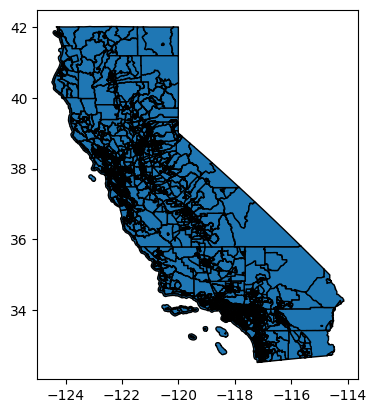

In [ ]:
import os
import geopandas as gpd

arquivos = [os.path.join("/content", f) for f in os.listdir("/content") if f.endswith(".shp")]
arquivo = max(arquivos, key=os.path.getmtime)
tl = gpd.read_file(arquivo).to_crs("EPSG:4326")
tl.plot(edgecolor="black")


In [ ]:
tl[["GEOID","geometry"]] ##TODO: Passar arquivo para HGI (CSV)

## BORO -> GEOID

,GEOID,geometry
0,06085504321,"POLYGON ((-121.87556 37.39924, -121.87535 37.3..."
1,06085504410,"POLYGON ((-121.88886 37.40758, -121.88576 37.4..."
2,06085507003,"POLYGON ((-122.02489 37.21683, -122.02458 37.2..."
3,06085507004,"POLYGON ((-121.99304 37.22562, -121.99249 37.2..."
4,06085502204,"POLYGON ((-121.93167 37.29803, -121.92801 37.3..."
...,...,...
9124,06059001303,"POLYGON ((-117.95917 33.92458, -117.95888 33.9..."
9125,06059001304,"POLYGON ((-117.95918 33.9282, -117.95831 33.92..."
9126,06059001401,"POLYGON ((-117.95056 33.94503, -117.95056 33.9..."
9127,06013367200,"POLYGON ((-122.34551 37.96355, -122.3455 37.96..."


In [ ]:
import geopandas as gpd
from shapely import wkt

boroughs = tl[["GEOID", "geometry"]].copy()
boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)

boroughs.to_csv(f"{diretorio_principal}/boroughs_area.csv", index=False)


/tmp/ipykernel_904/2001046065.py:5: UserWarning: Geometry column does not contain geometry.
  boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)


In [ ]:
boroughs

,GEOID,geometry
0,06085504321,"POLYGON ((-121.875559 37.39924, -121.875352 37..."
1,06085504410,"POLYGON ((-121.888863 37.407575, -121.885763 3..."
2,06085507003,"POLYGON ((-122.024891 37.216828, -122.024585 3..."
3,06085507004,"POLYGON ((-121.99304 37.22562, -121.99249 37.2..."
4,06085502204,"POLYGON ((-121.931674 37.29803, -121.928011 37..."
...,...,...
9124,06059001303,"POLYGON ((-117.959174 33.92458, -117.958881 33..."
9125,06059001304,"POLYGON ((-117.959178 33.928202, -117.958306 3..."
9126,06059001401,"POLYGON ((-117.950559 33.945034, -117.950555 3..."
9127,06013367200,"POLYGON ((-122.345508 37.963547, -122.3455 37...."


In [ ]:
!rm -rf /usr/local/lib/python3.12/dist-packages/~orch*
!pip cache purge


Files removed: 14 (3.1 MB)
Directories removed: 0


In [ ]:
%pip -q install -U pip setuptools wheel
%pip -q uninstall -y torch torchvision torchaudio torch-geometric torch-scatter torch-sparse torch-cluster torch-spline-conv pyg-lib
%pip -q install --no-cache-dir geopandas shapely libpysal h3 h3ronpy pyarrow scipy scikit-learn


In [ ]:
%pip -q install --no-cache-dir torch==2.4.0 torchvision==0.19.0 torchaudio==2.4.0 --index-url https://download.pytorch.org/whl/cpu
%pip -q install --no-cache-dir pyg-lib torch-scatter torch-sparse torch-cluster torch-spline-conv torch-geometric -f https://data.pyg.org/whl/torch-2.4.0+cpu.html


In [ ]:
%cd {diretorio_principal}

/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main


## POI Embedding

In [ ]:
FOLDER_ID_CRUS = "1cV807NNGn4gSDX-7fkJ83rlr0nRo4y89"
FOLDER_ID_SEPARATED = "1XUWhd59YDe8dSrTb6eZlLvhVcLSGpZ7n"

filename = f"checkins_{ESTADO}.csv"

path_crus = f"estados/crus/{filename}"
path_sep  = f"estados/separated/{filename}"

print("Baixando (crus)...")
download_from_folder_by_name(drive_service,FOLDER_ID_CRUS, filename, path_crus)

print("Baixando (separated)...")
download_from_folder_by_name(drive_service,FOLDER_ID_SEPARATED, filename, path_sep)

print("Concluído:", path_crus, "e", path_sep)


Baixando (crus)...
Baixando (separated)...


KeyboardInterrupt: 

In [ ]:
import pandas as pd, numpy as np, ast
import geopandas as gpd
from shapely.geometry import Point


CHECKIN_NAO_CRU = f"estados/crus/checkins_{ESTADO}.csv"
CHECKIN_CRU     = f"estados/separated/checkins_{ESTADO}.csv"
OUT_POIS        = "pois_gowalla.csv"

df_labeled = pd.read_csv(CHECKIN_NAO_CRU)
df_raw     = pd.read_csv(CHECKIN_CRU)

lon_col_raw = "lng" if "lng" in df_raw.columns else "longitude"
lat_col_raw = "lat" if "lat" in df_raw.columns else "latitude"
lon_col_lab = "lng" if "lng" in df_labeled.columns else ("longitude" if "longitude" in df_labeled.columns else None)
lat_col_lab = "lat" if "lat" in df_labeled.columns else ("latitude" if "latitude" in df_labeled.columns else None)

def parse_names(cell):
    try:
        lst = ast.literal_eval(cell)
        if isinstance(lst, list):
            return [d.get("name") for d in lst if isinstance(d, dict) and "name" in d]
    except Exception:
        pass
    return []

df_raw["__cat_names"] = df_raw["spot_categories"].fillna("[]").apply(parse_names)

def first_or_none(lst):
    return lst[0] if (isinstance(lst, list) and len(lst) > 0) else None

df_raw["__fclass_name"] = df_raw["__cat_names"].apply(first_or_none)

fclass_by_place = (df_raw.dropna(subset=["__fclass_name"])
                          .groupby("placeid")["__fclass_name"]
                          .agg(lambda s: s.mode().iat[0] if not s.mode().empty else s.iloc[0]))

cat_by_place = (df_labeled.dropna(subset=["category"])
                          .groupby("placeid")["category"]
                          .agg(lambda s: s.mode().iat[0] if not s.mode().empty else s.iloc[0]))

coords_raw = (df_raw.groupby("placeid")[[lat_col_raw, lon_col_raw]]
                    .mean()
                    .rename(columns={lat_col_raw: "latitude", lon_col_raw: "longitude"}))

if coords_raw.empty and lon_col_lab and lat_col_lab and (lon_col_lab in df_labeled.columns) and (lat_col_lab in df_labeled.columns):
    coords_raw = (df_labeled.groupby("placeid")[[lat_col_lab, lon_col_lab]]
                           .mean()
                           .rename(columns={lat_col_lab: "latitude", lon_col_lab: "longitude"}))

coords_raw = coords_raw.dropna()

pois = pd.DataFrame({"feature_id": coords_raw.index})
pois["feature_id"] = pois["feature_id"].astype(int)

pois["fclass_name"]   = fclass_by_place.reindex(pois["feature_id"]).values
pois["category_name"] = cat_by_place.reindex(pois["feature_id"]).values

pois = pois.dropna(subset=["fclass_name", "category_name"]).reset_index(drop=True)

gdf = gpd.GeoDataFrame(
    pois,
    geometry=gpd.points_from_xy(coords_raw.loc[pois["feature_id"], "longitude"].values,
                                coords_raw.loc[pois["feature_id"], "latitude"].values),
    crs="EPSG:4326"
)
gdf["geometry"] = gdf.geometry.apply(lambda p: p.wkt)

fclass_vocab = {n:i for i,n in enumerate(pd.Series(gdf["fclass_name"]).dropna().unique())}
cat_vocab    = {n:i for i,n in enumerate(pd.Series(gdf["category_name"]).dropna().unique())}

gdf["fclass"]   = gdf["fclass_name"].map(lambda n: fclass_vocab.get(n, -1)).astype(int)
gdf["category"] = gdf["category_name"].map(lambda n: cat_vocab.get(n, -1)).astype(int)

gdf = gdf[(gdf["fclass"]>=0) & (gdf["category"]>=0)].reset_index(drop=True)

pois_out = gdf[["feature_id", "category", "fclass", "geometry"]].copy()
pois_out.to_csv(OUT_POIS, index=False)



In [ ]:
# @title
import geopandas as gpd
from shapely.geometry import box

lat_min, lat_max = df["latitude"].min(), df["latitude"].max()
lon_min, lon_max = df["longitude"].min(), df["longitude"].max()
area = box(lon_min, lat_min, lon_max, lat_max).buffer(0.01)

boroughs = gpd.GeoDataFrame(geometry=[area], crs="EPSG:4326")

boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)
boroughs.to_csv("boroughs_area.csv", index=False)


In [ ]:
import sys
module_dir = f'{diretorio_principal}/region-embedding/baselines/poi-encoder'

sys.path.insert(0, module_dir)

In [ ]:
from POIEmbedding import PreProcess

PreProcess("pois_gowalla.csv", "boroughs_area.csv", h3=False).run() ##TODO H3 FALSO


In [ ]:
import pandas as pd
import numpy as np
import torch
from shapely import wkt

def build_node_features_from_location_encoder(pois_csv_path: str,
                                              loc_embed_pt_path: str,
                                              placeid_col: str = "feature_id"):

    df_pois = pd.read_csv(pois_csv_path)
    if df_pois["geometry"].dtype == object:
        df_pois["geometry"] = df_pois["geometry"].apply(wkt.loads)

    blob = torch.load(loc_embed_pt_path, map_location="cpu")
    E = blob["embeddings"].detach().cpu().numpy()
    placeids = [str(p) for p in blob["placeids"]]
    placeid2idx = {pid: i for i, pid in enumerate(placeids)}

    ids = df_pois[placeid_col].astype(str).tolist()
    D = E.shape[1]
    X = np.zeros((len(ids), D), dtype=np.float32)

    for i, pid in enumerate(ids):
        idx = placeid2idx.get(pid)
        if idx is None:
            raise KeyError(f"placeid {pid} não encontrado em {loc_embed_pt_path}. "
                           f"")
        X[i] = E[idx]

    return X, df_pois


In [ ]:
# @title
from POIEmbedding import POI2Vec
p = POI2Vec()
p.train()
p.save_walks()


In [ ]:
# @title
from POIEmbedding import POI2Vec
from model import POISet, EmbeddingModel
import torch, torch.utils.data as tud

poi2vec = POI2Vec()
poi2vec.read_walks()
poi2vec.get_global_second_class_walks()

second_class_hierarchy_pairs = list(set([tuple(x) for x in poi2vec.pois[["category","fclass"]].to_numpy()]))
dataset = POISet(
    poi2vec.second_class_number,
    poi2vec.second_class_walks,
    poi2vec.global_second_class_walks,
    k=5
)
model = EmbeddingModel(
    vocab_size=poi2vec.second_class_number,
    embed_size=64,
    second_class_hierarchy_pairs=second_class_hierarchy_pairs,
    le_lambda=1e-8
)

loader = tud.DataLoader(dataset, batch_size=2048, shuffle=True)
opt = torch.optim.Adam(model.parameters(), lr=5e-2)
for e in range(5):
    for i,(inp,pos,neg) in enumerate(loader):
        opt.zero_grad()
        loss,_ = model(inp.long(), pos.long(), neg.long())
        loss.backward()
        opt.step()

torch.save({f"in_embed_{ESTADO}.weight": model.clone_input_embedding()}, f"poi-encoder-gowalla-h3_{ESTADO}.tensor")


In [ ]:
print(f"poi-encoder-gowalla-h3_{ESTADO}.tensor")

## HGI

In [ ]:
import sys
module_dir = f'{diretorio_principal}/region-embedding/baselines/HGI/preprocess'

sys.path.insert(0, module_dir)

In [ ]:
import pandas as pd
import numpy as np
import torch
out_df = pd.read_csv(f"/content/drive/MyDrive/MTL_POI_Novo/data/output/{ESTADO.lower()}/embeddings-poi-encoder.csv")
out_df = out_df.sort_values("placeid").reset_index(drop=True)

placeids = out_df["placeid"].astype(str).tolist()

emb_cols = [c for c in out_df.columns if c.isnumeric()]
E = out_df[emb_cols].to_numpy(dtype=np.float32)

torch.save({
    "embeddings": torch.from_numpy(E),
    "placeids": placeids
}, f"/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main/poi_embeddings_encoder.pt")

print("Arquivo salvo com sucesso!")
print(E.shape, "embeddings salvos")


In [ ]:
import torch, numpy as np, pandas as pd
from torch_geometric.data import Data
from main import Preprocess

POIS = "pois_gowalla.csv"
REGS = "boroughs_area.csv"

data_dict = Preprocess(POIS, REGS, emb_filename=None, h3=False).get_data_torch()

loc_pt_path = "/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main/poi_embeddings_encoder.pt"
blob = torch.load(loc_pt_path, map_location="cpu")
E = blob["embeddings"].detach().cpu().numpy()
placeids = [str(p) for p in blob["placeids"]]
placeid2idx = {pid: i for i, pid in enumerate(placeids)}
D = E.shape[1]

order = pd.read_csv("poi_index.csv")
order["feature_id"] = order["feature_id"].astype(str)

X = np.zeros((len(order), D), dtype=np.float32)
for i, pid in enumerate(order["feature_id"].tolist()):
    idx = placeid2idx.get(pid)
    if idx is None:
        raise KeyError(f"placeid {pid} não encontrado em {loc_pt_path}. Gere embeddings para todos os POIs.")
    X[i] = E[idx]

import numpy as np
ei = np.asarray(data_dict['edge_index'])
assert ei.max() < X.shape[0], "edge_index referencia nó >= len(X) — ordem quebrou"

g = Data(
    x=torch.tensor(X, dtype=torch.float32),
    edge_index=torch.tensor(data_dict['edge_index'], dtype=torch.long),
    edge_weight=torch.tensor(data_dict['edge_weight'], dtype=torch.float32),
)
g.region_id  = torch.tensor(data_dict['region_id'], dtype=torch.long)
g.region_area = torch.tensor(data_dict['region_area'], dtype=torch.float32)
g.coarse_region_similarity = torch.tensor(data_dict['coarse_region_similarity'], dtype=torch.float32)
g.region_adjacency = torch.tensor(data_dict['region_adjacency'], dtype=torch.long)

torch.save(g, "gowalla.pt")


In [ ]:
import os, pickle as pkl, torch
from torch_geometric.data import Data

os.makedirs("./data", exist_ok=True)

g = torch.load("./gowalla.pt", map_location="cpu")

data_dict = {
    "node_features": g.x.detach().cpu().numpy(),
    "edge_index": g.edge_index.detach().cpu().numpy(),
    "edge_weight": g.edge_weight.detach().cpu().numpy(),
    "region_id": g.region_id.detach().cpu().numpy(),
    "region_area": g.region_area.detach().cpu().numpy(),
    "coarse_region_similarity": g.coarse_region_similarity.detach().cpu().numpy(),
    "region_adjacency": g.region_adjacency.detach().cpu().numpy(),
}

with open("./data/gowalla_hgi_data.pkl", "wb") as f:
    pkl.dump(data_dict, f)



In [ ]:
import numpy as np

R_from_id = int(np.max(data_dict["region_id"])) + 1
R_area    = len(data_dict["region_area"])
R_adj     = int(data_dict["region_adjacency"].max()) + 1
R_sim     = data_dict["coarse_region_similarity"].shape[0]

print("R from id :", R_from_id)
print("R area    :", R_area)
print("R adj     :", R_adj)
print("R sim     :", R_sim)

assert R_from_id == R_area == R_adj == R_sim, "Desalinhad"


In [ ]:
%pip uninstall -y torch torchvision torchaudio torch-geometric torch-scatter torch-sparse torch-cluster torch-spline-conv pyg-lib

%pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121
%pip install --no-cache-dir pyg-lib torch-scatter torch-sparse torch-cluster torch-spline-conv torch-geometric \
  -f https://data.pyg.org/whl/torch-2.4.0+cu121.html


In [ ]:
!python {diretorio_principal}/region-embedding/baselines/HGI/train.py --city gowalla --dim 64 --alpha 0.5 --attention_head 4 --epoch 300 --device cuda --save_name gowalla_h3


# Texas


Census: https://catalog.data.gov/dataset/tiger-line-shapefile-2021-state-nebraska-census-tracts

In [ ]:
ESTADO = "Texas"

In [ ]:
diretorio_principal = "/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main/"

In [ ]:
baixar_shapefile_estado("texas")

<Axes: >

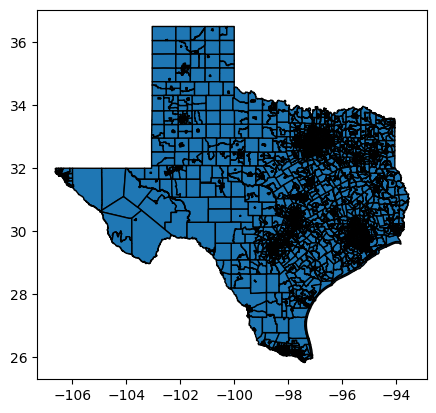

In [ ]:
import os
import geopandas as gpd

arquivos = [os.path.join("/content", f) for f in os.listdir("/content") if f.endswith(".shp")]
arquivo = max(arquivos, key=os.path.getmtime)
tl = gpd.read_file(arquivo).to_crs("EPSG:4326")
tl.plot(edgecolor="black")


In [ ]:
tl[["GEOID","geometry"]] ##TODO: Passar arquivo para HGI (CSV)

## BORO -> GEOID

,GEOID,geometry
0,48029181703,"POLYGON ((-98.66364 29.52305, -98.66362 29.523..."
1,48029181704,"POLYGON ((-98.64667 29.51503, -98.64662 29.515..."
2,48029181705,"POLYGON ((-98.62996 29.48352, -98.62941 29.483..."
3,48029181711,"POLYGON ((-98.6624 29.51902, -98.66032 29.5190..."
4,48029181712,"POLYGON ((-98.66609 29.48504, -98.66604 29.485..."
...,...,...
6891,48061012700,"POLYGON ((-97.43569 25.93883, -97.43284 25.940..."
6892,48061013203,"POLYGON ((-97.44636 25.93246, -97.44635 25.932..."
6893,48061012508,"POLYGON ((-97.61874 25.98202, -97.61838 25.982..."
6894,48061011903,"POLYGON ((-97.86217 26.06111, -97.86176 26.062..."


In [ ]:
import geopandas as gpd
from shapely import wkt

boroughs = tl[["GEOID", "geometry"]].copy()
boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)

boroughs.to_csv(f"{diretorio_principal}/boroughs_area.csv", index=False)


/tmp/ipython-input-2001046065.py:5: UserWarning: Geometry column does not contain geometry.
  boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)


In [ ]:
boroughs

,GEOID,geometry
0,01079979201,"POLYGON ((-87.436107 34.727427, -87.436104 34...."
1,01079979202,"POLYGON ((-87.45696 34.613518, -87.456933 34.6..."
2,01079979502,"POLYGON ((-87.296137 34.543373, -87.296104 34...."
3,01079979501,"POLYGON ((-87.20741 34.557097, -87.2074 34.557..."
4,01009050103,"POLYGON ((-86.572293 33.820705, -86.572291 33...."
...,...,...
1432,01087232200,"POLYGON ((-86.023164 32.419268, -86.02312 32.4..."
1433,01087232000,"POLYGON ((-85.713356 32.446634, -85.713179 32...."
1434,01087231500,"POLYGON ((-85.886148 32.493053, -85.885746 32...."
1435,01087231400,"POLYGON ((-85.647973 32.444578, -85.64626 32.4..."


In [ ]:
!rm -rf /usr/local/lib/python3.12/dist-packages/~orch*
!pip cache purge


Files removed: 6 (250 kB)


In [ ]:
%pip -q install -U pip setuptools wheel
%pip -q uninstall -y torch torchvision torchaudio torch-geometric torch-scatter torch-sparse torch-cluster torch-spline-conv pyg-lib
%pip -q install --no-cache-dir geopandas shapely libpysal h3 h3ronpy pyarrow scipy scikit-learn


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 44.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 77.9 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ipython 7.34.0 requires jedi>=0.16, which is not installed.


In [ ]:
%pip -q install --no-cache-dir torch==2.4.0 torchvision==0.19.0 torchaudio==2.4.0 --index-url https://download.pytorch.org/whl/cpu
%pip -q install --no-cache-dir pyg-lib torch-scatter torch-sparse torch-cluster torch-spline-conv torch-geometric -f https://data.pyg.org/whl/torch-2.4.0+cpu.html


In [ ]:
%cd {diretorio_principal}

/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main


## POI Embedding

In [ ]:
FOLDER_ID_CRUS = "1cV807NNGn4gSDX-7fkJ83rlr0nRo4y89"
FOLDER_ID_SEPARATED = "1XUWhd59YDe8dSrTb6eZlLvhVcLSGpZ7n"

filename = f"checkins_{ESTADO}.csv"

path_crus = f"estados/crus/{filename}"
path_sep  = f"estados/separated/{filename}"

print("Baixando (crus)...")
download_from_folder_by_name(drive_service,FOLDER_ID_CRUS, filename, path_crus)

print("Baixando (separated)...")
download_from_folder_by_name(drive_service,FOLDER_ID_SEPARATED, filename, path_sep)

print("Concluído:", path_crus, "e", path_sep)


Baixando (crus)...
Baixando (separated)...
Concluído: estados/crus/checkins_Texas.csv e estados/separated/checkins_Texas.csv


In [ ]:
import pandas as pd, numpy as np, ast
import geopandas as gpd
from shapely.geometry import Point


CHECKIN_NAO_CRU = f"estados/crus/checkins_{ESTADO}.csv"
CHECKIN_CRU     = f"estados/separated/checkins_{ESTADO}.csv"
OUT_POIS        = "pois_gowalla.csv"

df_labeled = pd.read_csv(CHECKIN_NAO_CRU)
df_raw     = pd.read_csv(CHECKIN_CRU)

lon_col_raw = "lng" if "lng" in df_raw.columns else "longitude"
lat_col_raw = "lat" if "lat" in df_raw.columns else "latitude"
lon_col_lab = "lng" if "lng" in df_labeled.columns else ("longitude" if "longitude" in df_labeled.columns else None)
lat_col_lab = "lat" if "lat" in df_labeled.columns else ("latitude" if "latitude" in df_labeled.columns else None)

def parse_names(cell):
    try:
        lst = ast.literal_eval(cell)
        if isinstance(lst, list):
            return [d.get("name") for d in lst if isinstance(d, dict) and "name" in d]
    except Exception:
        pass
    return []

df_raw["__cat_names"] = df_raw["spot_categories"].fillna("[]").apply(parse_names)

def first_or_none(lst):
    return lst[0] if (isinstance(lst, list) and len(lst) > 0) else None

df_raw["__fclass_name"] = df_raw["__cat_names"].apply(first_or_none)

fclass_by_place = (df_raw.dropna(subset=["__fclass_name"])
                          .groupby("placeid")["__fclass_name"]
                          .agg(lambda s: s.mode().iat[0] if not s.mode().empty else s.iloc[0]))

cat_by_place = (df_labeled.dropna(subset=["category"])
                          .groupby("placeid")["category"]
                          .agg(lambda s: s.mode().iat[0] if not s.mode().empty else s.iloc[0]))

coords_raw = (df_raw.groupby("placeid")[[lat_col_raw, lon_col_raw]]
                    .mean()
                    .rename(columns={lat_col_raw: "latitude", lon_col_raw: "longitude"}))

if coords_raw.empty and lon_col_lab and lat_col_lab and (lon_col_lab in df_labeled.columns) and (lat_col_lab in df_labeled.columns):
    coords_raw = (df_labeled.groupby("placeid")[[lat_col_lab, lon_col_lab]]
                           .mean()
                           .rename(columns={lat_col_lab: "latitude", lon_col_lab: "longitude"}))

coords_raw = coords_raw.dropna()

pois = pd.DataFrame({"feature_id": coords_raw.index})
pois["feature_id"] = pois["feature_id"].astype(int)

pois["fclass_name"]   = fclass_by_place.reindex(pois["feature_id"]).values
pois["category_name"] = cat_by_place.reindex(pois["feature_id"]).values

pois = pois.dropna(subset=["fclass_name", "category_name"]).reset_index(drop=True)

gdf = gpd.GeoDataFrame(
    pois,
    geometry=gpd.points_from_xy(coords_raw.loc[pois["feature_id"], "longitude"].values,
                                coords_raw.loc[pois["feature_id"], "latitude"].values),
    crs="EPSG:4326"
)
gdf["geometry"] = gdf.geometry.apply(lambda p: p.wkt)

fclass_vocab = {n:i for i,n in enumerate(pd.Series(gdf["fclass_name"]).dropna().unique())}
cat_vocab    = {n:i for i,n in enumerate(pd.Series(gdf["category_name"]).dropna().unique())}

gdf["fclass"]   = gdf["fclass_name"].map(lambda n: fclass_vocab.get(n, -1)).astype(int)
gdf["category"] = gdf["category_name"].map(lambda n: cat_vocab.get(n, -1)).astype(int)

gdf = gdf[(gdf["fclass"]>=0) & (gdf["category"]>=0)].reset_index(drop=True)

pois_out = gdf[["feature_id", "category", "fclass", "geometry"]].copy()
pois_out.to_csv(OUT_POIS, index=False)



/tmp/ipython-input-2811998353.py:67: UserWarning: Geometry column does not contain geometry.
  gdf["geometry"] = gdf.geometry.apply(lambda p: p.wkt)


In [ ]:
# @title
import geopandas as gpd
from shapely.geometry import box

lat_min, lat_max = df["latitude"].min(), df["latitude"].max()
lon_min, lon_max = df["longitude"].min(), df["longitude"].max()
area = box(lon_min, lat_min, lon_max, lat_max).buffer(0.01)

boroughs = gpd.GeoDataFrame(geometry=[area], crs="EPSG:4326")

boroughs["geometry"] = boroughs["geometry"].apply(lambda g: g.wkt)
boroughs.to_csv("boroughs_area.csv", index=False)


In [ ]:
import sys
module_dir = f'{diretorio_principal}/region-embedding/baselines/poi-encoder'

sys.path.insert(0, module_dir)

In [ ]:
from POIEmbedding import PreProcess

PreProcess("pois_gowalla.csv", "boroughs_area.csv", h3=False).run() ##TODO H3 FALSO


In [ ]:
import pandas as pd
import numpy as np
import torch
from shapely import wkt

def build_node_features_from_location_encoder(pois_csv_path: str,
                                              loc_embed_pt_path: str,
                                              placeid_col: str = "feature_id"):

    df_pois = pd.read_csv(pois_csv_path)
    if df_pois["geometry"].dtype == object:
        df_pois["geometry"] = df_pois["geometry"].apply(wkt.loads)

    blob = torch.load(loc_embed_pt_path, map_location="cpu")
    E = blob["embeddings"].detach().cpu().numpy()
    placeids = [str(p) for p in blob["placeids"]]
    placeid2idx = {pid: i for i, pid in enumerate(placeids)}

    ids = df_pois[placeid_col].astype(str).tolist()
    D = E.shape[1]
    X = np.zeros((len(ids), D), dtype=np.float32)

    for i, pid in enumerate(ids):
        idx = placeid2idx.get(pid)
        if idx is None:
            raise KeyError(f"placeid {pid} não encontrado em {loc_embed_pt_path}. "
                           f"")
        X[i] = E[idx]

    return X, df_pois


In [ ]:
# @title
from POIEmbedding import POI2Vec
p = POI2Vec()
p.train()
p.save_walks()


In [ ]:
# @title
from POIEmbedding import POI2Vec
from model import POISet, EmbeddingModel
import torch, torch.utils.data as tud

poi2vec = POI2Vec()
poi2vec.read_walks()
poi2vec.get_global_second_class_walks()

second_class_hierarchy_pairs = list(set([tuple(x) for x in poi2vec.pois[["category","fclass"]].to_numpy()]))
dataset = POISet(
    poi2vec.second_class_number,
    poi2vec.second_class_walks,
    poi2vec.global_second_class_walks,
    k=5
)
model = EmbeddingModel(
    vocab_size=poi2vec.second_class_number,
    embed_size=64,
    second_class_hierarchy_pairs=second_class_hierarchy_pairs,
    le_lambda=1e-8
)

loader = tud.DataLoader(dataset, batch_size=2048, shuffle=True)
opt = torch.optim.Adam(model.parameters(), lr=5e-2)
for e in range(5):
    for i,(inp,pos,neg) in enumerate(loader):
        opt.zero_grad()
        loss,_ = model(inp.long(), pos.long(), neg.long())
        loss.backward()
        opt.step()

torch.save({f"in_embed_{ESTADO}.weight": model.clone_input_embedding()}, f"poi-encoder-gowalla-h3_{ESTADO}.tensor")


In [ ]:
print(f"poi-encoder-gowalla-h3_{ESTADO}.tensor")

poi-encoder-gowalla-h3_Montana.tensor


## HGI

In [ ]:
import sys
module_dir = f'{diretorio_principal}/region-embedding/baselines/HGI/preprocess'

sys.path.insert(0, module_dir)

In [ ]:
import pandas as pd
import numpy as np
import torch
out_df = pd.read_csv(f"/content/drive/MyDrive/MTL_POI_Novo/data/output/{ESTADO.lower()}/embeddings-poi-encoder.csv")
out_df = out_df.sort_values("placeid").reset_index(drop=True)

placeids = out_df["placeid"].astype(str).tolist()

emb_cols = [c for c in out_df.columns if c.isnumeric()]
E = out_df[emb_cols].to_numpy(dtype=np.float32)

torch.save({
    "embeddings": torch.from_numpy(E),
    "placeids": placeids
}, f"/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main/poi_embeddings_encoder.pt")

print("Arquivo salvo com sucesso!")
print(E.shape, "embeddings salvos")


Arquivo salvo com sucesso!
(3355419, 128) embeddings salvos


In [ ]:
import torch, numpy as np, pandas as pd
from torch_geometric.data import Data
from main import Preprocess

POIS = "pois_gowalla.csv"
REGS = "boroughs_area.csv"

data_dict = Preprocess(POIS, REGS, emb_filename=None, h3=False).get_data_torch()

loc_pt_path = "/content/drive/MyDrive/region-embedding-benchmark-main/region-embedding-benchmark-main/poi_embeddings_encoder.pt"
blob = torch.load(loc_pt_path, map_location="cpu")
E = blob["embeddings"].detach().cpu().numpy()
placeids = [str(p) for p in blob["placeids"]]
placeid2idx = {pid: i for i, pid in enumerate(placeids)}
D = E.shape[1]

order = pd.read_csv("poi_index.csv")
order["feature_id"] = order["feature_id"].astype(str)

X = np.zeros((len(order), D), dtype=np.float32)
for i, pid in enumerate(order["feature_id"].tolist()):
    idx = placeid2idx.get(pid)
    if idx is None:
        raise KeyError(f"placeid {pid} não encontrado em {loc_pt_path}. Gere embeddings para todos os POIs.")
    X[i] = E[idx]

import numpy as np
ei = np.asarray(data_dict['edge_index'])
assert ei.max() < X.shape[0], "edge_index referencia nó >= len(X) — ordem quebrou"

g = Data(
    x=torch.tensor(X, dtype=torch.float32),
    edge_index=torch.tensor(data_dict['edge_index'], dtype=torch.long),
    edge_weight=torch.tensor(data_dict['edge_weight'], dtype=torch.float32),
)
g.region_id  = torch.tensor(data_dict['region_id'], dtype=torch.long)
g.region_area = torch.tensor(data_dict['region_area'], dtype=torch.float32)
g.coarse_region_similarity = torch.tensor(data_dict['coarse_region_similarity'], dtype=torch.float32)
g.region_adjacency = torch.tensor(data_dict['region_adjacency'], dtype=torch.long)

torch.save(g, "gowalla.pt")


reading poi data
reading boroughs data


/usr/local/lib/python3.12/dist-packages/libpysal/weights/util.py:1618: UserWarning: The weights matrix is not fully connected: 
 There are 11 disconnected components.
 There are 5 islands with ids: 5136, 5236, 5243, 6103, 6443.
  return W(neighbors, **kwargs)


reading boroughs data
creating graph
        feature_id  category  fclass                    geometry  index_right  \
0             8932         0       0  POINT (-97.25436 32.92766)          585   
1             8956         1       1   POINT (-97.1312 32.94266)         6665   
2             8957         2       2  POINT (-97.13121 32.94222)         6665   
3             8982         0       3  POINT (-97.12971 32.94532)         6665   
4             8988         0       4  POINT (-97.13064 32.94296)         6665   
...            ...       ...     ...                         ...          ...   
135565     7614656         0       3   POINT (-97.10089 32.9095)           34   
135566     7622095         5      48  POINT (-97.16867 26.13737)         2350   
135567     7632652         4      86  POINT (-96.65872 32.83392)         6459   
135568     7670173         0       0  POINT (-97.16329 30.01088)          126   
135569     7712011         6     149   POINT (-97.0632 32.95414)        

/usr/local/lib/python3.12/dist-packages/libpysal/weights/util.py:1618: UserWarning: The weights matrix is not fully connected: 
 There are 11 disconnected components.
 There are 5 islands with ids: 5136, 5236, 5243, 6103, 6443.
  return W(neighbors, **kwargs)
/tmp/ipython-input-1748186182.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weight

creating region similarity by cosine similarity of embeddings
finishing preprocessing


In [ ]:
import os, pickle as pkl, torch
from torch_geometric.data import Data

os.makedirs("./data", exist_ok=True)

g = torch.load("./gowalla.pt", map_location="cpu")

data_dict = {
    "node_features": g.x.detach().cpu().numpy(),
    "edge_index": g.edge_index.detach().cpu().numpy(),
    "edge_weight": g.edge_weight.detach().cpu().numpy(),
    "region_id": g.region_id.detach().cpu().numpy(),
    "region_area": g.region_area.detach().cpu().numpy(),
    "coarse_region_similarity": g.coarse_region_similarity.detach().cpu().numpy(),
    "region_adjacency": g.region_adjacency.detach().cpu().numpy(),
}

with open("./data/gowalla_hgi_data.pkl", "wb") as f:
    pkl.dump(data_dict, f)



/tmp/ipython-input-1595378934.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  g = torch.load("./gowalla.pt", map_location="cpu")


In [ ]:
import numpy as np

R_from_id = int(np.max(data_dict["region_id"])) + 1
R_area    = len(data_dict["region_area"])
R_adj     = int(data_dict["region_adjacency"].max()) + 1
R_sim     = data_dict["coarse_region_similarity"].shape[0]

print("R from id :", R_from_id)
print("R area    :", R_area)
print("R adj     :", R_adj)
print("R sim     :", R_sim)

assert R_from_id == R_area == R_adj == R_sim, "Desalinhad"


R from id : 1072
R area    : 1072
R adj     : 1072
R sim     : 1072


In [ ]:
%pip uninstall -y torch torchvision torchaudio torch-geometric torch-scatter torch-sparse torch-cluster torch-spline-conv pyg-lib

%pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121
%pip install --no-cache-dir pyg-lib torch-scatter torch-sparse torch-cluster torch-spline-conv torch-geometric \
  -f https://data.pyg.org/whl/torch-2.4.0+cu121.html


Found existing installation: torch 2.4.0+cpu
Uninstalling torch-2.4.0+cpu:
  Successfully uninstalled torch-2.4.0+cpu
Found existing installation: torchvision 0.19.0+cpu
Uninstalling torchvision-0.19.0+cpu:
  Successfully uninstalled torchvision-0.19.0+cpu
Found existing installation: torchaudio 2.4.0+cpu
Uninstalling torchaudio-2.4.0+cpu:
  Successfully uninstalled torchaudio-2.4.0+cpu
Found existing installation: torch-geometric 2.7.0
Uninstalling torch-geometric-2.7.0:
  Successfully uninstalled torch-geometric-2.7.0
Found existing installation: torch_scatter 2.1.2+pt24cpu
Uninstalling torch_scatter-2.1.2+pt24cpu:
  Successfully uninstalled torch_scatter-2.1.2+pt24cpu
Found existing installation: torch_sparse 0.6.18+pt24cpu
Uninstalling torch_sparse-0.6.18+pt24cpu:
  Successfully uninstalled torch_sparse-0.6.18+pt24cpu
Found existing installation: torch_cluster 1.6.3+pt24cpu
Uninstalling torch_cluster-1.6.3+pt24cpu:
  Successfully uninstalled torch_cluster-1.6.3+pt24cpu
Found existi

In [ ]:
!python {diretorio_principal}/region-embedding/baselines/HGI/train.py --city gowalla --dim 64 --alpha 0.5 --attention_head 4 --epoch 300 --device cuda --save_name gowalla_h3


Streaming output truncated to the last 5000 lines.
        [-0.0659,  0.1059,  0.0974,  ...,  0.0409,  0.1050,  0.0242]],
       device='cuda:0', requires_grad=True) Parameter containing:
tensor([[-0.0545, -0.0378, -0.1213,  ...,  0.0355,  0.0417, -0.0837],
        [ 0.0063,  0.0853, -0.0848,  ..., -0.1109, -0.0416,  0.0503],
        [-0.0234,  0.0929,  0.0561,  ..., -0.0275, -0.1282, -0.0329],
        ...,
        [-0.1025,  0.1198,  0.1040,  ..., -0.1261, -0.0010,  0.0923],
        [-0.0690, -0.0749,  0.0232,  ...,  0.0342, -0.1143, -0.0721],
        [-0.0605, -0.0488, -0.0109,  ..., -0.0565,  0.0131,  0.0643]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[ 0.0523, -0.0070, -0.0904,  ..., -0.1168,  0.0770,  0.0438],
        [-0.0415, -0.0297, -0.1068,  ...,  0.0067,  0.0144, -0.0840],
        [-0.0640, -0.0210, -0.0316,  ..., -0.1110,  0.0130,  0.0101],
        ...,
        [-0.0016,  0.0425, -0.0296,  ...,  0.1435,  0.0176, -0.0440],
        [-0.0080,  